In [1]:
%matplotlib inline
# N1 - 
# Scheduling V3, 
# Reward Function 1c, 
# Update = 18, 
# Iterations = 100, 
# 1xLeRELU, 
# HUBER

In [2]:
from datetime import datetime
import os
from os.path import dirname, abspath, join
from os import getcwd
import sys

In [3]:
import random
import string
import pandas as pd
import numpy as np

In [4]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [5]:
import torch
import socket
from IPython.display import clear_output

In [6]:
# seed_arg = int(sys.argv[1])
# print ("\n\nSeed ARG: ",seed_arg)
seed_arg = 4

In [7]:
seedlist = np.array([161, 314, 228, 271828, 230, 4271031, 5526538, 6610165, 9849252, 34534, 73422, 8765])
seed = seedlist[seed_arg]
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

In [8]:
NAME       = 'I1'
MODELNAME  = NAME + '_' + str(seed) + '.pt'
print("\nMODEL : ", NAME)
print("SEED  : ",seed_arg)
print("HOST  : ",socket.gethostname())


MODEL :  I1
SEED  :  4
HOST  :  seti


In [9]:
# !jupyter nbconvert --output-dir='./py_scripts' --to script N1.ipynb

In [10]:
class ENO(object):
    
    #no. of forecast types is 6 ranging from 0 to 5
  
    def __init__(self, location='tokyo', year=2010, shuffle=False, day_balance=False):
        self.location = location
        self.year = year
        self.day = None
        self.hr = None
        
        self.shuffle = shuffle
        self.day_balance = day_balance

        self.TIME_STEPS = None #no. of time steps in one episode
        self.NO_OF_DAYS = None #no. of days in one year
        
        self.NO_OF_DAYTYPE = 10 #no. of daytypes
        self.daycounter = 0 #to count number of days that have been passed
        
        self.sradiation = None #matrix with GSR for the entire year
        self.senergy = None #matrix with harvested energy data for the entire year
        self.fforecast = None #array with forecast values for each day
        

        self.henergy = None #harvested energy variable
        self.fcast = None #forecast variable
        self.sorted_days = [] #days sorted according to day type
        
        self.SMAX = 1000 # 1 Watt Solar Panel

    
    #function to get the solar data for the given location and year and prep it
    def get_data(self):
        #solar_data/CSV files contain the values of GSR (Global Solar Radiation in MegaJoules per meters squared per hour)
        #weather_data/CSV files contain the weather summary from 06:00 to 18:00 and 18:00 to 06:00+1
        location = self.location
        year = self.year

        THIS_DIR = getcwd()
        SDATA_DIR = abspath(join(THIS_DIR, 'solar_data'))  #abspath(join(THIS_DIR, '../../..', 'data'))
        
        sfile = SDATA_DIR + '/' + location +'/' + str(year) + '.csv'
        
        #skiprows=4 to remove unnecessary title texts
        #usecols=4 to read only the Global Solar Radiation (GSR) values
        solar_radiation = pd.read_csv(sfile, skiprows=4, encoding='shift_jisx0213', usecols=[4])
      
        #convert dataframe to numpy array
        solar_radiation = solar_radiation.values

        #convert missing data in CSV files to zero
        solar_radiation[np.isnan(solar_radiation)] = 0

        #reshape solar_radiation into no_of_daysx24 array
        solar_radiation = solar_radiation.reshape(-1,24)

        if(self.shuffle): #if class instatiation calls for shuffling the day order. Required when learning
            np.random.shuffle(solar_radiation) 
        self.sradiation = solar_radiation
        
        #GSR values (in MJ/sq.mts per hour) need to be expressed in mW
        # Conversion is accomplished by 
        # solar_energy = GSR(in MJ/m2/hr) * 1e6 * size of solar cell * efficiency of solar cell /(60x60) *1000 (to express in mW)
        # the factor of 2 in the end is assuming two solar cells
        self.senergy = 2*self.sradiation * 1e6 * (55e-3 * 70e-3) * 0.15 * 1000/(60*60)

        return 0
    
    #function to map total day radiation into type of day ranging from 0 to 5
    #the classification into day types is quite arbitrary. There is no solid logic behind this type of classification.
    
    def get_day_state(self,tot_day_radiation):
        bin_edges = np.array([0, 3.5, 6.5, 9.0, 12.5, 15.5, 18.5, 22.0, 25, 28])
        for k in np.arange(1,bin_edges.size):
            if (bin_edges[k-1] < tot_day_radiation <= bin_edges[k]):
                day_state = k -1
            else:
                day_state = bin_edges.size - 1
        return int(day_state)
    
    def get_forecast(self):
        #create a perfect forecaster.
        tot_day_radiation = np.sum(self.sradiation, axis=1) #contains total solar radiation for each day
        get_day_state = np.vectorize(self.get_day_state)
        self.fforecast = get_day_state(tot_day_radiation)
        
        #sort days depending on the type of day and shuffle them; maybe required when learning
        for fcast in range(0,6):
            fcast_days = ([i for i,x in enumerate(self.fforecast) if x == fcast])
            np.random.shuffle(fcast_days)
            self.sorted_days.append(fcast_days)
        return 0
    
    def reset(self,day=0): #it is possible to reset to the beginning of a certain day
        
        self.get_data() #first get data for the given year
        self.get_forecast() #calculate the forecast
        
        self.TIME_STEPS = self.senergy.shape[1]
        self.NO_OF_DAYS = self.senergy.shape[0]
        
        self.day = day
        self.hr = 0
        
        self.henergy = self.senergy[self.day][self.hr]
        self.fcast = self.fforecast[self.day]
        
        end_of_day = False
        end_of_year = False
        return [self.henergy, self.fcast, end_of_day, end_of_year]

    
    def step(self):
        end_of_day = False
        end_of_year = False
        if not(self.day_balance): #if daytype balance is not required
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr] 
                self.fcast = self.fforecast[self.day]
            else:
                if(self.day < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.hr = 0
                    self.day += 1
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else:
                    end_of_day = True
                    end_of_year = True
                    
        else: #when training, we want all daytypes to be equally represented for robust policy
              #obviously, the days are going to be in random order
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr]
                self.fcast = self.fforecast[self.day]
            else:
                if(self.daycounter < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.daycounter += 1
                    self.hr = 0
                    daytype = random.choice(np.arange(0,self.NO_OF_DAYTYPE)) #choose random daytype
                    self.day = np.random.choice(self.sorted_days[daytype]) #choose random day from that daytype
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else: 
                    end_of_day = True
                    end_of_year = True
                    self.daycounter = 0
        
        
        return [self.henergy, self.fcast, end_of_day, end_of_year]

In [11]:
class CAPM (object):
    def __init__(self,location='tokyo', year=2010, shuffle=False, trainmode=False):

        #all energy values i.e. BMIN, BMAX, BOPT, HMAX are in mWhr. Assuming one timestep is one hour
        
        self.BMIN = 0.0                #Minimum battery level that is tolerated. Maybe non-zero also
        self.BMAX = 10000.0            #Max Battery Level. May not necessarily be equal to total batter capacity [3.6V x 2500mAh]
        self.BOPT = 0.5 * self.BMAX    #Optimal Battery Level. Assuming 50% of battery is the optimum
        self.BLIM_LO = 0.15*self.BMAX
        self.BLIM_HI = 0.95*self.BMAX
        self.BSAFE_LO = 0.35*self.BMAX
        self.BSAFE_HI = 0.65*self.BMAX
        
        self.ENP_MARGIN = 0.3*self.BMAX

        
        self.HMIN = 0      #Minimum energy that can be harvested by the solar panel.
        self.HMAX = None   #Maximum energy that can be harvested by the solar panel. [500mW]
        
        self.DMAX = 500      #Maximum energy that can be consumed by the node in one time step. [~ 3.6V x 135mA]
        self.N_ACTIONS = 10  #No. of different duty cycles possible
        self.DMIN = self.DMAX/self.N_ACTIONS #Minimum energy that can be consumed by the node in one time step. [~ 3.6V x 15mA]
        
        self.binit = None     #battery at the beginning of day
        self.btrack = []      #track the mean battery level for each day
        self.atrack = []      #track the duty cycles for each day
        self.htrack = []      #track the harvested for each day
        self.batt = None      #battery variable
        self.enp = None       #enp at end of hr
        self.henergy = None   #harvested energy variable
        self.fcast = None     #forecast variable
        
        self.MUBATT = 0.6
        self.SDBATT = 0.02
        
        self.MUHENERGY = 0.5
        self.SDHENERGY = 0.2
        
        self.MUENP = 0
        self.SDENP = 0.02
        
        self.location  = location
        self.year      = year
        self.shuffle   = shuffle
        self.trainmode = trainmode
        self.eno       = None
        
        self.day_violation_flag = False
        self.violation_flag     = False
        self.violation_counter  = 0
        
        self.batt_violations    = 0

        self.NO_OF_DAYTYPE      = 10 #no. of daytypes
 
    def reset(self,day=0,batt=-1):
        henergy, fcast, day_end, year_end = self.eno.reset(day) #reset the eno environment
        self.violation_flag = False
        self.violation_counter = 0
        self.batt_violations = 0
        
        if(batt == -1):
            self.batt = self.BOPT
        else:
            self.batt = batt
            
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX)
        self.binit = self.batt
        self.btrack = np.append(self.btrack, self.batt) #track battery levels

        self.enp = self.BOPT - self.batt
#         self.enp = self.binit - self.batt #enp is calculated
        self.henergy = np.clip(henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
        self.fcast = fcast
        
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        reward = 0
        
        return [c_state, reward, day_end, year_end]
    
    def getstate(self): #query the present state of the system
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        return c_state
        
    
    #reward function
    def rewardfn(self):
        violation_penalty = 0
        reward = 0
        
        if np.abs(self.enp) < self.ENP_MARGIN:
            sharpness = 15
            reward = 2 - 3/ (1 + np.exp(-sharpness*(np.abs(self.enp) - self.ENP_MARGIN/4)/self.BMAX))
        else:
            reward = -5*np.abs(self.enp/self.BMAX)+0.6
                
        if(self.day_violation_flag):
            violation_penalty += 3    #penalty for violating battery limits anytime during the day
        
        return (reward - violation_penalty)
    
    def step(self, action):
        day_end = False
        year_end = False
        self.violation_flag = False
        reward = 0
        self.atrack = np.append(self.atrack, action+1) #track duty cycles
        self.htrack = np.append(self.htrack, self.henergy)

#         action_var = np.abs(np.mean(self.atrack) - action)/9 #can vary from 0 to 1
#         reward += 0.25*(0.5 - action_var ) #reward penalizing high duty cycle variance [-0.5 to 0.5]*0.25
      
        action = np.clip(action, 0, self.N_ACTIONS-1) #action values range from (0 to N_ACTIONS-1)
        e_consumed = (action+1)*self.DMAX/self.N_ACTIONS   #energy consumed by the node
        
        
        self.batt += (self.henergy - e_consumed)
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
                self.batt_violations += 1
        
        if(self.batt < self.BLIM_LO or self.batt > self.BLIM_HI ):
            self.violation_flag = True #penalty for violating battery limits everytime it happens
            reward -= 2
            if(self.batt < self.BLIM_LO): #battery depletion is more fatal than battery overflow
                reward -= 2
            
        if(self.violation_flag):
            if(self.day_violation_flag == False): #penalty for violating battery limits anytime during the day - triggers once everyday
                self.violation_counter += 1
                self.day_violation_flag = True
                
        #calculate ENP before clipping
        self.enp = self.BOPT - self.batt
        
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX) #clip battery values within permitted level
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        
        
        #proceed to the next time step
       
        self.henergy, self.fcast, day_end, year_end = self.eno.step()
        self.henergy = np.clip(self.henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
                        
        if(day_end): #if eno object flags that the day has ended then give reward
            reward += self.rewardfn()
            if (self.trainmode): #reset battery to optimal level if limits are exceeded when training
#                 self.batt = np.random.uniform(self.DMAX*self.eno.TIME_STEPS/self.BMAX,0.8)*self.BMAX
#                 if (self.violation_flag):
                if np.random.uniform() < HELP : #occasionaly reset the battery
                    self.batt = self.BOPT  
            
            self.day_violation_flag = False
            self.binit = self.batt #this will be the new initial battery level for next day
            self.btrack = [] #clear battery tracker
            self.atrack = [] #clear duty cycle tracker
            self.htrack = [] #clear henergy tracker
   
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states
        
        return [c_state, reward, day_end, year_end]

In [12]:
# Hyper Parameters
BATCH_SIZE          = 32
WT_DECAY            = None
LR                  = 1e-4          # learning rate
EPSILON             = 0.9           # greedy policy
GAMMA               = 0.9           # reward discount
LAMBDA              = 0.95          # parameter decay
TARGET_REPLACE_ITER = 24*7*4*18     # target update frequency
MEMORY_CAPACITY     = 24*7*4*12*2   # store upto six month worth of memory   

N_ACTIONS           = 10            # no. of duty cycles (0,1,2,3,4)
N_STATES            = 4             # number of state space parameter [batt, enp, henergy, fcast]

HIDDEN_LAYER        = 50            # width of NN
NO_OF_ITERATIONS    = 100
GPU                 = False         # device
HELP                = 0.05

In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

#Class definitions for NN model and learning algorithm
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.fc1 = nn.Linear(N_STATES, HIDDEN_LAYER)
        nn.init.kaiming_uniform_(self.fc1.weight)
        
#         self.fc2 = nn.Linear(HIDDEN_LAYER, HIDDEN_LAYER)
#         nn.init.kaiming_uniform_(self.fc2.weight)
        
#         self.fc3 = nn.Linear(HIDDEN_LAYER, HIDDEN_LAYER)
#         nn.init.kaiming_uniform_(self.fc3.weight)

        self.fc_out = nn.Linear(HIDDEN_LAYER, N_ACTIONS)
        nn.init.xavier_uniform_(self.fc_out.weight) 
    
    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)
#         x = F.leaky_relu(x)
#         x = self.fc2(x)
#         x = F.relu(x)
#         x = self.fc3(x)
#         x = F.relu(x)
        x = self.fc_out(x)
        return x
    
class DQN(object):
    def __init__(self):
        if(GPU): 
            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        else:
            device = torch.device('cpu')
        self.eval_net, self.target_net = Net(), Net()
        self.eval_net.to(device)
        self.target_net.to(device)
        self.device = device
#         print("Neural net")
#         print(self.eval_net)
        self.learn_step_counter = 0                                     # for target updating
        self.memory_counter = 0                                         # for storing memory
        self.memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory [mem: ([s], a, r, [s_]) ]
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)
#         self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR, weight_decay=WT_DECAY)
#         self.loss_func = nn.SmoothL1Loss()
        self.loss_func = nn.MSELoss()
        self.nettoggle = False

    def choose_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        # input only one sample
        if np.random.uniform() < EPSILON:   # greedy
            actions_value = self.eval_net.forward(x)
            actions_value = actions_value.to(torch.device("cpu"))
            action = torch.max(actions_value, 1)[1].data.numpy()
            action = action[0] # return the argmax index
        else:   # random
            action = np.random.randint(0, N_ACTIONS)
            action = action
        return action
    
    def choose_greedy_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        # input only one sample
        if True:   # greedy
            actions_value = self.eval_net.forward(x)
            actions_value = actions_value.to(torch.device("cpu"))
            action = torch.max(actions_value, 1)[1].data.numpy()
            action = action[0] # return the argmax index
        return action

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        # replace the old memory with new memory
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory[index, :] = transition
        self.memory_counter += 1
    
    def store_day_transition(self, transition_rec):
        data = transition_rec
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory= np.insert(self.memory, index, data,0)
        self.memory_counter += transition_rec.shape[0]

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
            self.nettoggle = not self.nettoggle
        self.learn_step_counter += 1

        # sample batch transitions
        sample_index = np.random.choice(MEMORY_CAPACITY, BATCH_SIZE)
        b_memory = self.memory[sample_index, :]
        b_s = torch.FloatTensor(b_memory[:, :N_STATES])
        b_a = torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int))
        b_r = torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2])
        b_s_ = torch.FloatTensor(b_memory[:, -N_STATES:])
        
        b_s = b_s.to(self.device)
        b_a = b_a.to(self.device)
        b_r = b_r.to(self.device)
        b_s_ = b_s_.to(self.device)

        # q_eval w.r.t the action in experience
        q_eval = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)
        q_next = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
        q_target = b_r + GAMMA * q_next.max(1)[0].view(BATCH_SIZE, 1)   # shape (batch, 1)
        loss = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

In [14]:
def stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.15
    
    MU_ENP = 0
    SD_ENP = 0.15
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.25
    
    MU_FCAST = 0.42
    SD_FCAST = 0.27
    
    norm_batt, norm_enp, norm_henergy, norm_fcast = s
    
    std_batt    = (norm_batt    - MU_BATT    )/SD_BATT
    std_enp     = (norm_enp     - MU_ENP     )/SD_ENP
    std_henergy = (norm_henergy - MU_HENERGY )/SD_HENERGY
    std_fcast   = (norm_fcast   - MU_FCAST   )/SD_FCAST

    return [std_batt, std_enp, std_henergy, std_fcast]


In [15]:
#CONSTANTS
LOCATION = 'tokyo'
YEAR = 2010
capm      = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
print("BMIN       = ", capm.BMIN)
print("BMAX       = ", capm.BMAX)
print("BOPT       = ", capm.BOPT)
print("BLIM_LO    = ", capm.BLIM_LO)
print("BLIM_HI    = ", capm.BLIM_HI)
print("BSAFE_LO   = ", capm.BSAFE_LO)
print("BSAFE_HI   = ", capm.BSAFE_HI)
print("ENP_MARGIN = ", capm.ENP_MARGIN)

BMIN       =  0.0
BMAX       =  10000.0
BOPT       =  5000.0
BLIM_LO    =  1500.0
BLIM_HI    =  9500.0
BSAFE_LO   =  3500.0
BSAFE_HI   =  6500.0
ENP_MARGIN =  3000.0


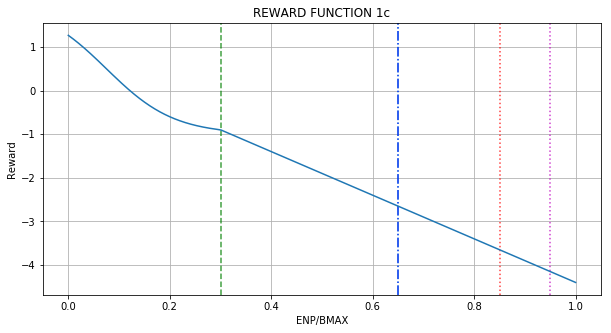

RF_1c(0)            =   1.26
RF_1c(ENP_MARGIN/4) =   0.50
RF_1c(ENP_MARGIN/2) =  -0.26
RF_1c(ENP_MARGIN)   =  -0.90

RF_1c(BMAX/2) =  -1.90
RF_1c(BMAX)   =  -4.40



In [16]:
#PLOT REWARD FUNCTIONS
x = np.arange(0,capm.BMAX)
y = [capm.rewardfn() for capm.enp in x]

fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
ax.set_title('REWARD FUNCTION 1c')
ax.set_xlabel('ENP/BMAX')
ax.set_ylabel('Reward')
ax.axvline((capm.ENP_MARGIN)/capm.BMAX, color='g',alpha=0.75, linestyle='--')
ax.axvline(1-(capm.BSAFE_LO)/capm.BMAX, color='c',alpha=0.75, linestyle='-.')
ax.axvline(  (capm.BSAFE_HI)/capm.BMAX, color='b',alpha=0.75, linestyle="-.")
ax.axvline(1- (capm.BLIM_LO)/capm.BMAX, color='r',alpha=0.75, linestyle=':')
ax.axvline(   (capm.BLIM_HI)/capm.BMAX, color='m',alpha=0.75, linestyle=":")
ax.plot(x/capm.BMAX,y)
ax.grid(True)
plt.show()

capm.enp = 0;            print("RF_1c(0)            = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.ENP_MARGIN/4; print("RF_1c(ENP_MARGIN/4) = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.ENP_MARGIN/2; print("RF_1c(ENP_MARGIN/2) = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.ENP_MARGIN;   print("RF_1c(ENP_MARGIN)   = {:6.2f}".format(capm.rewardfn()) )
print("");
capm.enp = capm.BMAX/2; print("RF_1c(BMAX/2) = {:6.2f}".format(capm.rewardfn()) )
capm.enp = capm.BMAX;   print("RF_1c(BMAX)   = {:6.2f}".format(capm.rewardfn()) )
print("");

In [17]:
#TRAINING STARTS
tic = datetime.now()

Device:  cpu

Iteration 0:  TOKYO, 2002 
EPSILON = 5.000e-01
LR = 3.392e-05
Average Terminal Reward  = -6.216
Day Violations           =    319
Battery Limit Violations =   2597
Action MEAN              =  4.129
Action STD DEV           =  2.565


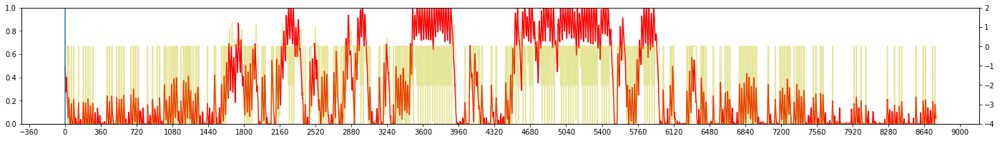

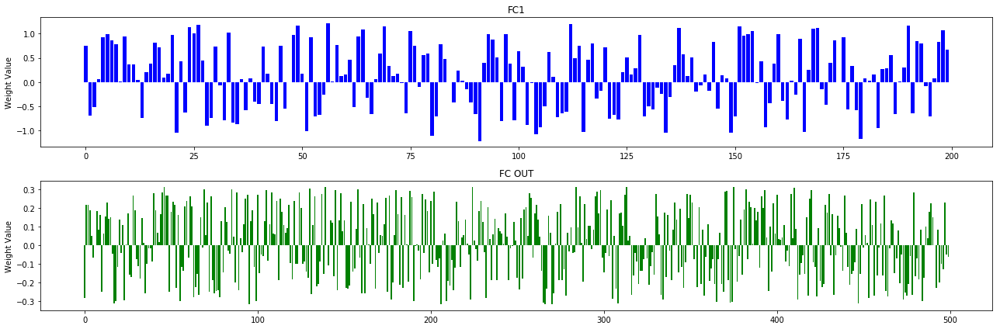

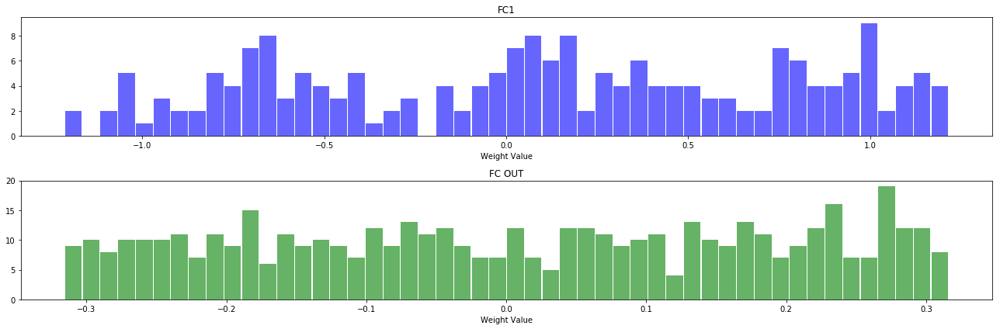


Iteration 1:  TOKYO, 2004 
EPSILON = 5.000e-01
LR = 4.174e-05
Average Terminal Reward  = -5.954
Day Violations           =    312
Battery Limit Violations =   2660
Action MEAN              =  4.403
Action STD DEV           =  2.552


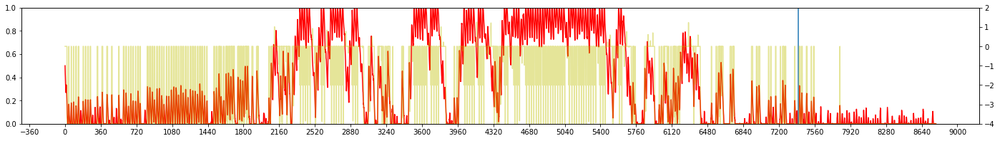

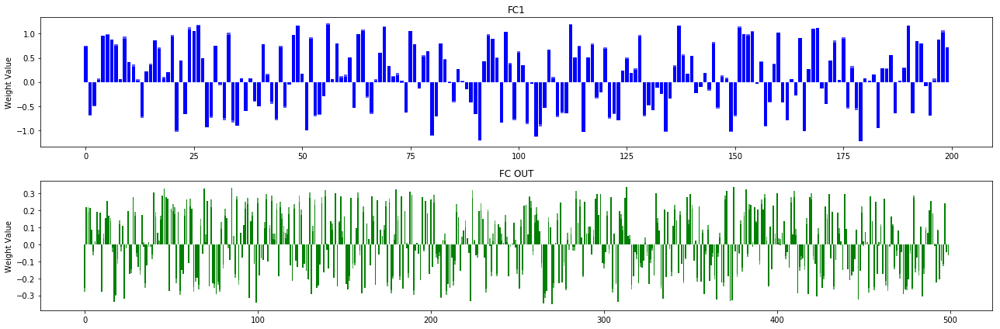

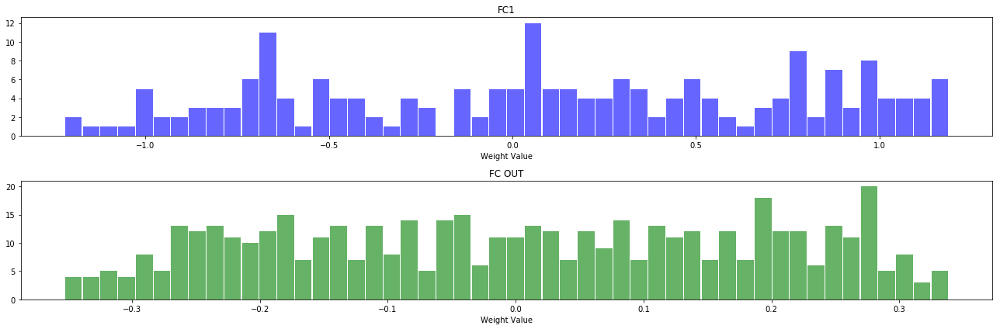


Iteration 2:  TOKYO, 2008 
EPSILON = 5.000e-01
LR = 5.000e-05
Average Terminal Reward  = -7.977
Day Violations           =    355
Battery Limit Violations =   4288
Action MEAN              =  5.825
Action STD DEV           =  2.845


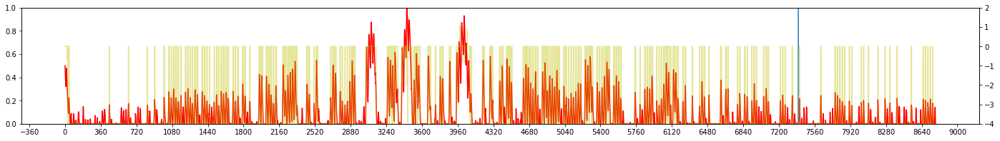

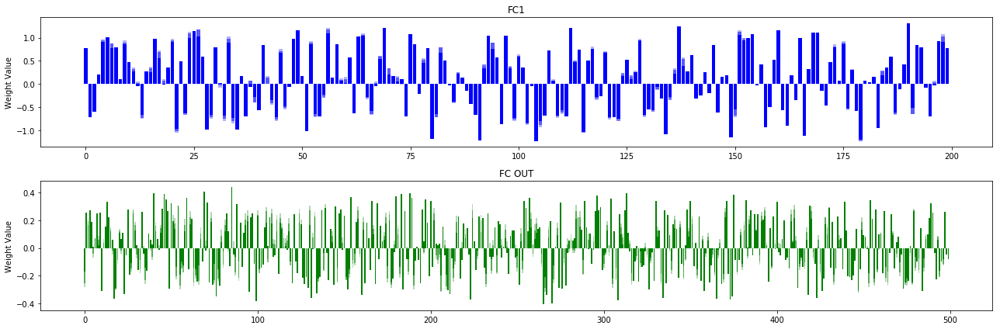

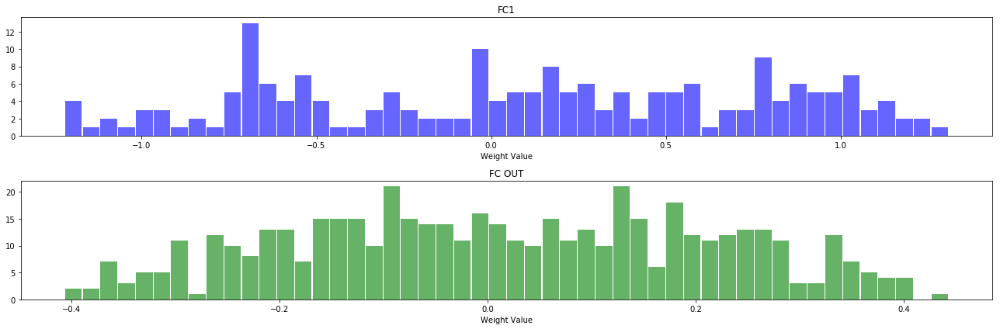


Iteration 3:  TOKYO, 2000 
EPSILON = 5.000e-01
LR = 5.826e-05
Average Terminal Reward  = -7.047
Day Violations           =    333
Battery Limit Violations =   3804
Action MEAN              =  5.861
Action STD DEV           =  2.959


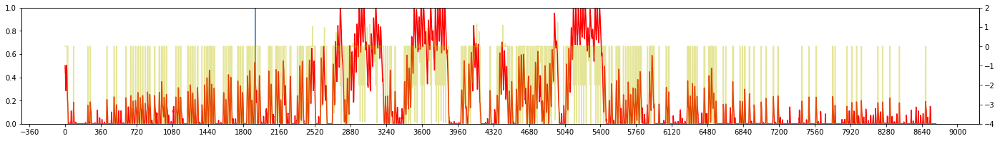

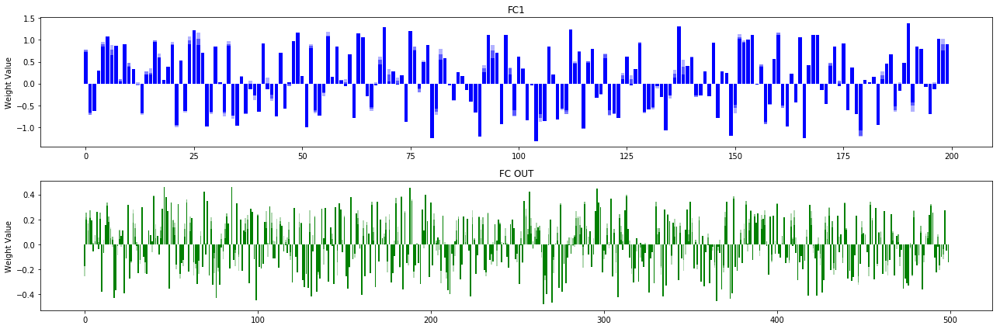

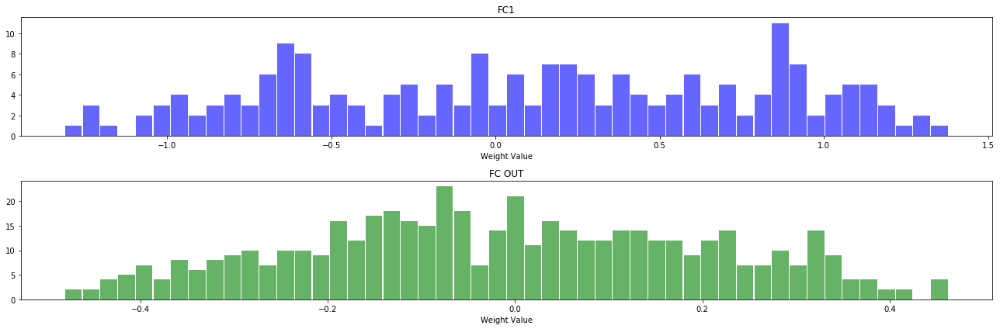


Iteration 4:  TOKYO, 2006 
EPSILON = 5.001e-01
LR = 6.608e-05
Average Terminal Reward  = -6.712
Day Violations           =    318
Battery Limit Violations =   3122
Action MEAN              =  4.961
Action STD DEV           =  3.166


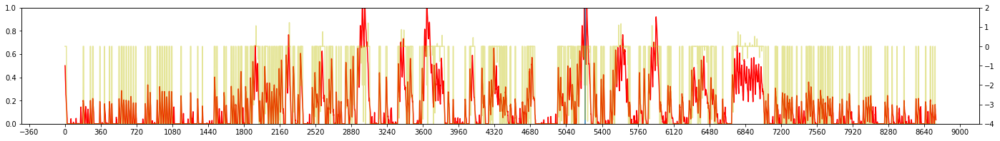

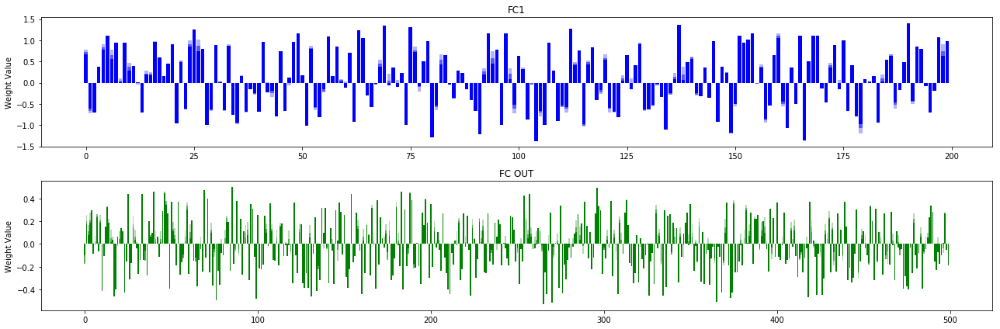

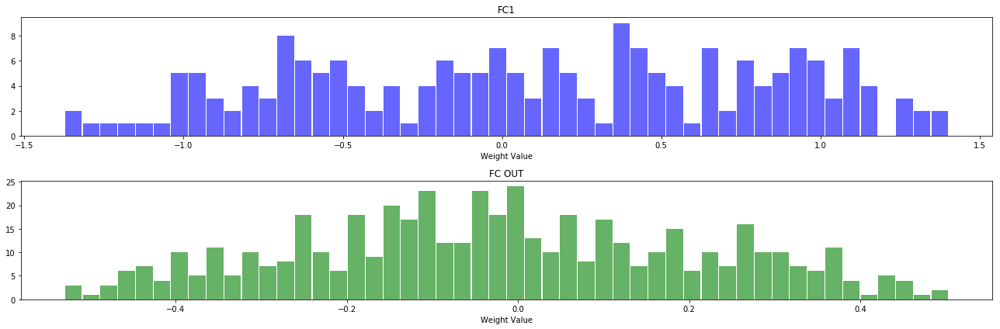


Iteration 5:  TOKYO, 2000 
EPSILON = 5.001e-01
LR = 7.311e-05
Average Terminal Reward  = -4.593
Day Violations           =    248
Battery Limit Violations =   2046
Action MEAN              =  4.127
Action STD DEV           =  2.996


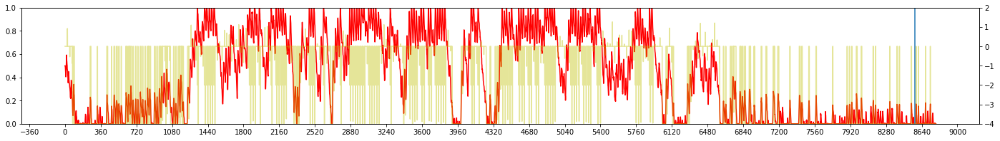

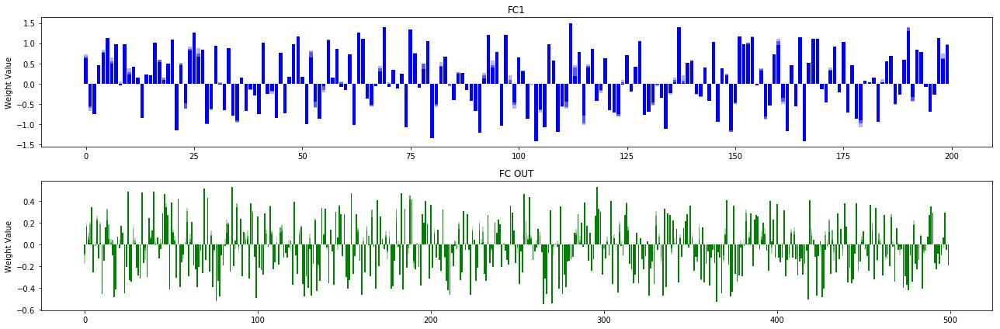

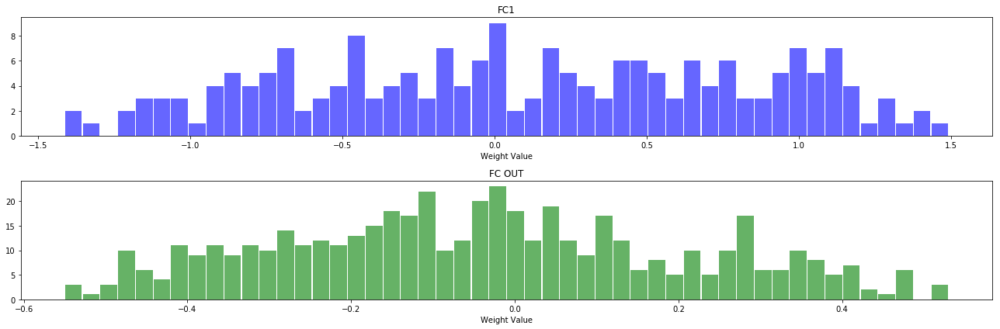


Iteration 6:  TOKYO, 2007 
EPSILON = 5.001e-01
LR = 7.914e-05
Average Terminal Reward  = -4.691
Day Violations           =    253
Battery Limit Violations =   2058
Action MEAN              =  4.305
Action STD DEV           =  2.934


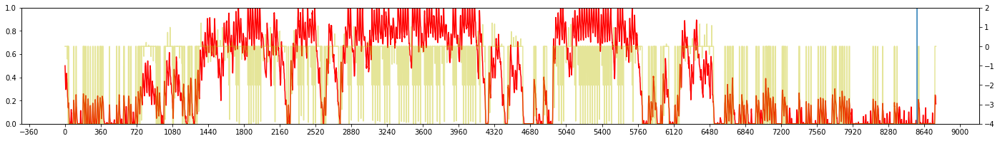

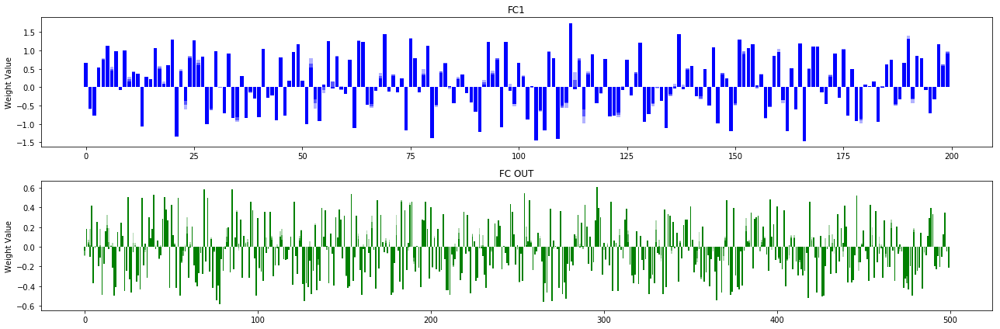

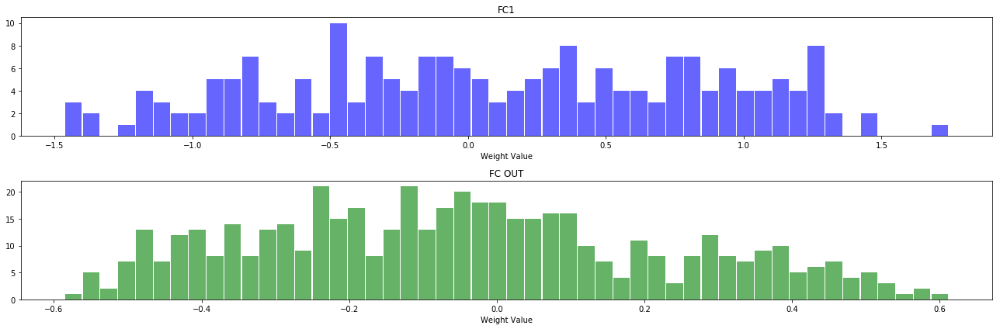


Iteration 7:  TOKYO, 2007 
EPSILON = 5.001e-01
LR = 8.411e-05
Average Terminal Reward  = -4.667
Day Violations           =    248
Battery Limit Violations =   2179
Action MEAN              =  4.437
Action STD DEV           =  2.901


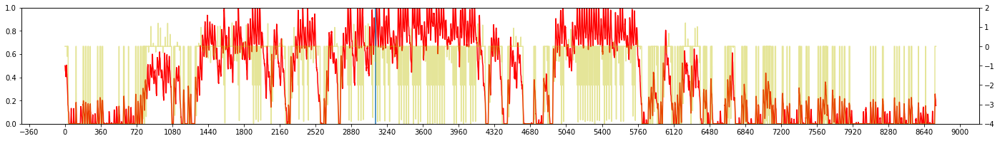

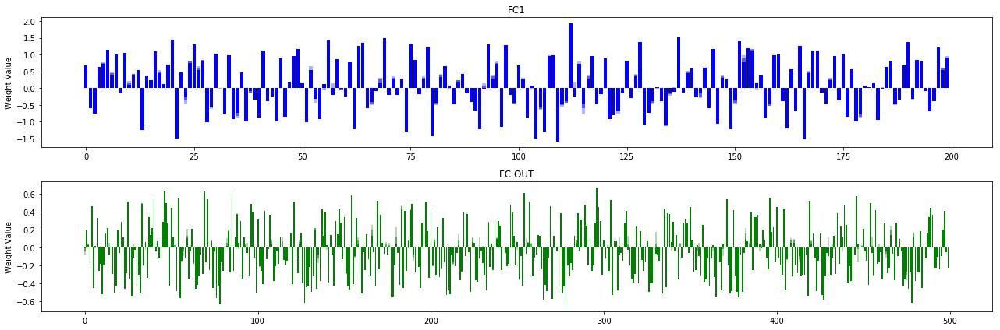

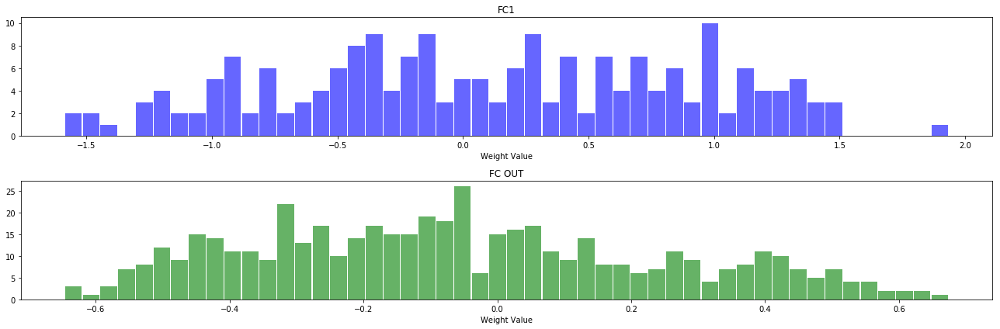


Iteration 8:  TOKYO, 2006 
EPSILON = 5.001e-01
LR = 8.808e-05
Average Terminal Reward  = -5.002
Day Violations           =    245
Battery Limit Violations =   2439
Action MEAN              =  4.340
Action STD DEV           =  2.870


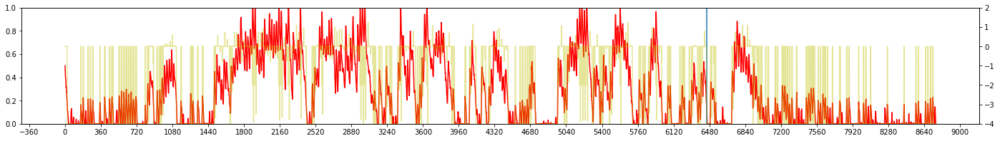

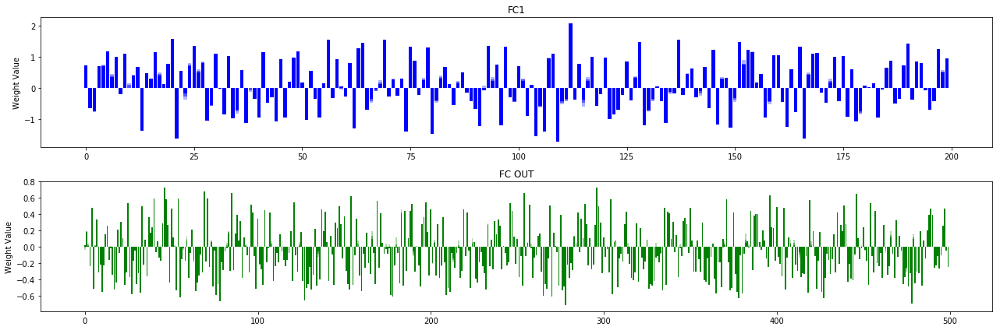

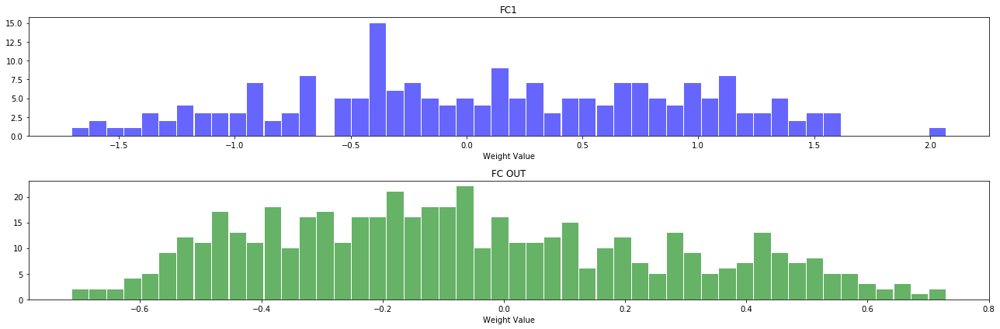


Iteration 9:  TOKYO, 2009 
EPSILON = 5.001e-01
LR = 9.116e-05
Average Terminal Reward  = -4.007
Day Violations           =    215
Battery Limit Violations =   1788
Action MEAN              =  4.297
Action STD DEV           =  2.946


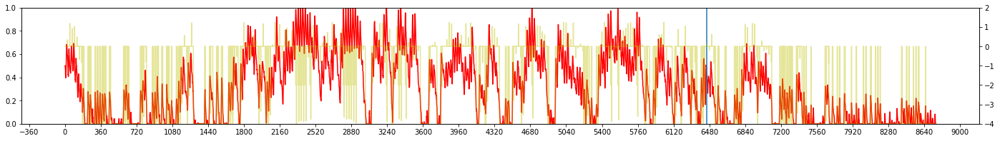

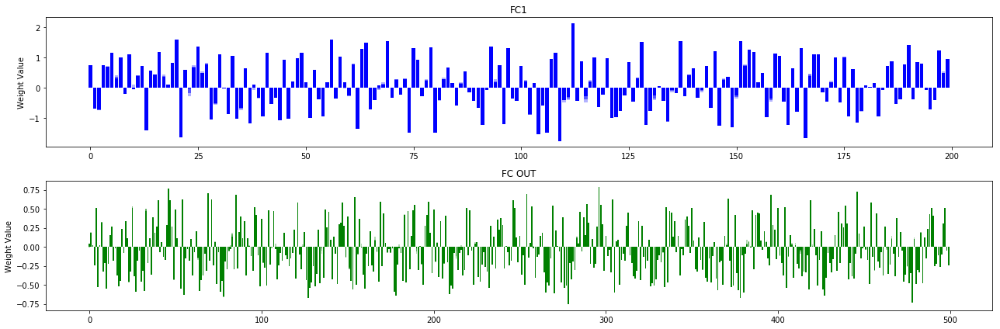

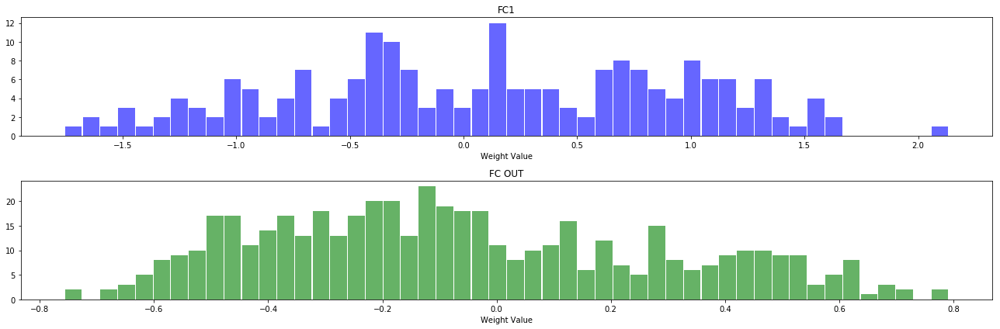


Iteration 10:  TOKYO, 2008 
EPSILON = 5.002e-01
LR = 9.350e-05
Average Terminal Reward  = -4.138
Day Violations           =    211
Battery Limit Violations =   1923
Action MEAN              =  4.354
Action STD DEV           =  2.829


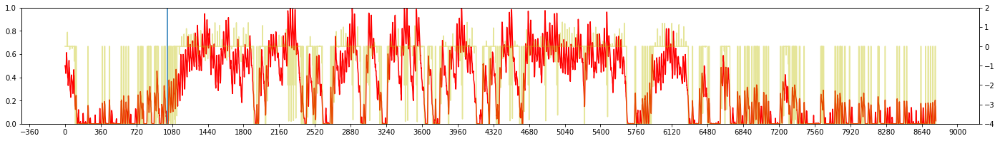

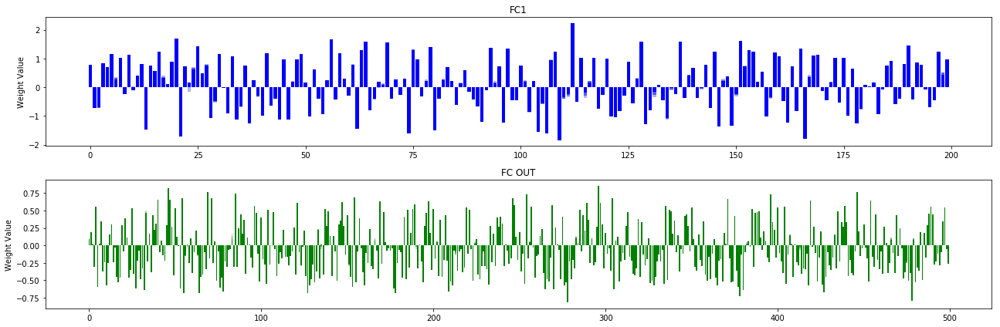

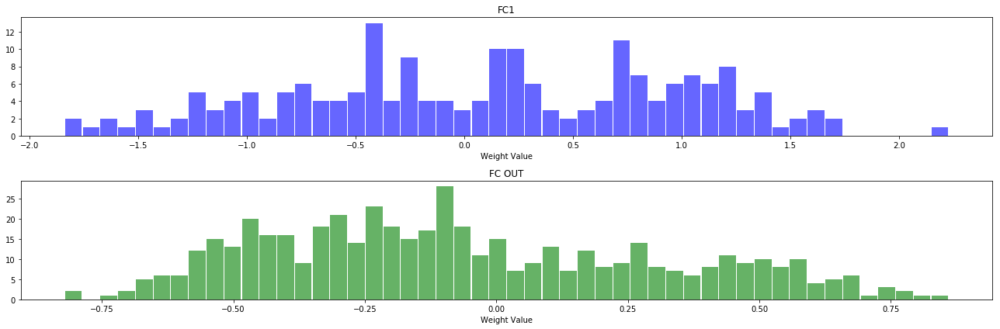


Iteration 11:  TOKYO, 2004 
EPSILON = 5.002e-01
LR = 9.526e-05
Average Terminal Reward  = -4.079
Day Violations           =    208
Battery Limit Violations =   1958
Action MEAN              =  4.647
Action STD DEV           =  2.934


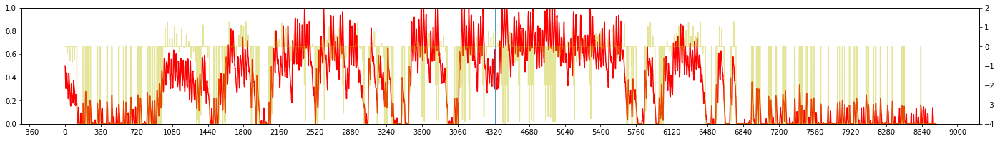

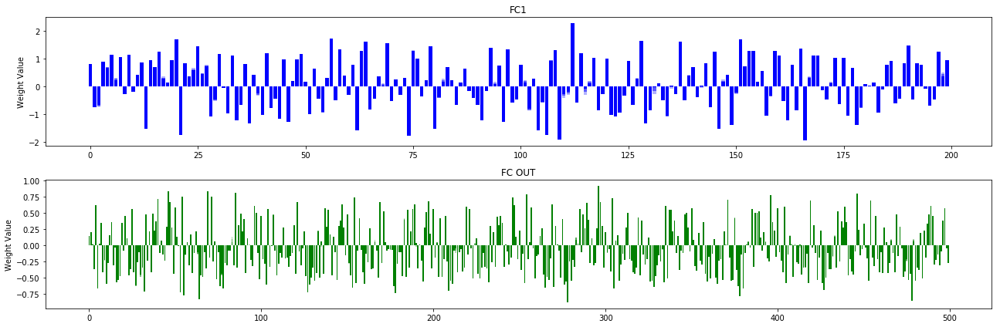

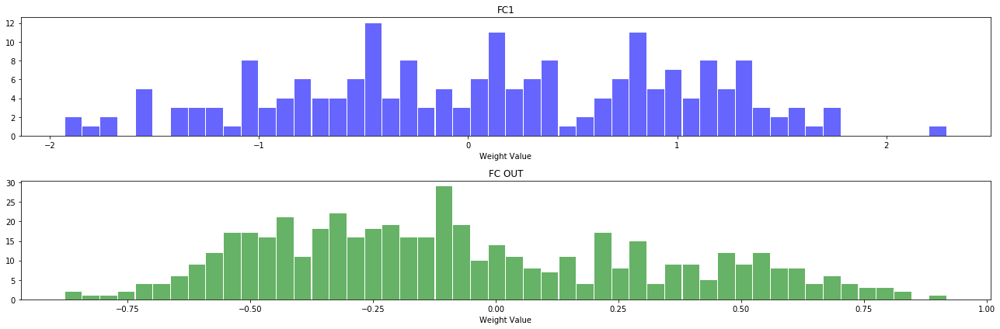


Iteration 12:  TOKYO, 2009 
EPSILON = 5.003e-01
LR = 9.656e-05
Average Terminal Reward  = -4.435
Day Violations           =    227
Battery Limit Violations =   1995
Action MEAN              =  4.447
Action STD DEV           =  2.980


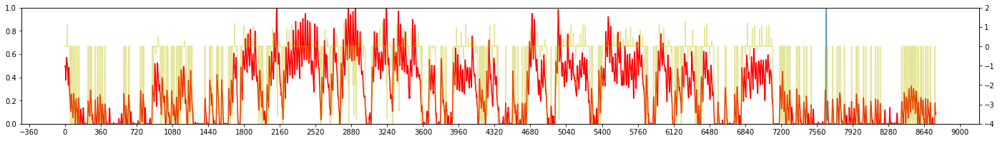

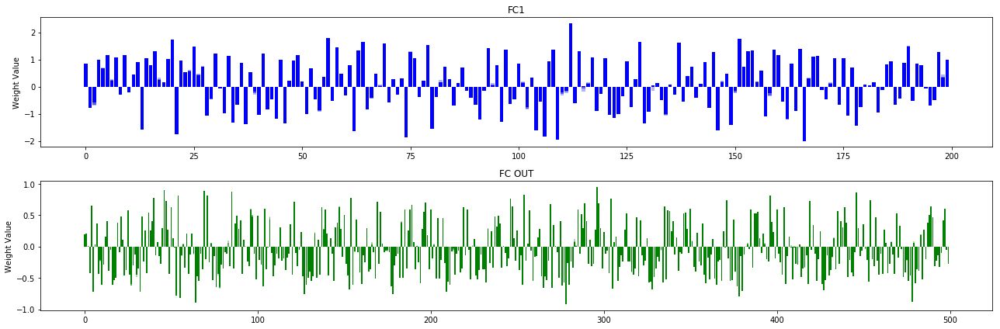

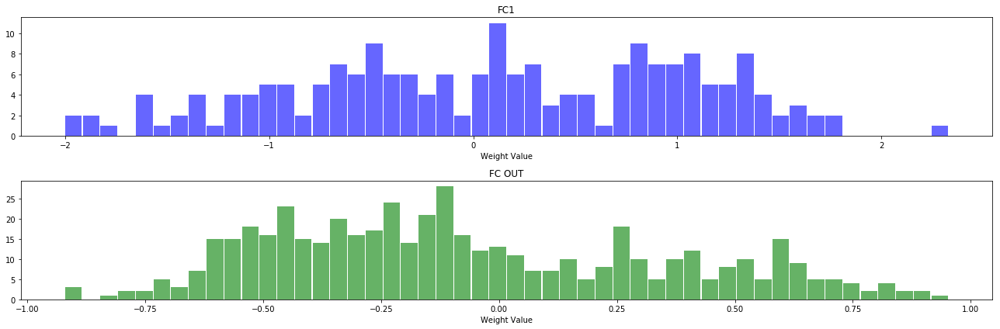


Iteration 13:  TOKYO, 2000 
EPSILON = 5.003e-01
LR = 9.751e-05
Average Terminal Reward  = -4.164
Day Violations           =    209
Battery Limit Violations =   2027
Action MEAN              =  4.509
Action STD DEV           =  3.017


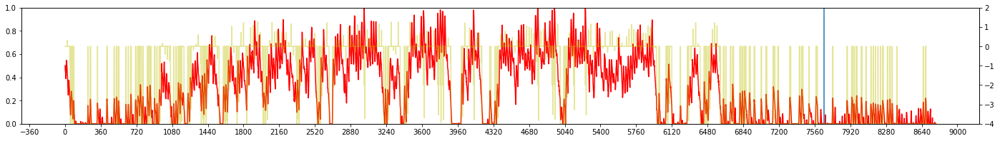

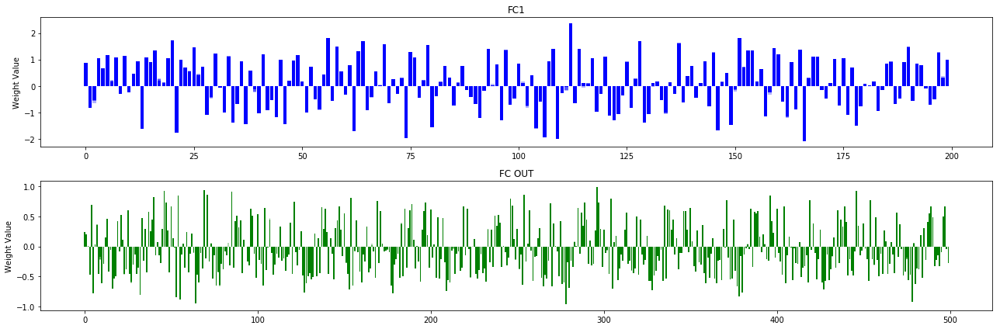

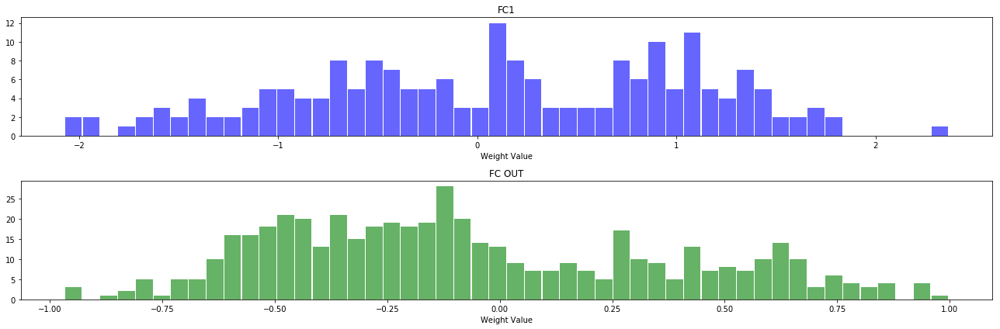


Iteration 14:  TOKYO, 2005 
EPSILON = 5.004e-01
LR = 9.820e-05
Average Terminal Reward  = -4.290
Day Violations           =    217
Battery Limit Violations =   1986
Action MEAN              =  4.537
Action STD DEV           =  2.938


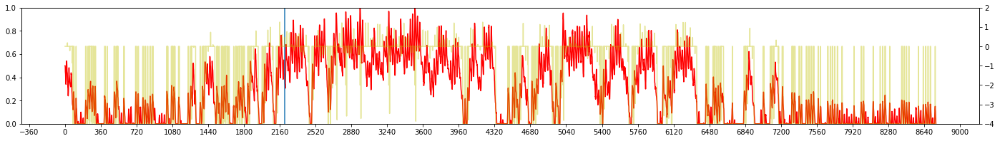

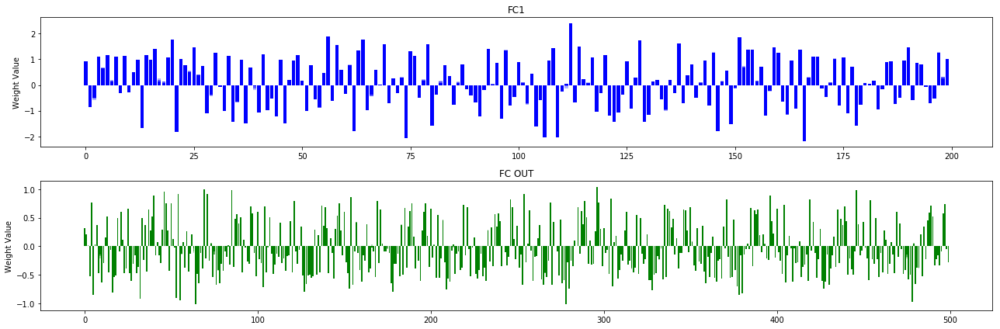

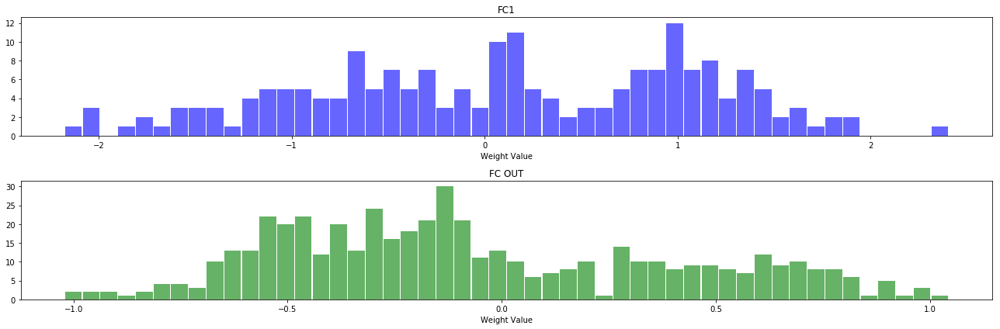


Iteration 15:  TOKYO, 2003 
EPSILON = 5.005e-01
LR = 9.870e-05
Average Terminal Reward  = -4.675
Day Violations           =    224
Battery Limit Violations =   2445
Action MEAN              =  4.569
Action STD DEV           =  2.870


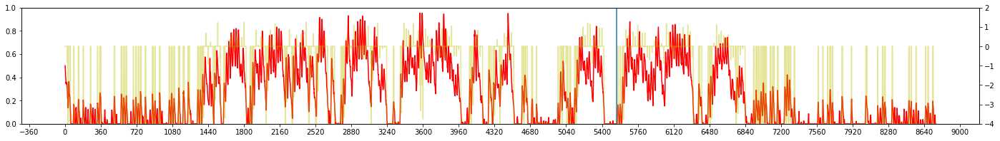

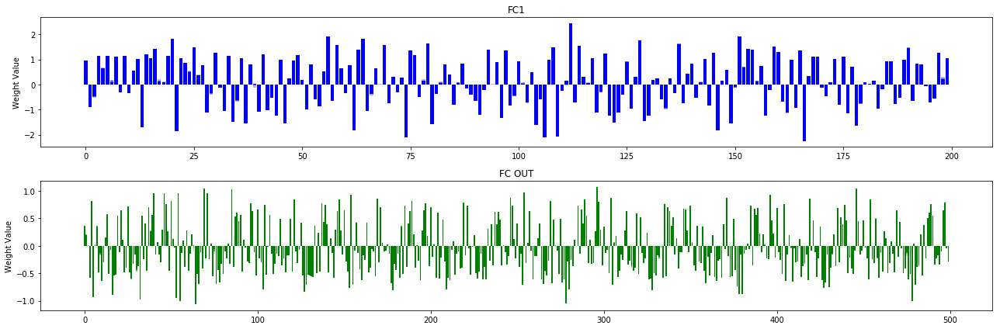

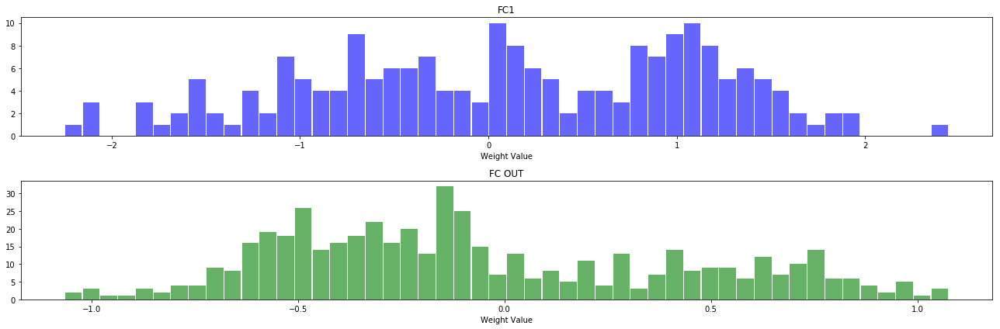


Iteration 16:  TOKYO, 2000 
EPSILON = 5.006e-01
LR = 9.907e-05
Average Terminal Reward  = -4.456
Day Violations           =    219
Battery Limit Violations =   2377
Action MEAN              =  4.752
Action STD DEV           =  2.849


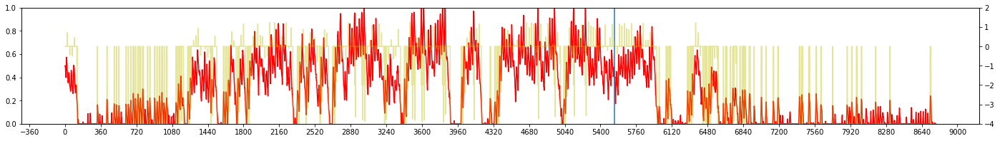

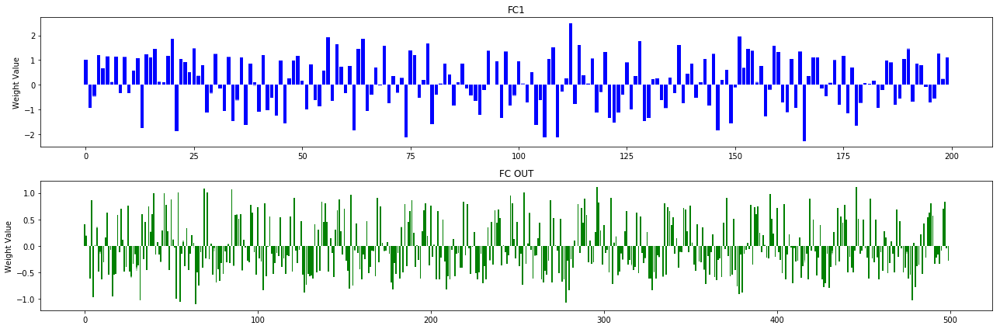

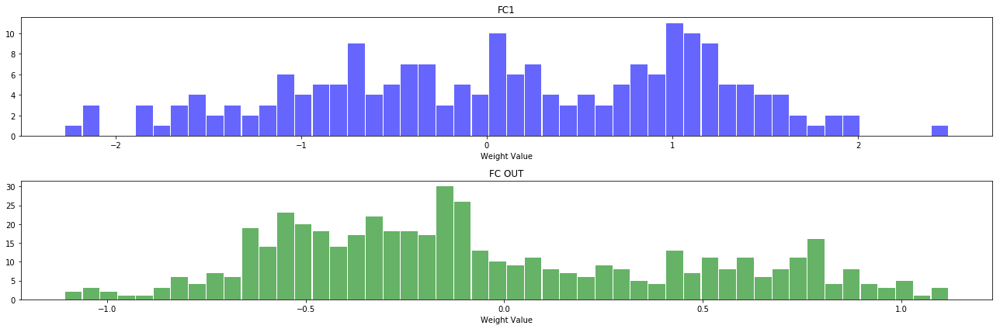


Iteration 17:  TOKYO, 2005 
EPSILON = 5.007e-01
LR = 9.933e-05
Average Terminal Reward  = -4.582
Day Violations           =    229
Battery Limit Violations =   2144
Action MEAN              =  4.673
Action STD DEV           =  2.828


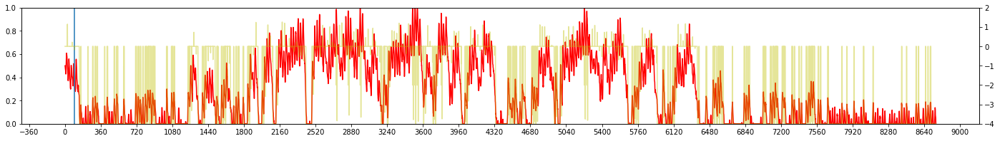

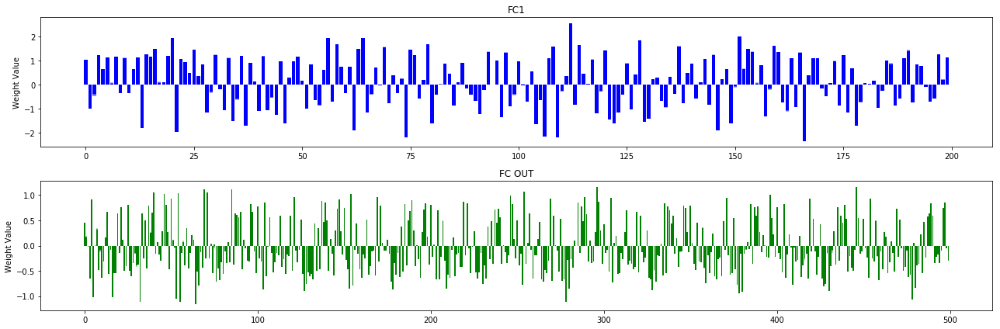

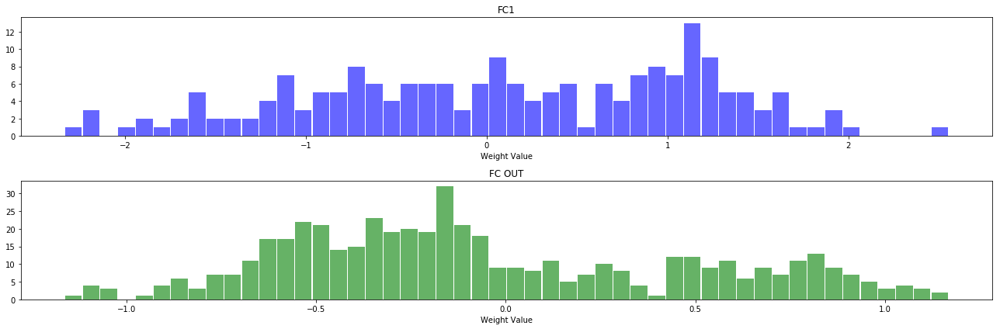


Iteration 18:  TOKYO, 2004 
EPSILON = 5.008e-01
LR = 9.952e-05
Average Terminal Reward  = -4.176
Day Violations           =    213
Battery Limit Violations =   2006
Action MEAN              =  4.730
Action STD DEV           =  2.899


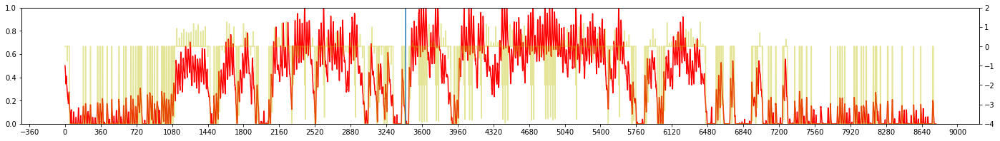

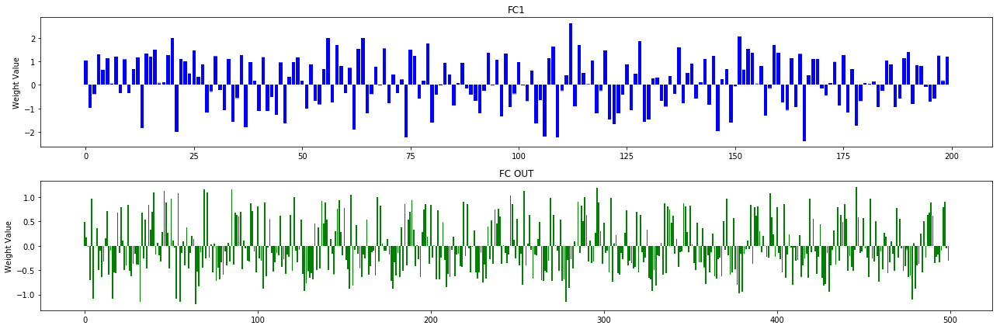

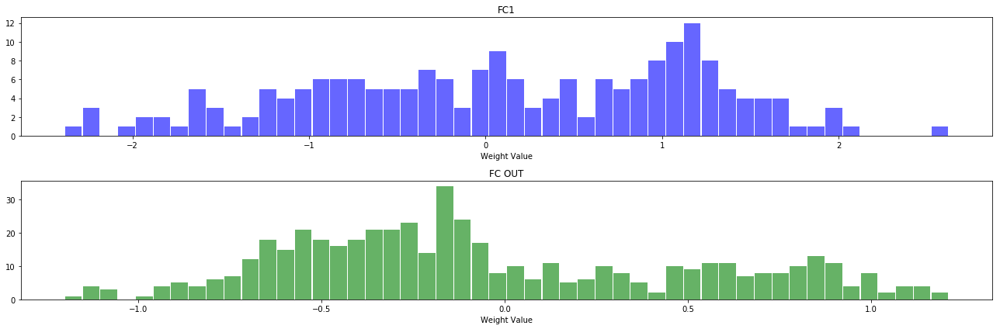


Iteration 19:  TOKYO, 2002 
EPSILON = 5.010e-01
LR = 9.966e-05
Average Terminal Reward  = -4.467
Day Violations           =    226
Battery Limit Violations =   2305
Action MEAN              =  4.716
Action STD DEV           =  2.920


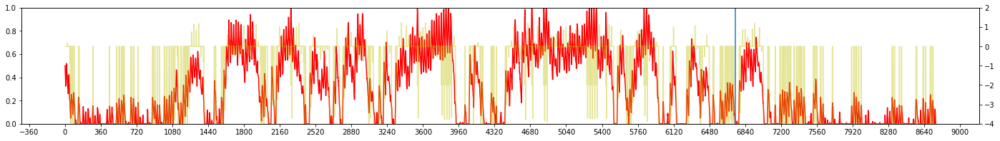

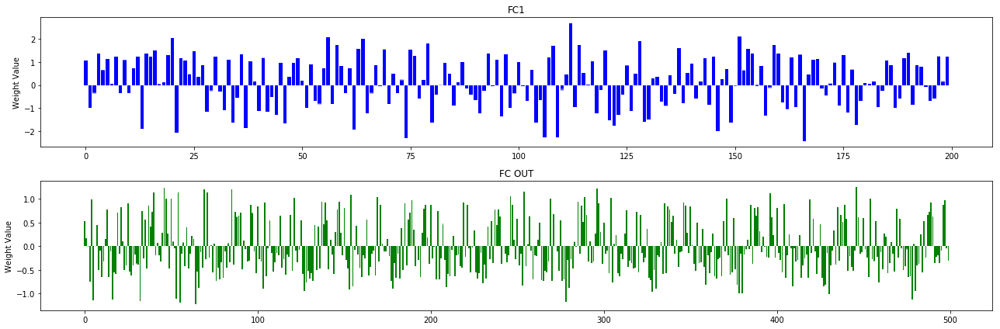

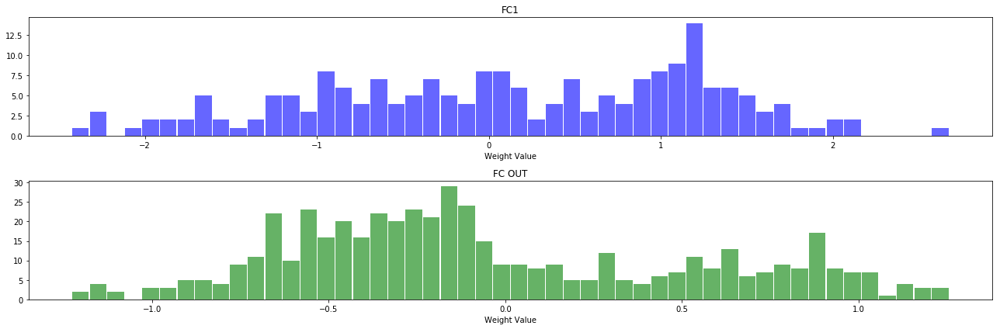


Iteration 20:  TOKYO, 2002 
EPSILON = 5.012e-01
LR = 9.975e-05
Average Terminal Reward  = -4.397
Day Violations           =    225
Battery Limit Violations =   2167
Action MEAN              =  4.607
Action STD DEV           =  2.953


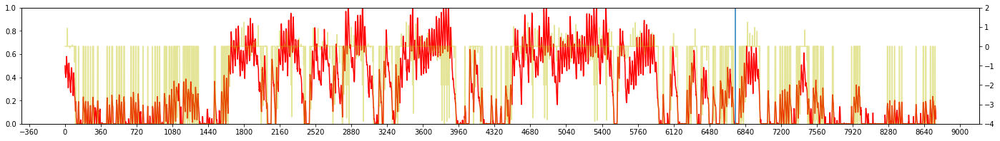

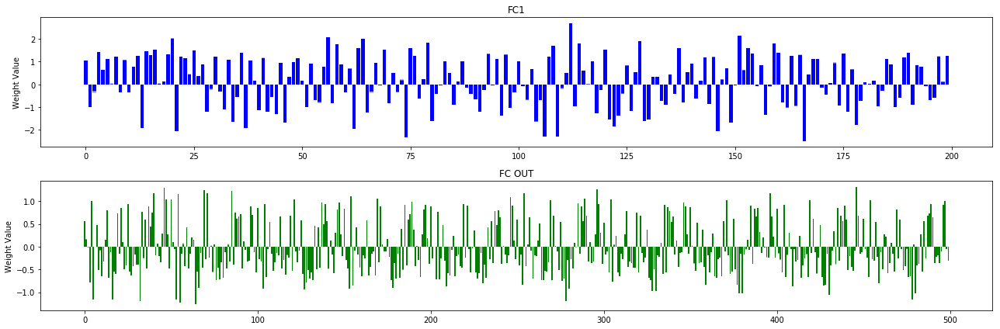

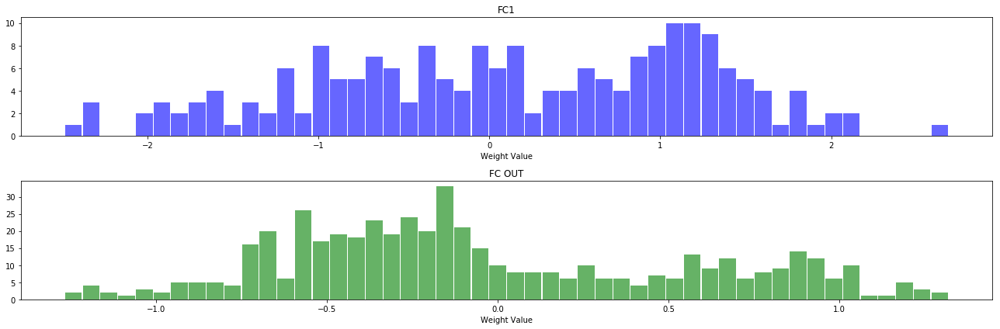


Iteration 21:  TOKYO, 2007 
EPSILON = 5.015e-01
LR = 9.982e-05
Average Terminal Reward  = -4.274
Day Violations           =    217
Battery Limit Violations =   2069
Action MEAN              =  4.640
Action STD DEV           =  2.975


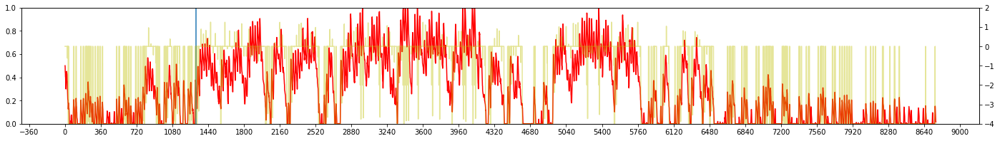

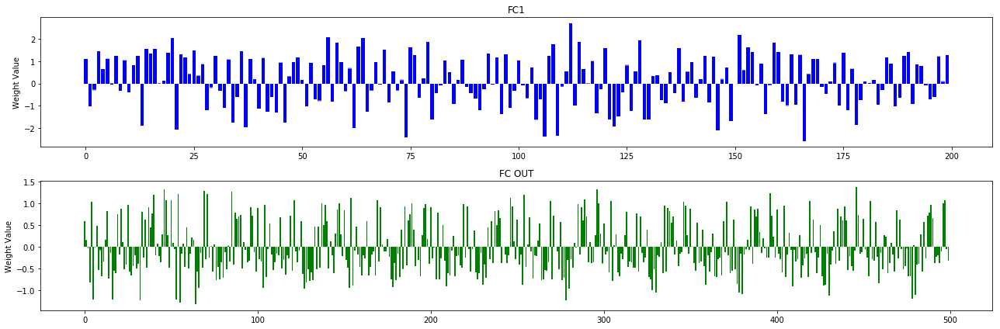

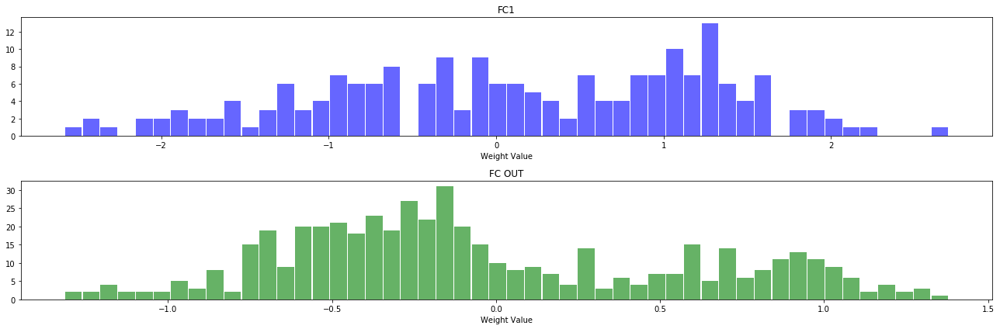


Iteration 22:  TOKYO, 2009 
EPSILON = 5.018e-01
LR = 9.987e-05
Average Terminal Reward  = -4.380
Day Violations           =    224
Battery Limit Violations =   2009
Action MEAN              =  4.477
Action STD DEV           =  2.967


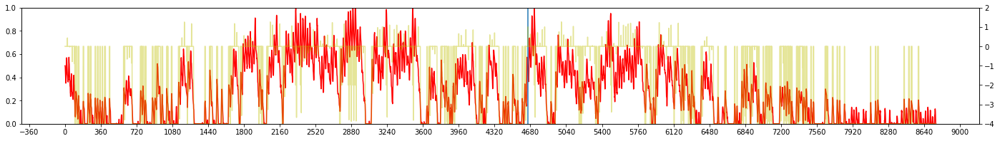

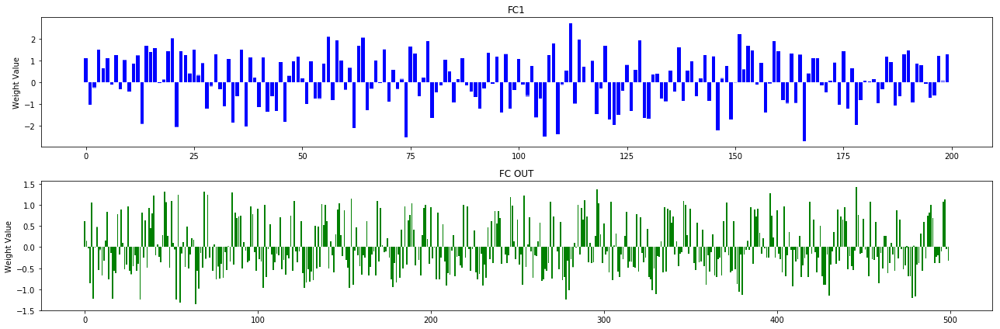

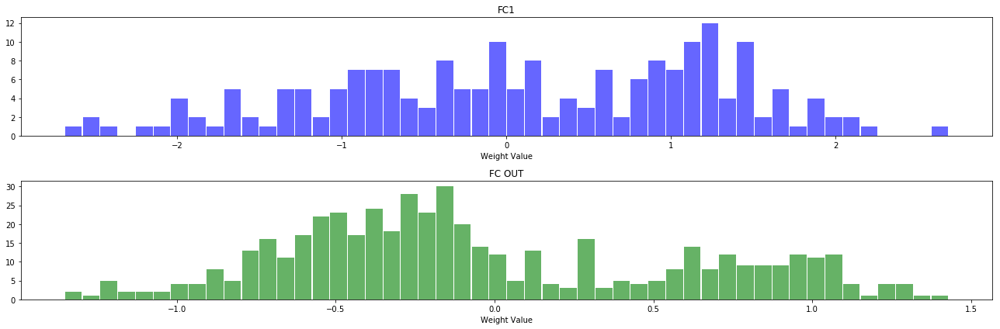


Iteration 23:  TOKYO, 2006 
EPSILON = 5.022e-01
LR = 9.991e-05
Average Terminal Reward  = -5.317
Day Violations           =    252
Battery Limit Violations =   2849
Action MEAN              =  4.719
Action STD DEV           =  2.819


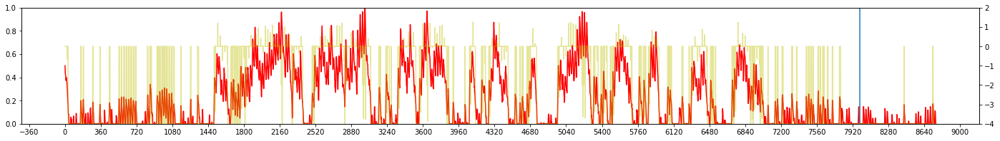

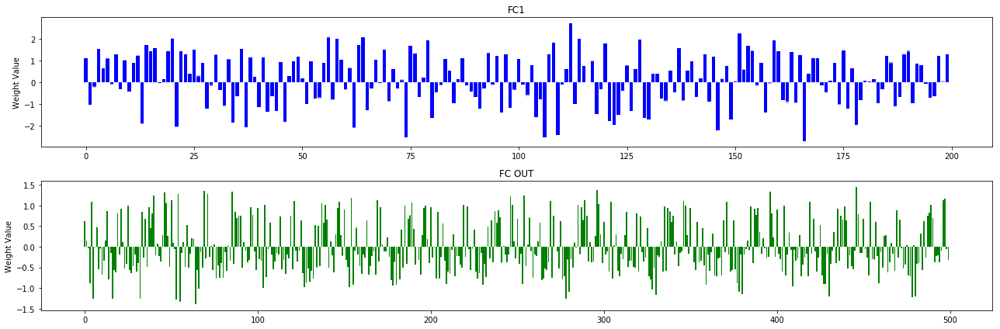

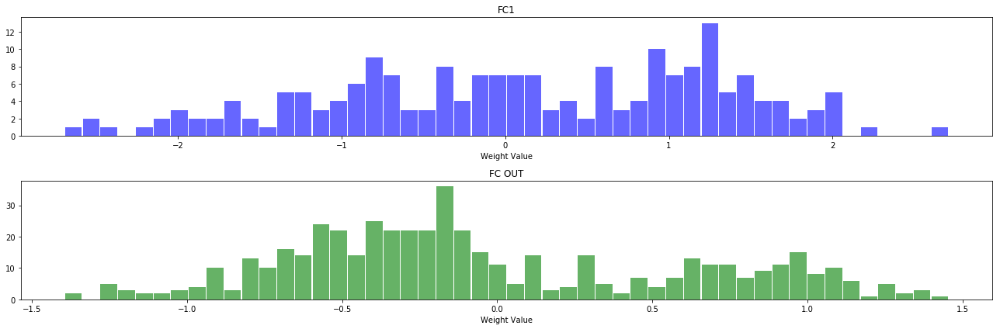


Iteration 24:  TOKYO, 2009 
EPSILON = 5.027e-01
LR = 9.993e-05
Average Terminal Reward  = -4.273
Day Violations           =    223
Battery Limit Violations =   1869
Action MEAN              =  4.388
Action STD DEV           =  2.972


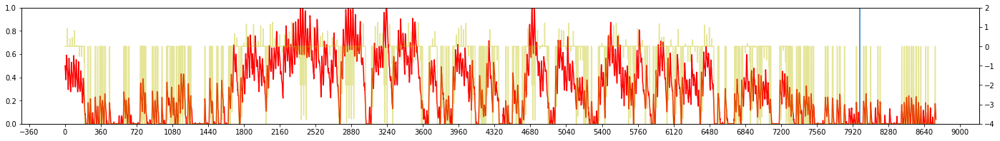

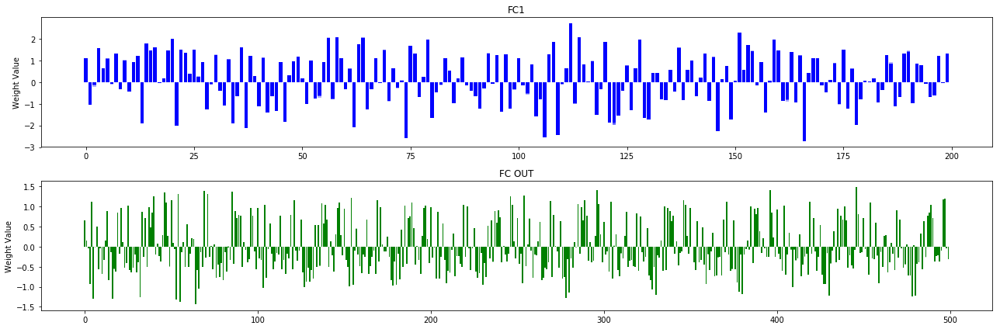

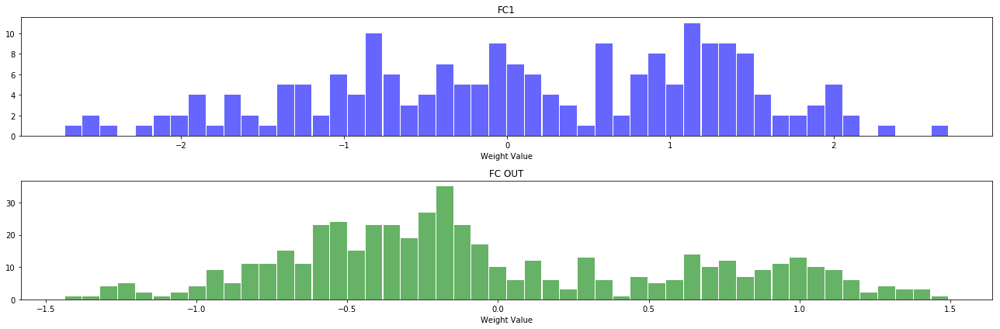


Iteration 25:  TOKYO, 2007 
EPSILON = 5.033e-01
LR = 9.995e-05
Average Terminal Reward  = -4.811
Day Violations           =    236
Battery Limit Violations =   2438
Action MEAN              =  4.823
Action STD DEV           =  2.825


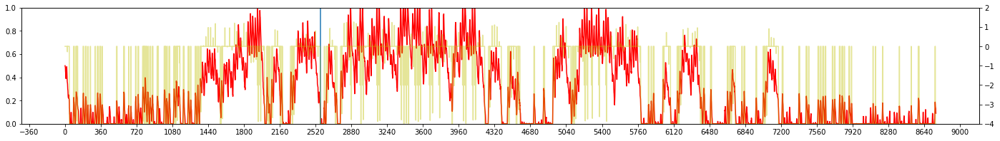

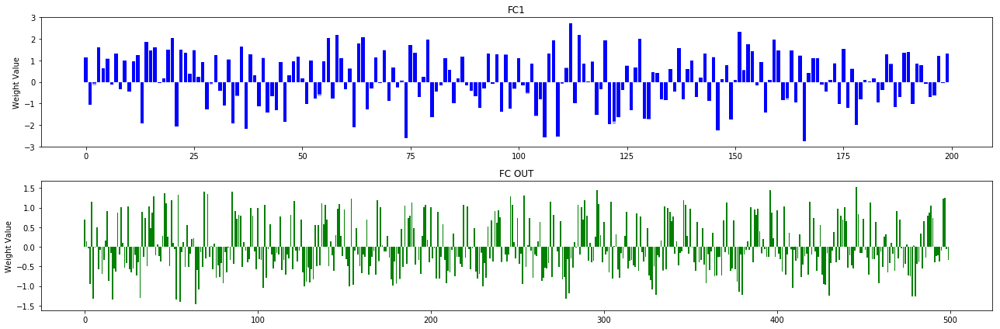

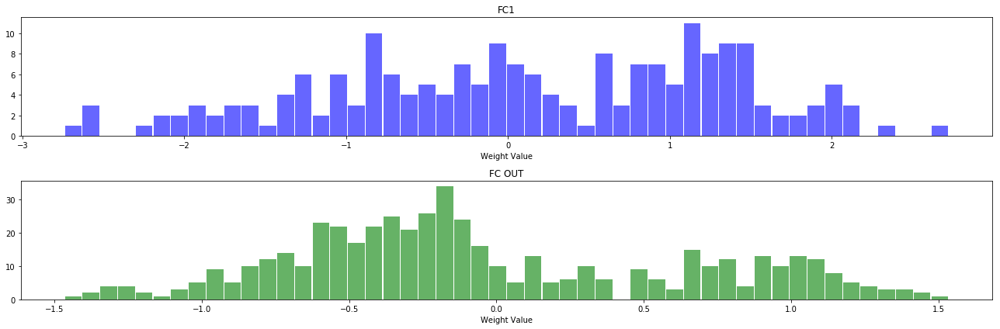


Iteration 26:  TOKYO, 2004 
EPSILON = 5.041e-01
LR = 9.997e-05
Average Terminal Reward  = -4.024
Day Violations           =    199
Battery Limit Violations =   1961
Action MEAN              =  4.725
Action STD DEV           =  2.918


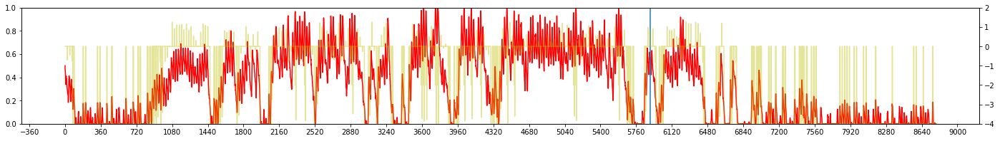

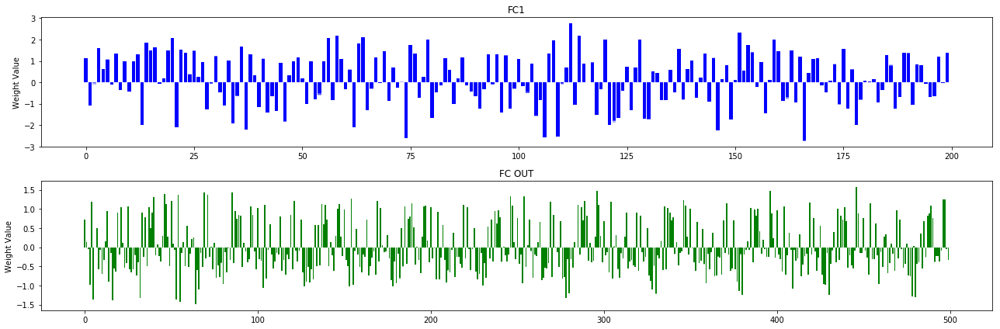

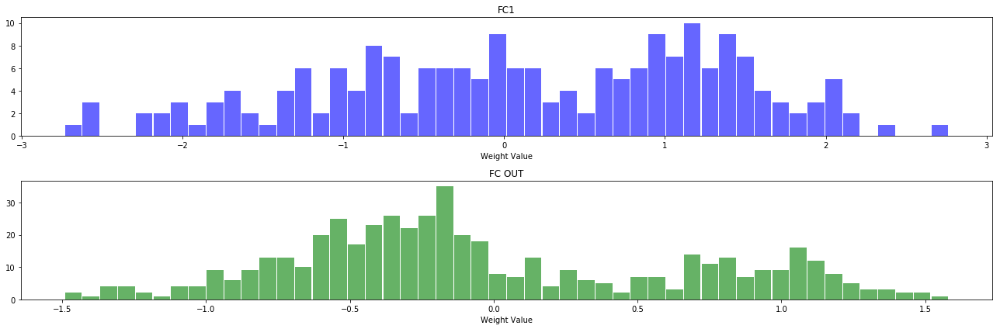


Iteration 27:  TOKYO, 2005 
EPSILON = 5.050e-01
LR = 9.998e-05
Average Terminal Reward  = -4.581
Day Violations           =    229
Battery Limit Violations =   2003
Action MEAN              =  4.582
Action STD DEV           =  3.058


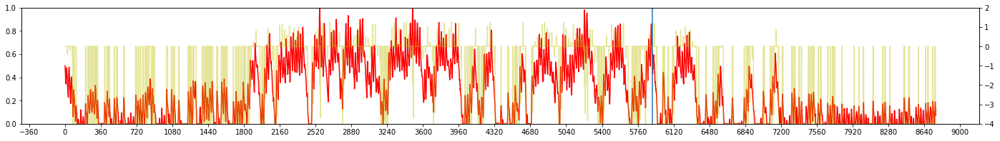

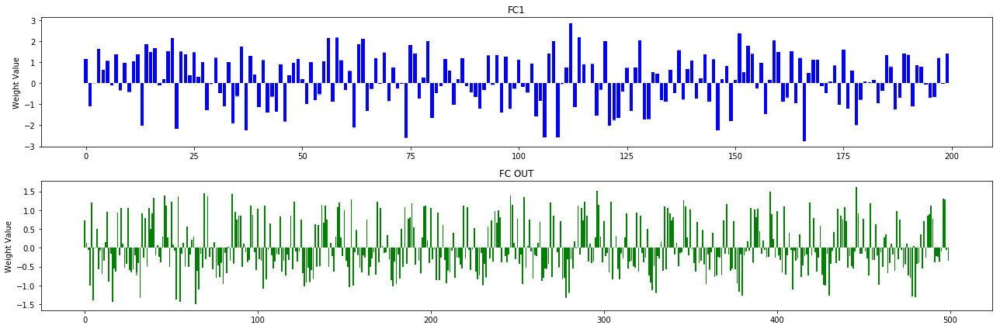

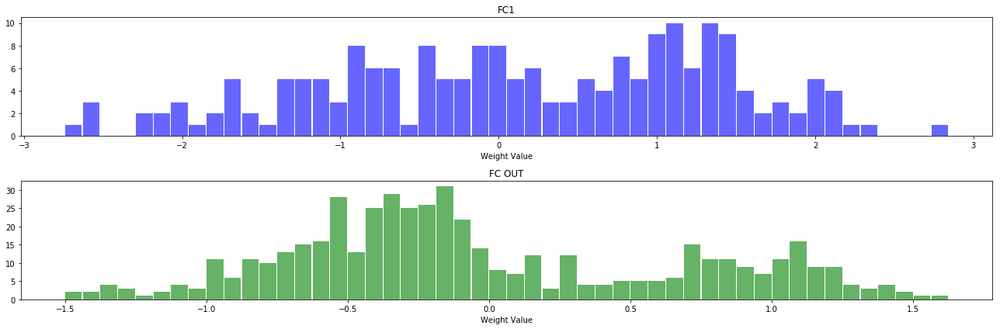


Iteration 28:  TOKYO, 2000 
EPSILON = 5.061e-01
LR = 9.998e-05
Average Terminal Reward  = -4.302
Day Violations           =    210
Battery Limit Violations =   2476
Action MEAN              =  4.803
Action STD DEV           =  2.980


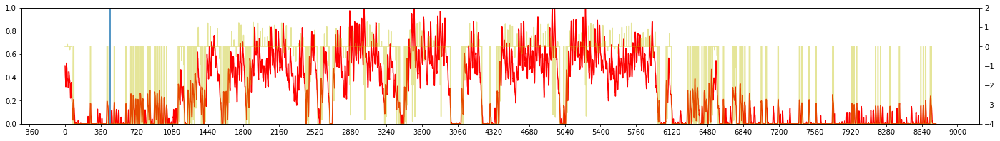

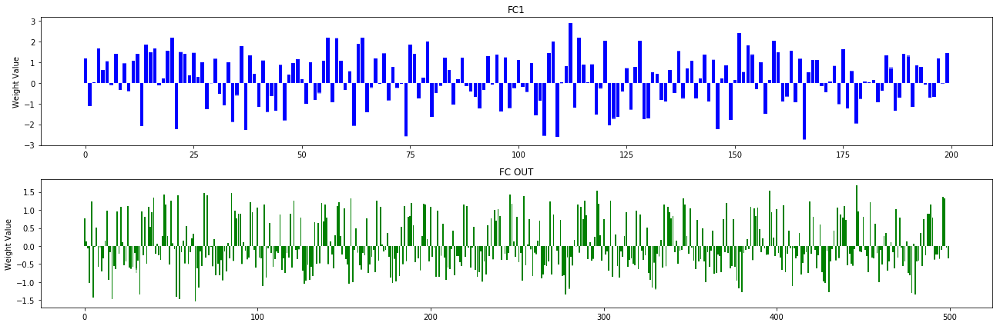

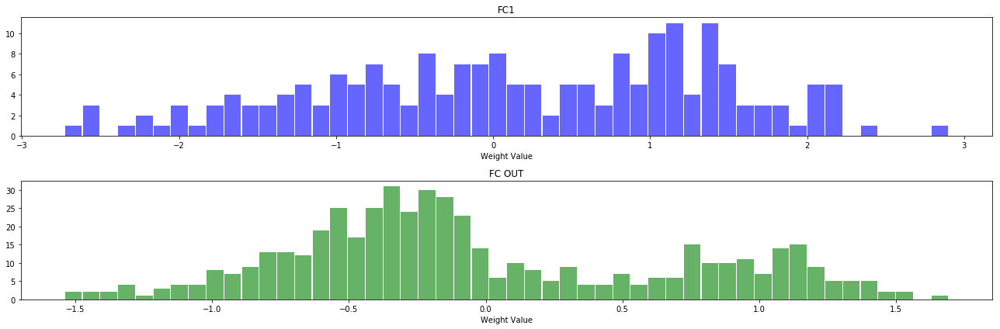


Iteration 29:  TOKYO, 2000 
EPSILON = 5.074e-01
LR = 9.999e-05
Average Terminal Reward  = -4.298
Day Violations           =    213
Battery Limit Violations =   2291
Action MEAN              =  4.648
Action STD DEV           =  2.878


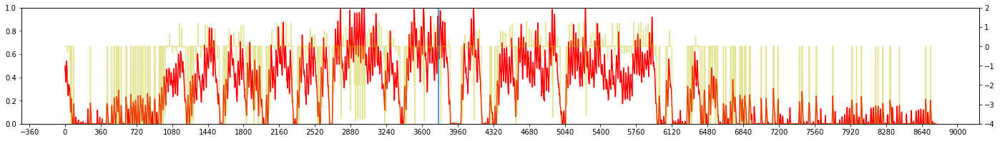

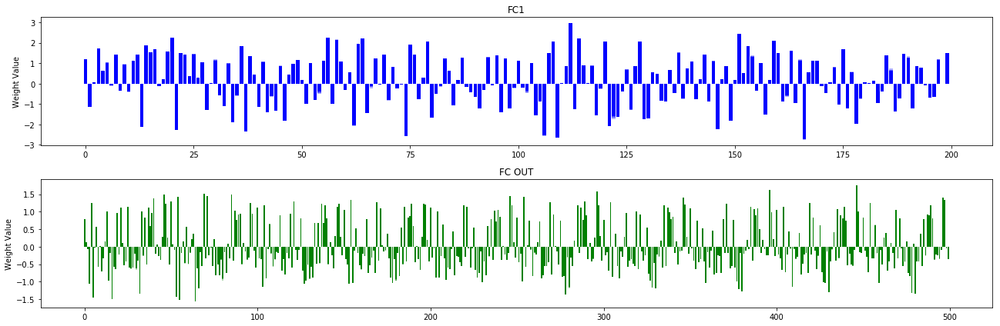

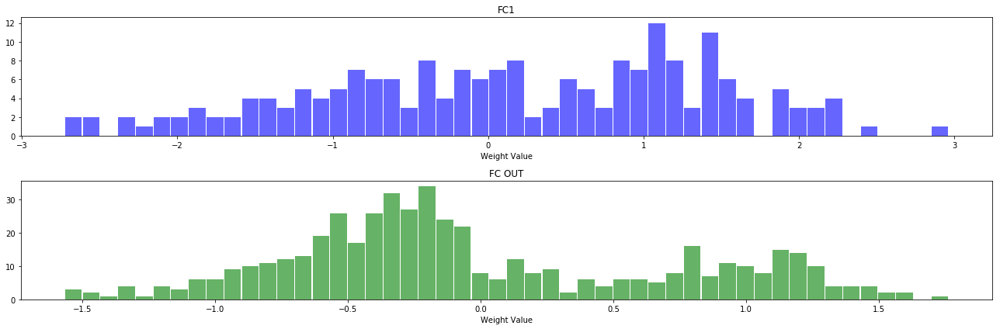


Iteration 30:  TOKYO, 2001 
EPSILON = 5.090e-01
LR = 9.999e-05
Average Terminal Reward  = -4.584
Day Violations           =    226
Battery Limit Violations =   2250
Action MEAN              =  4.679
Action STD DEV           =  2.910


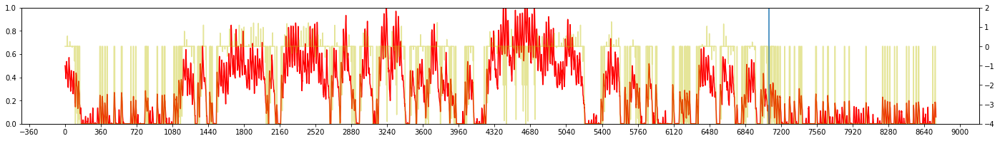

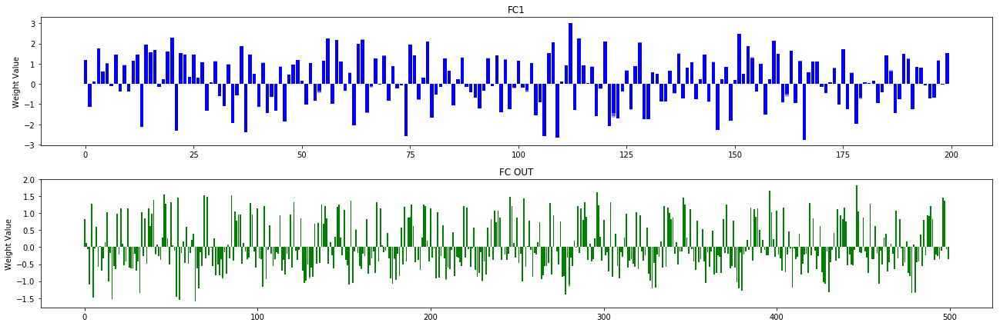

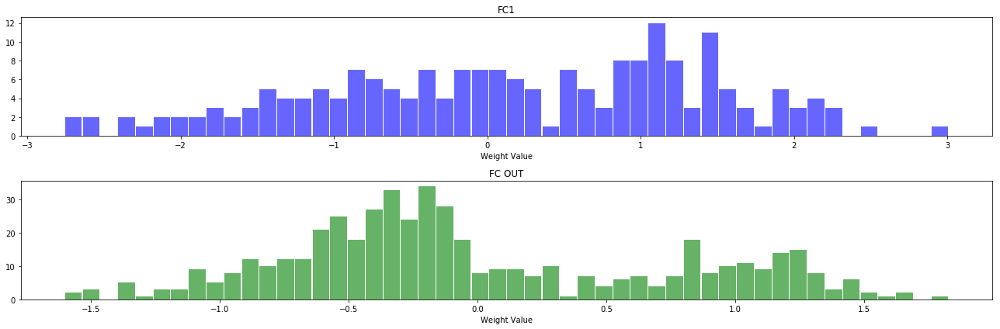


Iteration 31:  TOKYO, 2005 
EPSILON = 5.109e-01
LR = 9.999e-05
Average Terminal Reward  = -4.542
Day Violations           =    233
Battery Limit Violations =   1950
Action MEAN              =  4.536
Action STD DEV           =  2.963


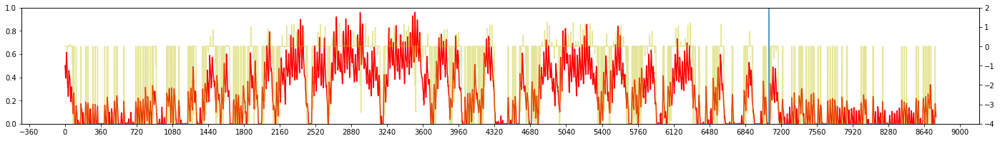

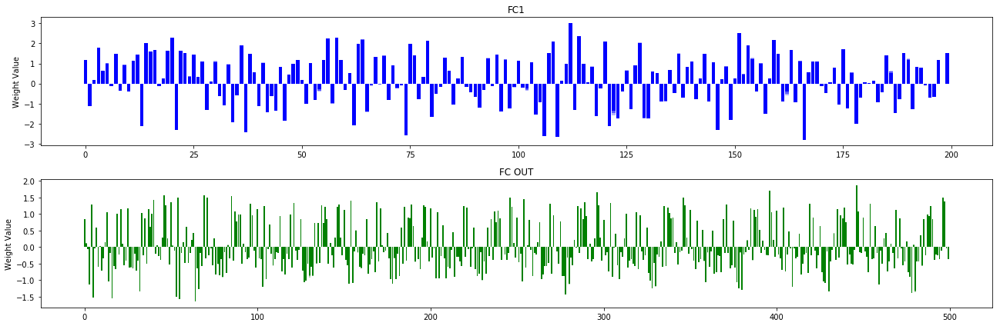

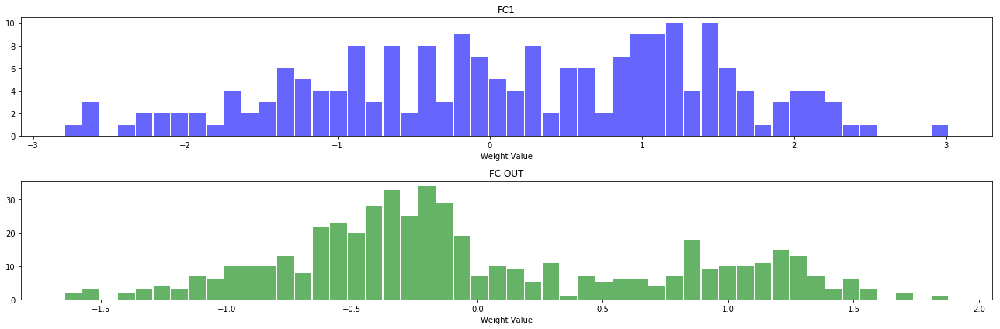


Iteration 32:  TOKYO, 2007 
EPSILON = 5.133e-01
LR = 1.000e-04
Average Terminal Reward  = -4.199
Day Violations           =    210
Battery Limit Violations =   2157
Action MEAN              =  4.730
Action STD DEV           =  2.986


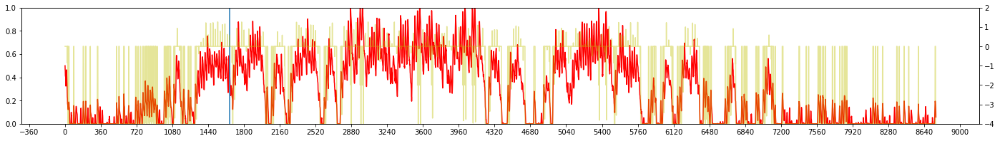

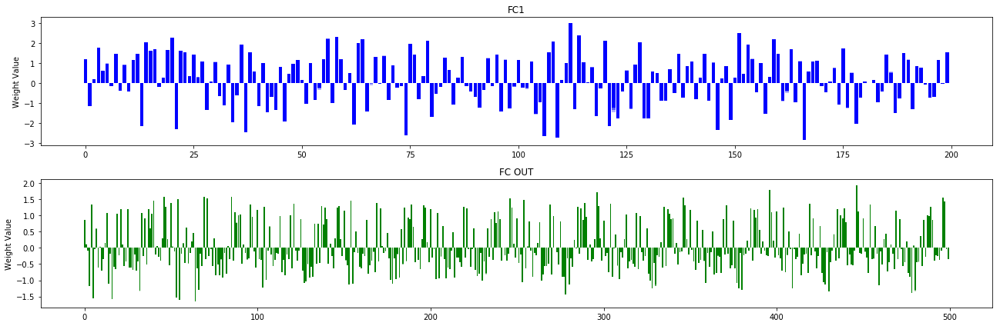

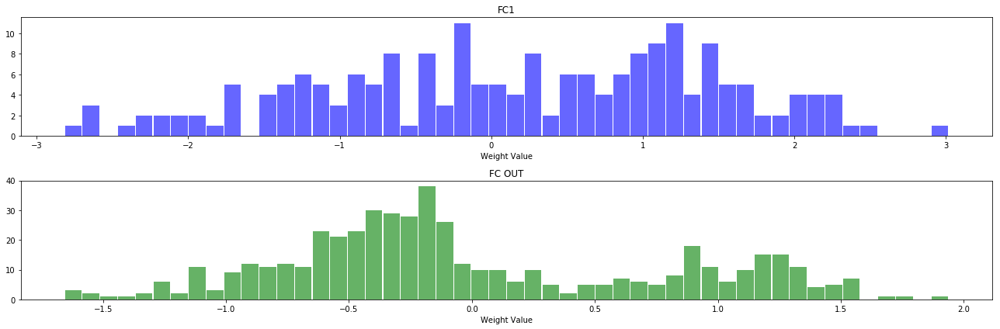


Iteration 33:  TOKYO, 2008 
EPSILON = 5.161e-01
LR = 1.000e-04
Average Terminal Reward  = -4.219
Day Violations           =    212
Battery Limit Violations =   2297
Action MEAN              =  4.694
Action STD DEV           =  2.935


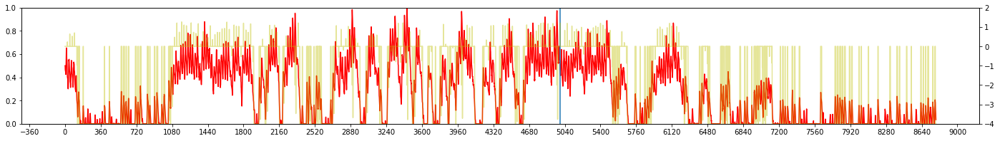

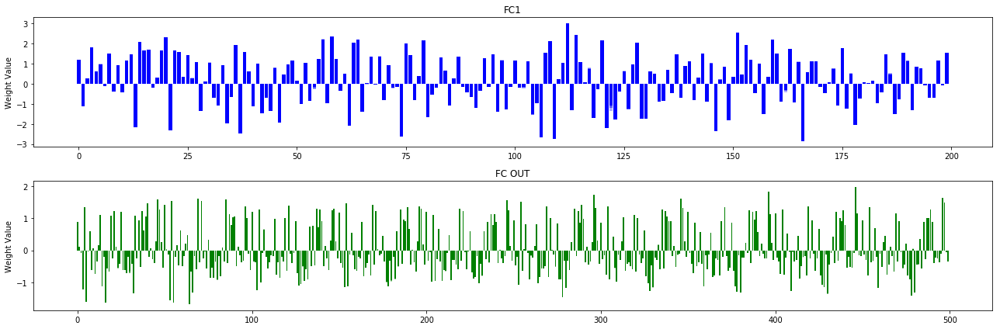

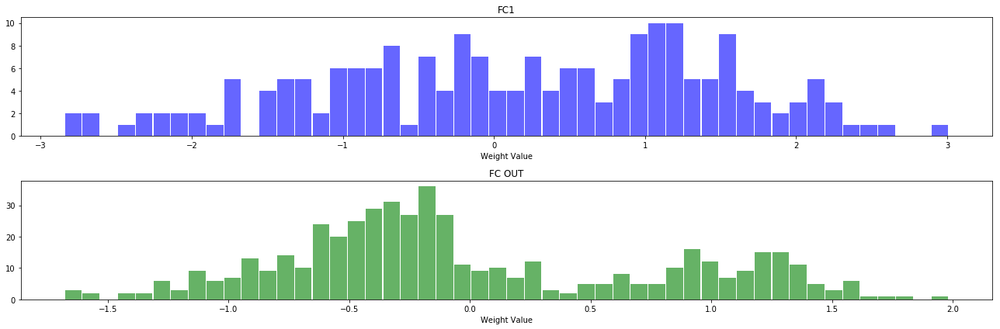


Iteration 34:  TOKYO, 2004 
EPSILON = 5.196e-01
LR = 1.000e-04
Average Terminal Reward  = -3.934
Day Violations           =    195
Battery Limit Violations =   1934
Action MEAN              =  4.726
Action STD DEV           =  3.033


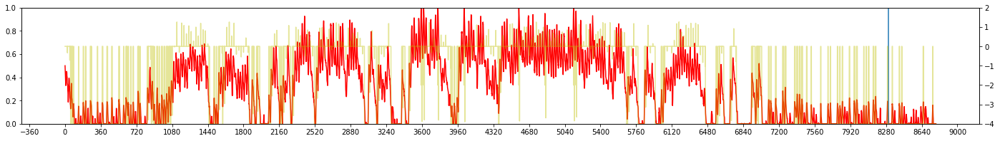

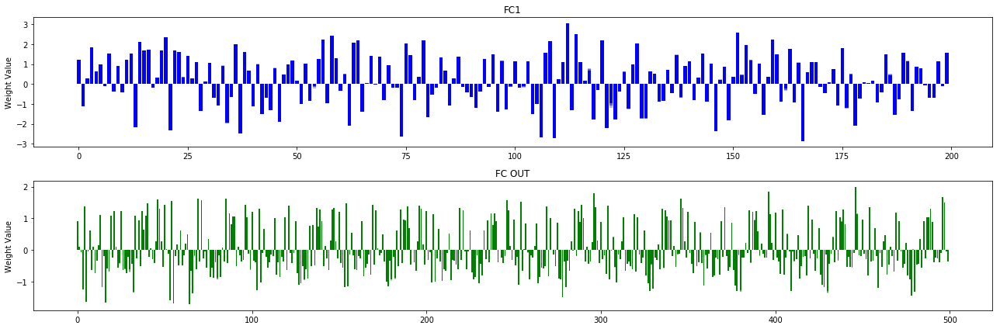

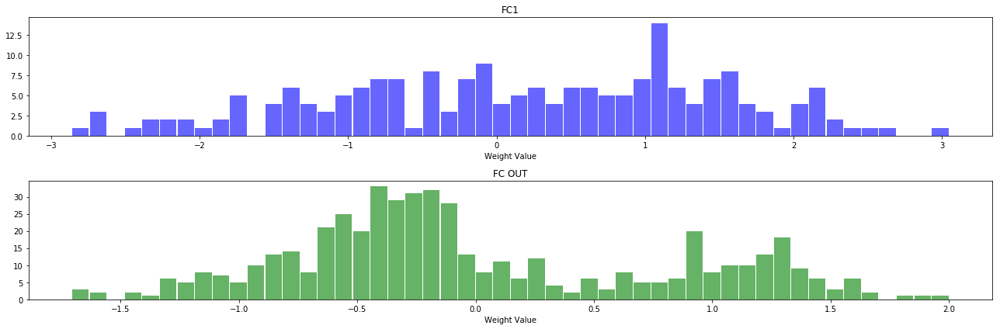


Iteration 35:  TOKYO, 2003 
EPSILON = 5.237e-01
LR = 1.000e-04
Average Terminal Reward  = -4.532
Day Violations           =    226
Battery Limit Violations =   2365
Action MEAN              =  4.522
Action STD DEV           =  2.943


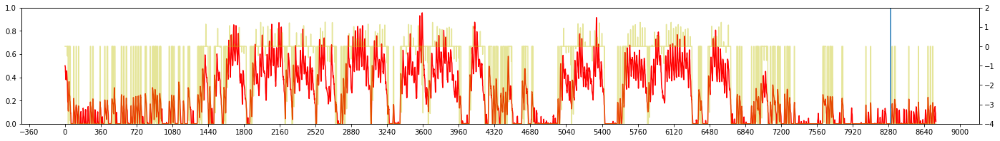

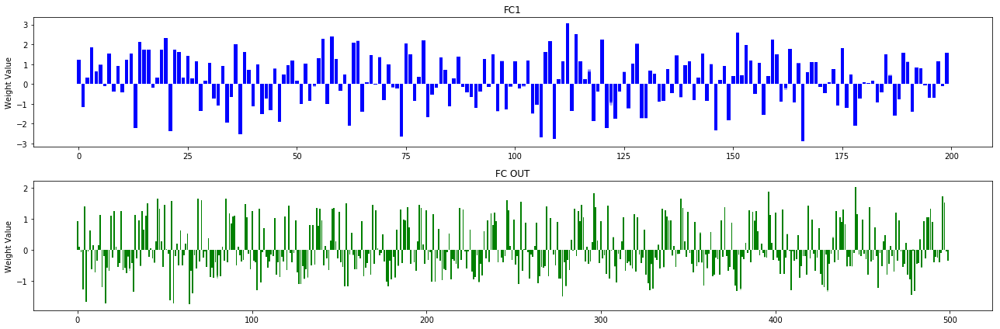

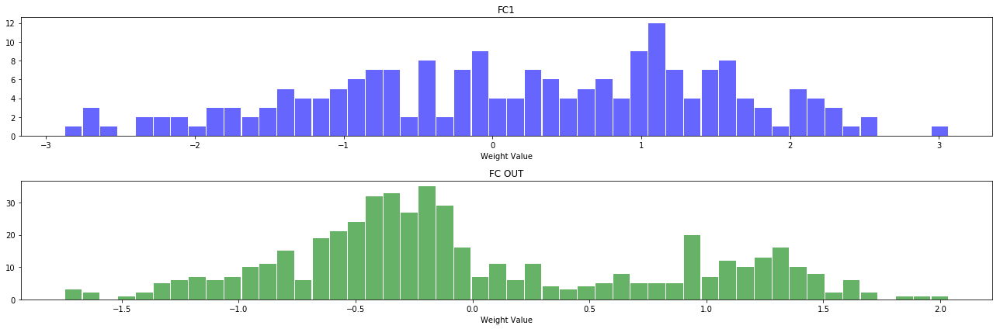


Iteration 36:  TOKYO, 2003 
EPSILON = 5.287e-01
LR = 1.000e-04
Average Terminal Reward  = -4.742
Day Violations           =    229
Battery Limit Violations =   2578
Action MEAN              =  4.664
Action STD DEV           =  2.887


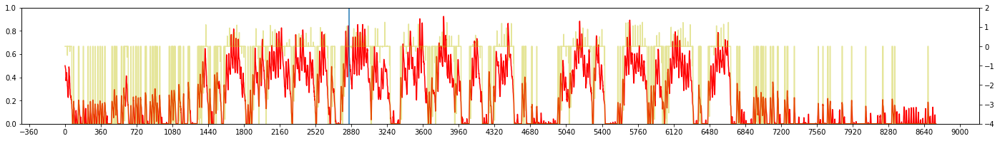

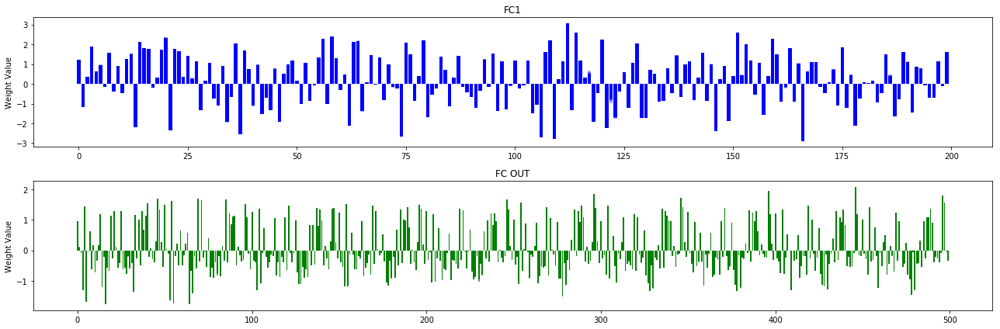

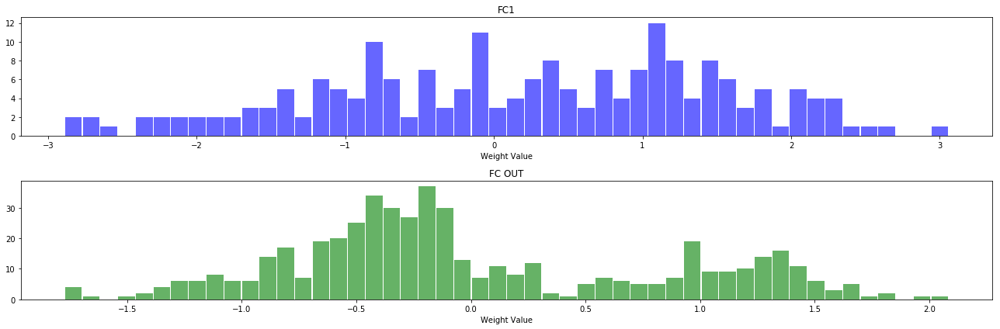


Iteration 37:  TOKYO, 2007 
EPSILON = 5.346e-01
LR = 1.000e-04
Average Terminal Reward  = -4.459
Day Violations           =    225
Battery Limit Violations =   2200
Action MEAN              =  4.769
Action STD DEV           =  3.057


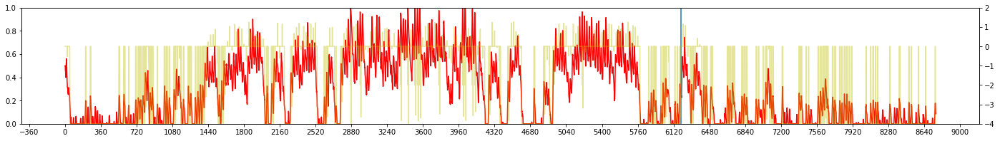

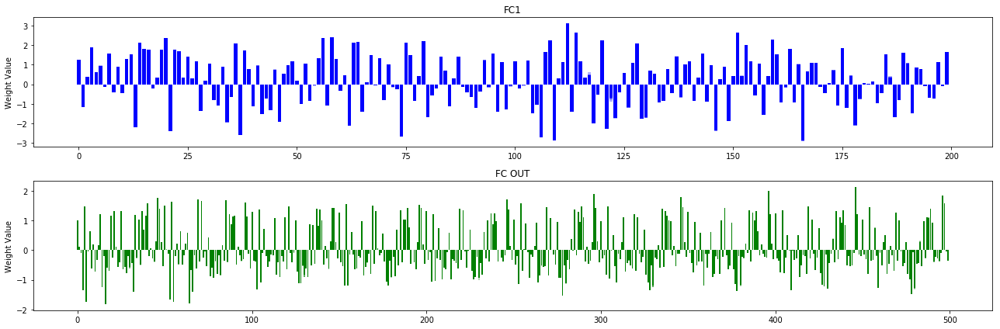

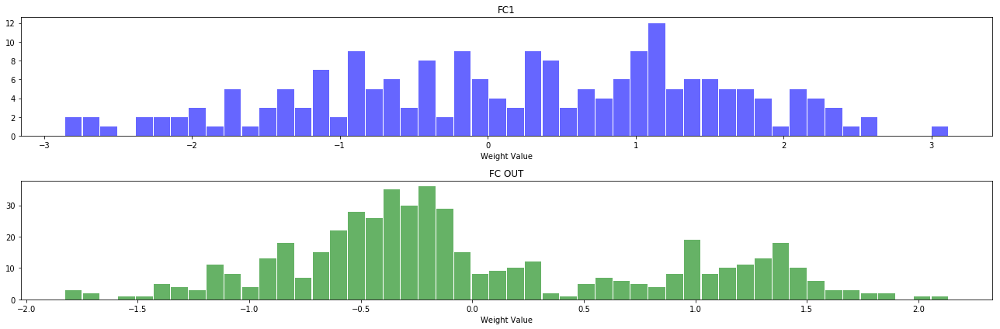


Iteration 38:  TOKYO, 2006 
EPSILON = 5.416e-01
LR = 1.000e-04
Average Terminal Reward  = -4.659
Day Violations           =    226
Battery Limit Violations =   2583
Action MEAN              =  4.588
Action STD DEV           =  2.994


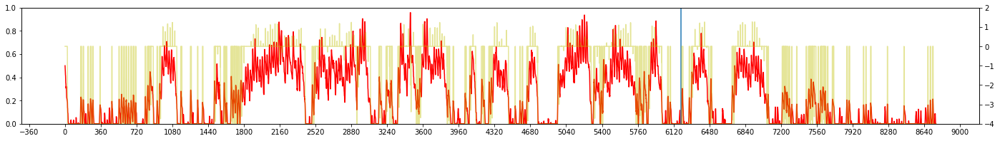

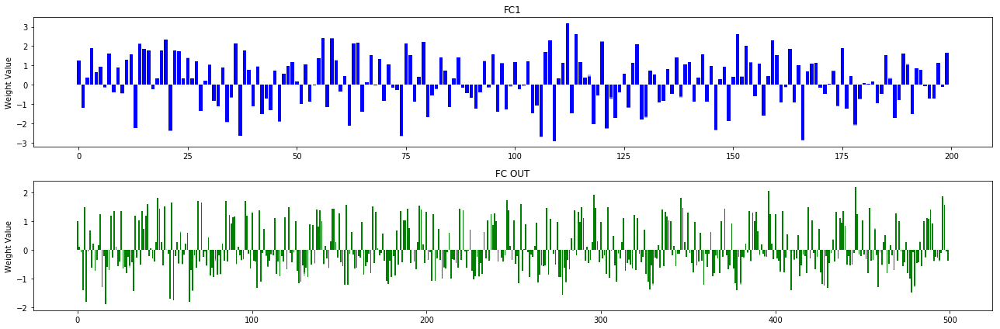

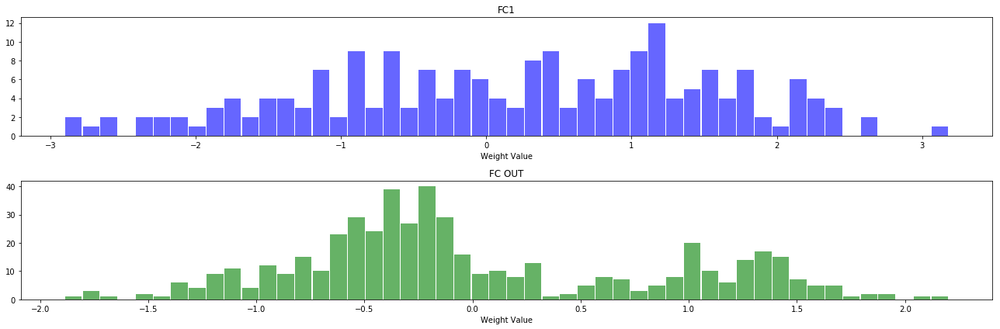


Iteration 39:  TOKYO, 2001 
EPSILON = 5.499e-01
LR = 1.000e-04
Average Terminal Reward  = -4.003
Day Violations           =    202
Battery Limit Violations =   1899
Action MEAN              =  4.555
Action STD DEV           =  3.141


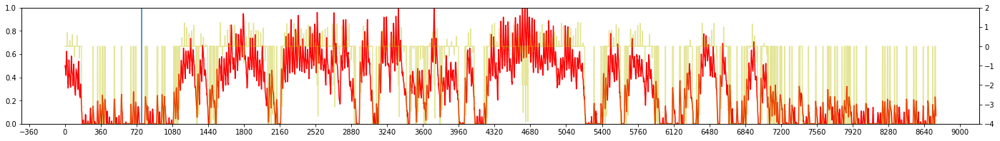

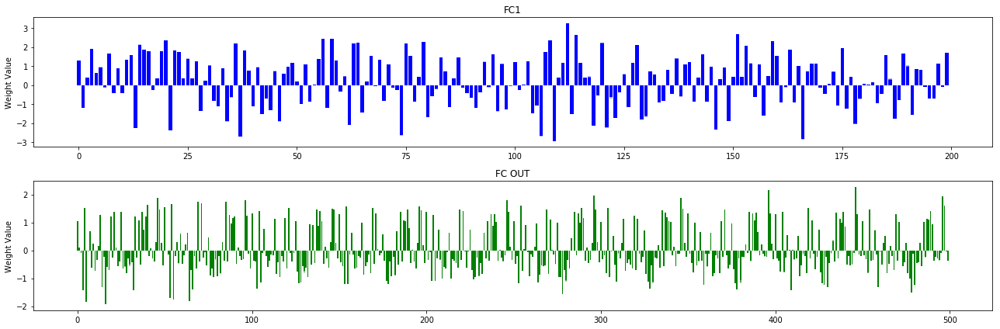

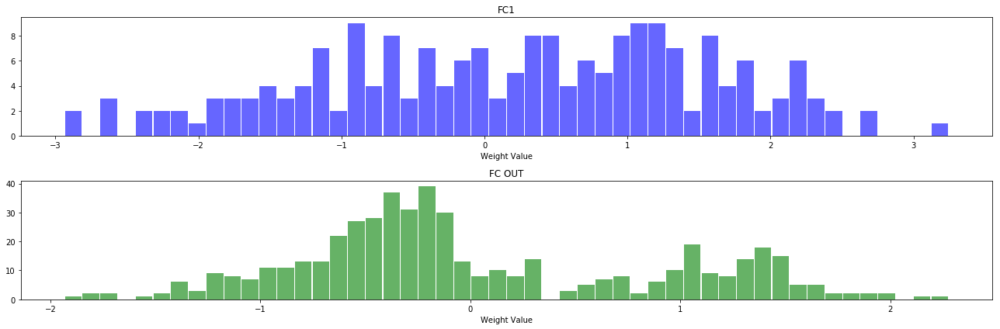


Iteration 40:  TOKYO, 2009 
EPSILON = 5.596e-01
LR = 1.000e-04
Average Terminal Reward  = -3.808
Day Violations           =    196
Battery Limit Violations =   1923
Action MEAN              =  4.493
Action STD DEV           =  3.033


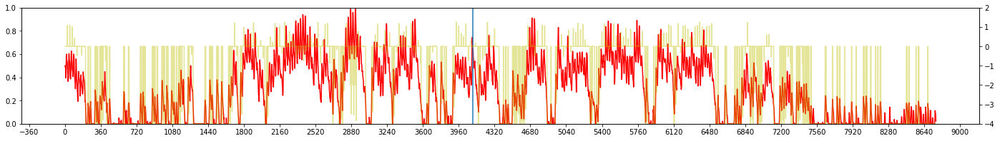

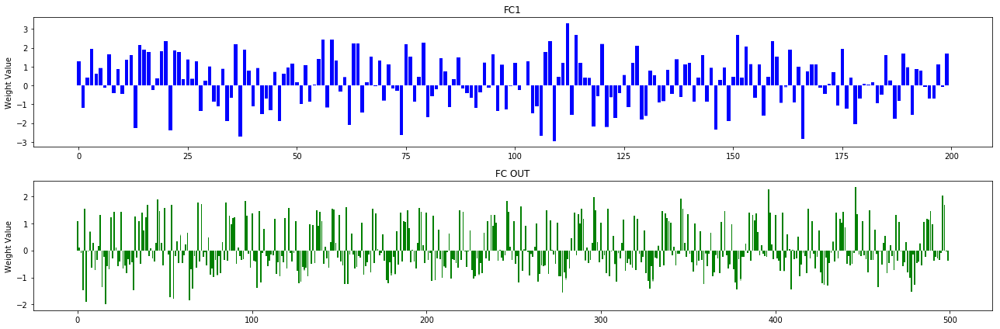

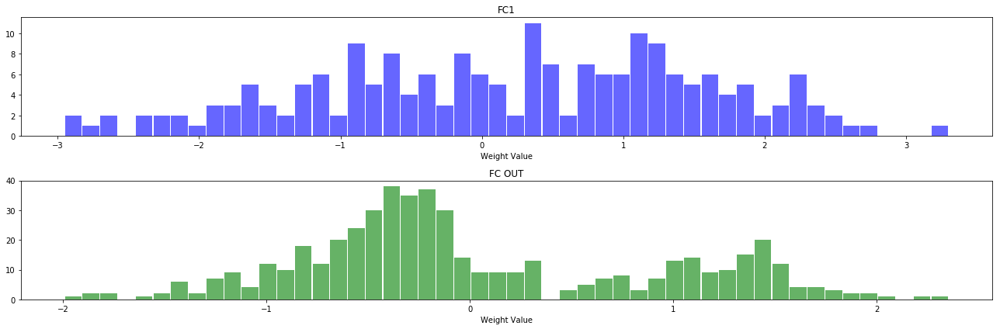


Iteration 41:  TOKYO, 2006 
EPSILON = 5.709e-01
LR = 1.000e-04
Average Terminal Reward  = -4.315
Day Violations           =    217
Battery Limit Violations =   2274
Action MEAN              =  4.393
Action STD DEV           =  3.011


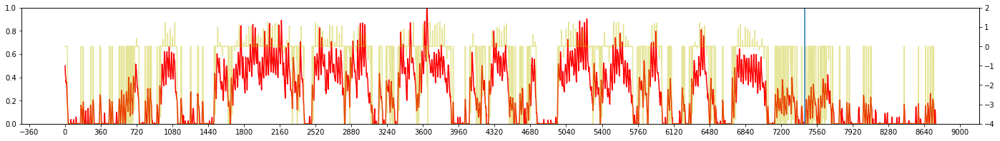

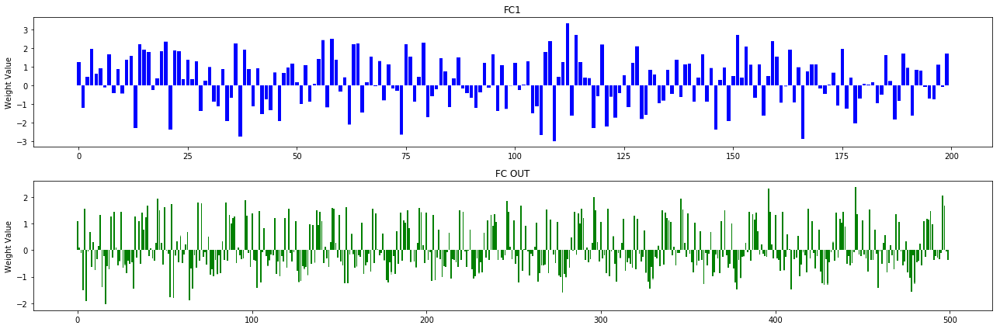

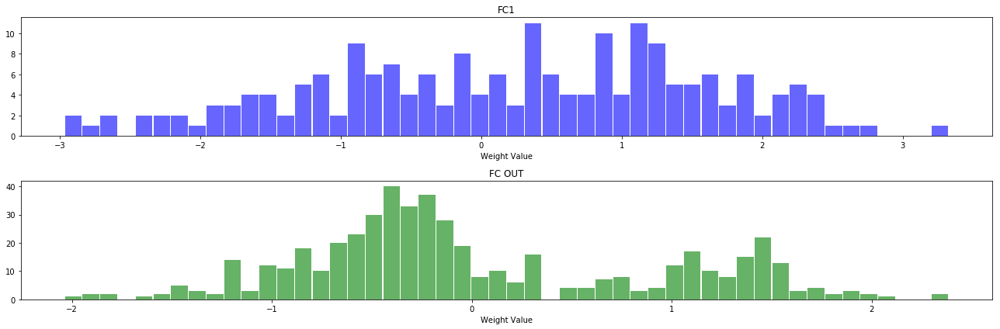


Iteration 42:  TOKYO, 2007 
EPSILON = 5.840e-01
LR = 1.000e-04
Average Terminal Reward  = -3.315
Day Violations           =    181
Battery Limit Violations =   1342
Action MEAN              =  4.308
Action STD DEV           =  3.257


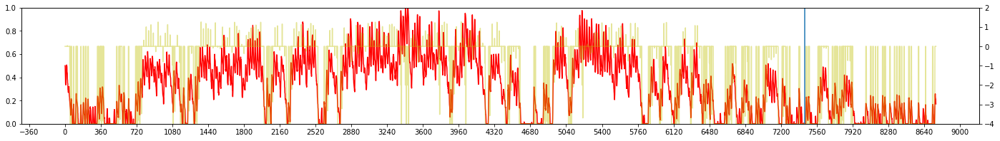

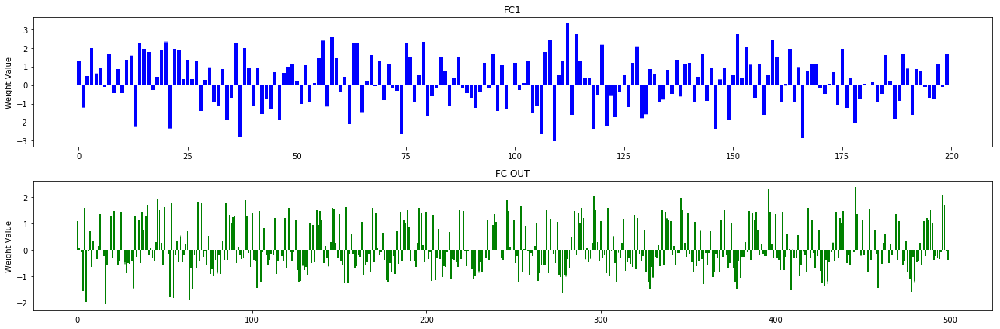

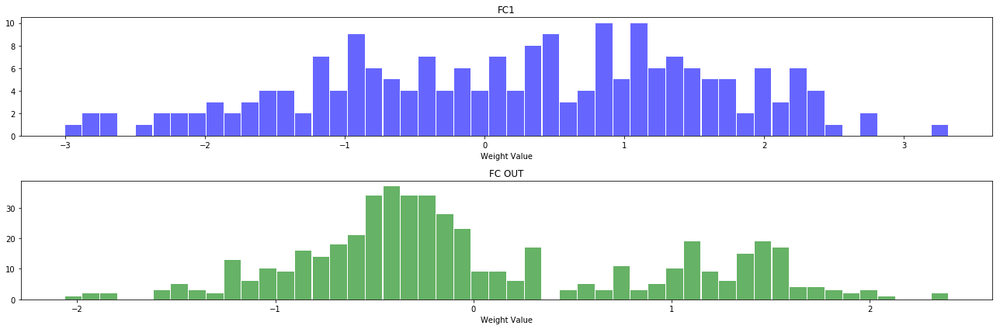


Iteration 43:  TOKYO, 2007 
EPSILON = 5.989e-01
LR = 1.000e-04
Average Terminal Reward  = -3.404
Day Violations           =    186
Battery Limit Violations =   1649
Action MEAN              =  4.557
Action STD DEV           =  3.271


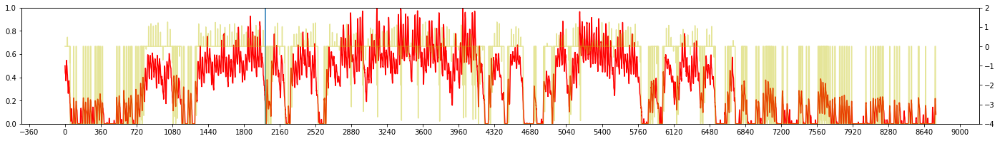

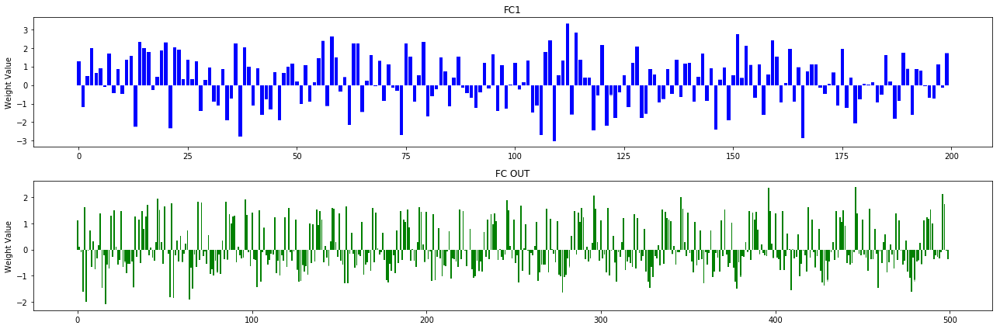

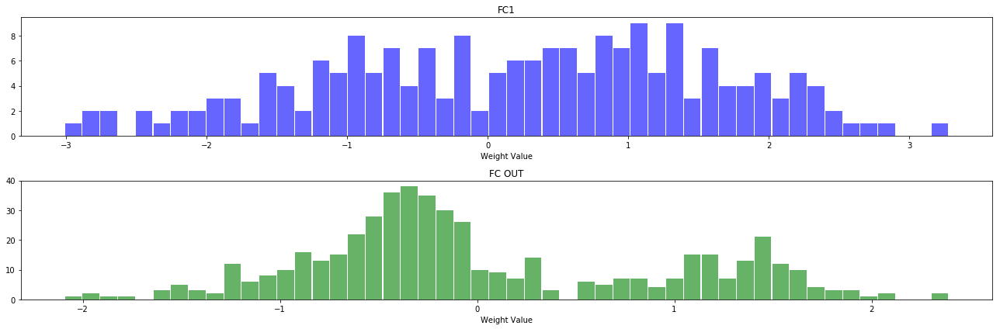


Iteration 44:  TOKYO, 2005 
EPSILON = 6.157e-01
LR = 1.000e-04
Average Terminal Reward  = -3.058
Day Violations           =    165
Battery Limit Violations =   1355
Action MEAN              =  4.293
Action STD DEV           =  3.229


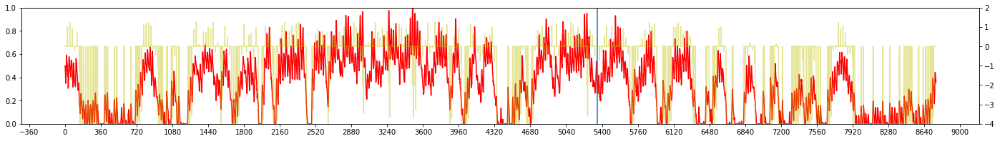

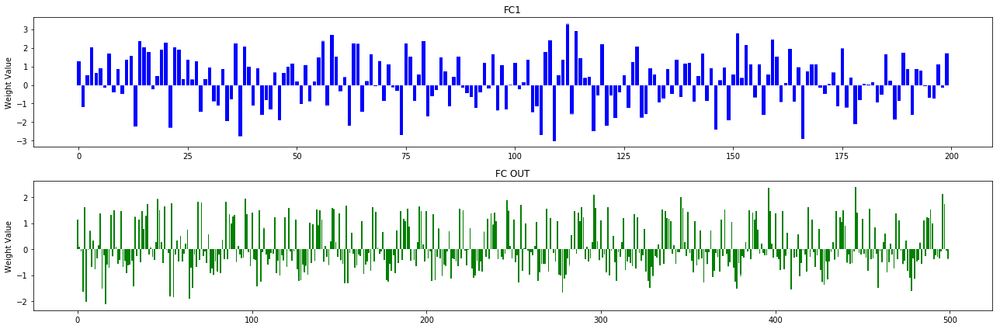

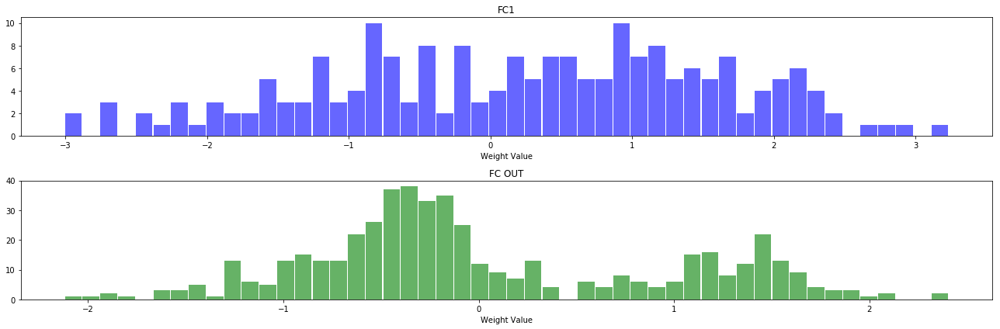


Iteration 45:  TOKYO, 2000 
EPSILON = 6.345e-01
LR = 1.000e-04
Average Terminal Reward  = -2.793
Day Violations           =    152
Battery Limit Violations =   1462
Action MEAN              =  4.350
Action STD DEV           =  3.379


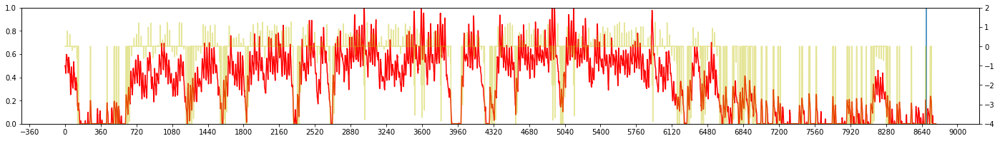

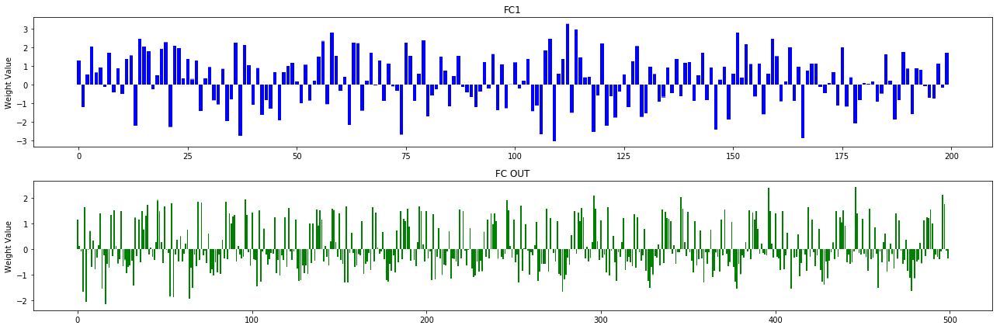

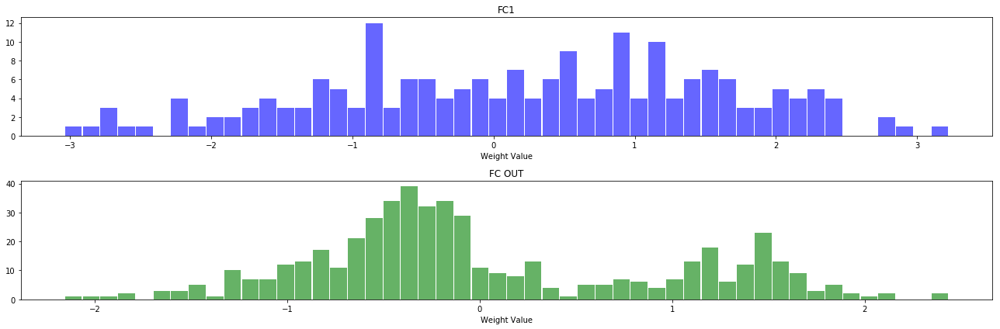


Iteration 46:  TOKYO, 2004 
EPSILON = 6.550e-01
LR = 1.000e-04
Average Terminal Reward  = -2.047
Day Violations           =    121
Battery Limit Violations =    953
Action MEAN              =  4.159
Action STD DEV           =  3.357


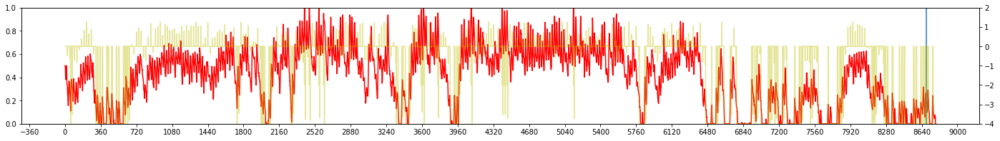

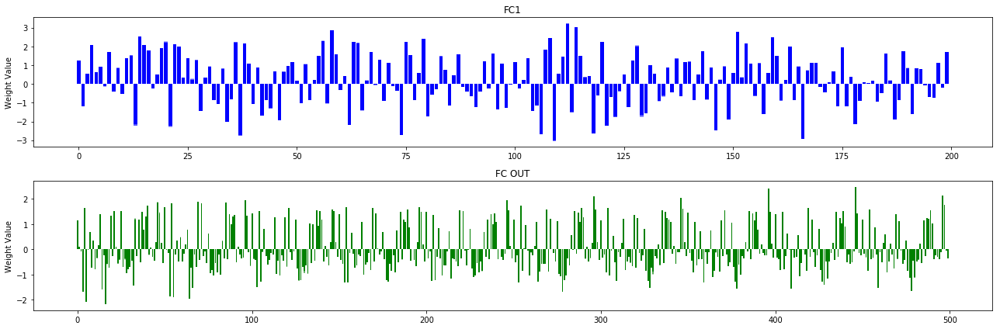

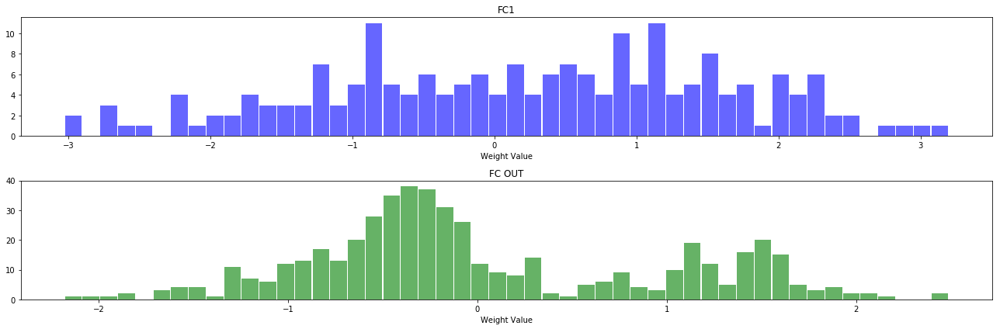


Iteration 47:  TOKYO, 2004 
EPSILON = 6.772e-01
LR = 1.000e-04
Average Terminal Reward  = -2.267
Day Violations           =    129
Battery Limit Violations =   1159
Action MEAN              =  4.322
Action STD DEV           =  3.296


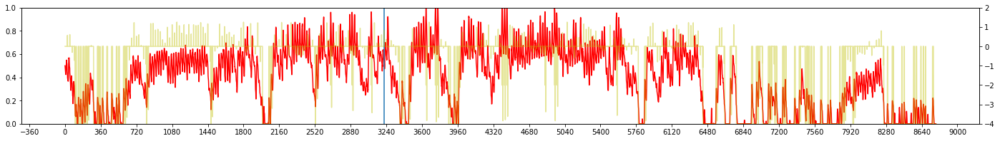

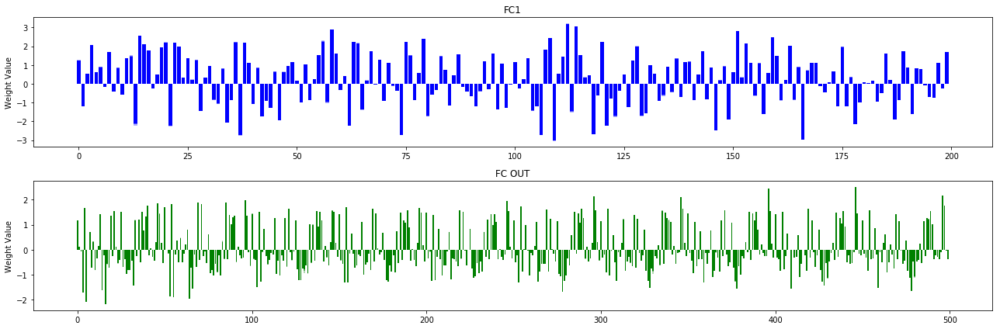

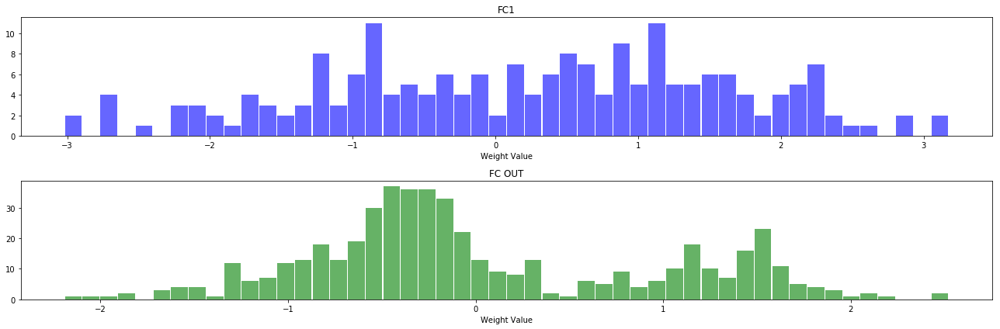


Iteration 48:  TOKYO, 2005 
EPSILON = 7.007e-01
LR = 1.000e-04
Average Terminal Reward  = -1.699
Day Violations           =    108
Battery Limit Violations =    577
Action MEAN              =  3.771
Action STD DEV           =  3.255


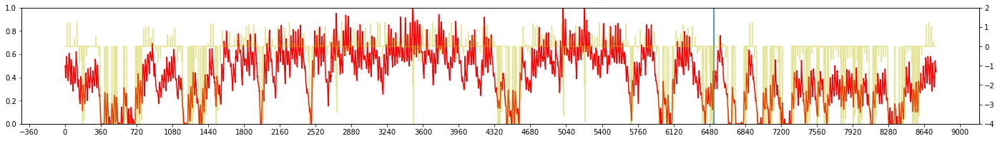

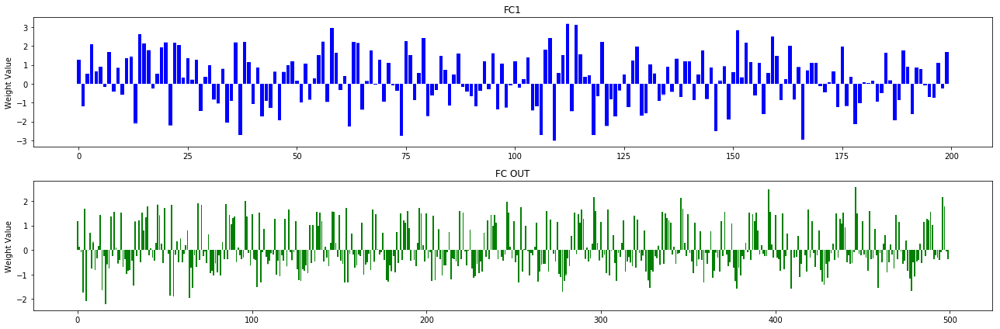

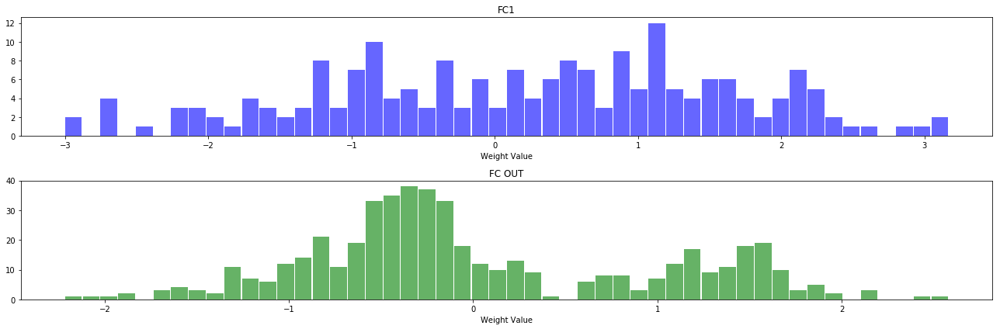


Iteration 49:  TOKYO, 2002 
EPSILON = 7.251e-01
LR = 1.000e-04
Average Terminal Reward  = -2.063
Day Violations           =    124
Battery Limit Violations =   1003
Action MEAN              =  3.995
Action STD DEV           =  3.317


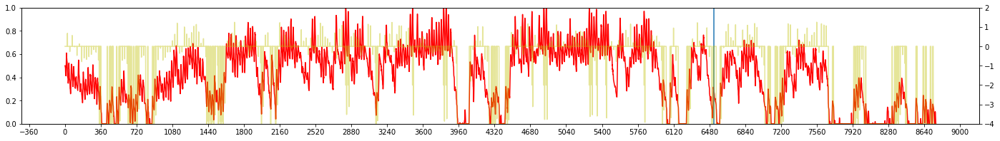

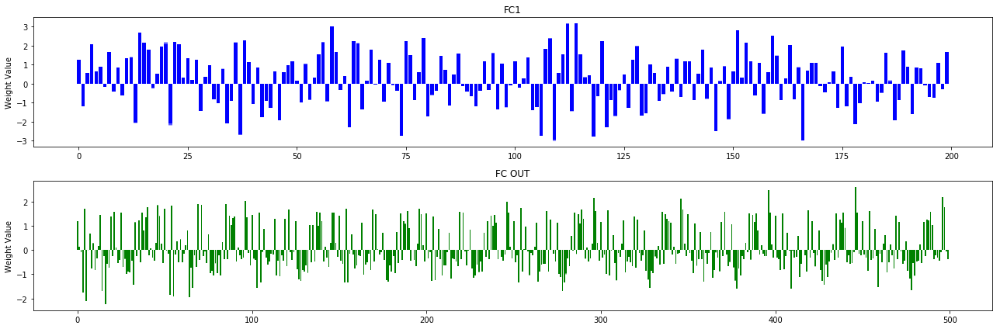

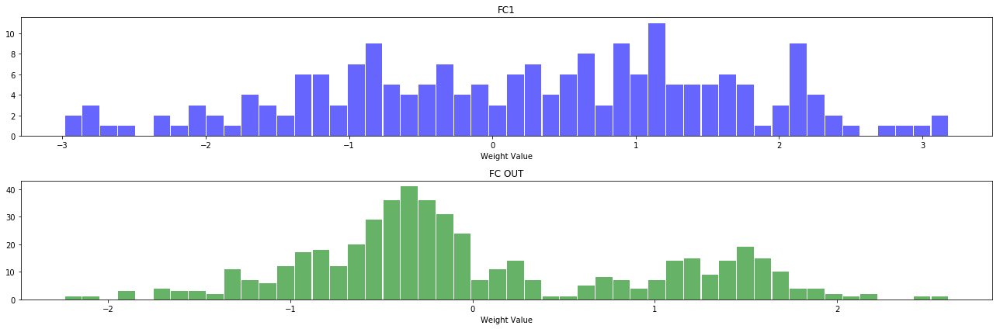


Iteration 50:  TOKYO, 2006 
EPSILON = 7.500e-01
LR = 1.000e-04
Average Terminal Reward  = -1.778
Day Violations           =    100
Battery Limit Violations =   1009
Action MEAN              =  3.644
Action STD DEV           =  3.132


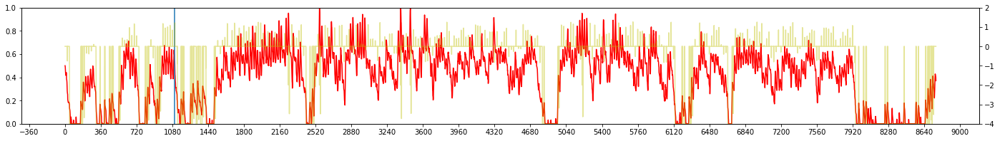

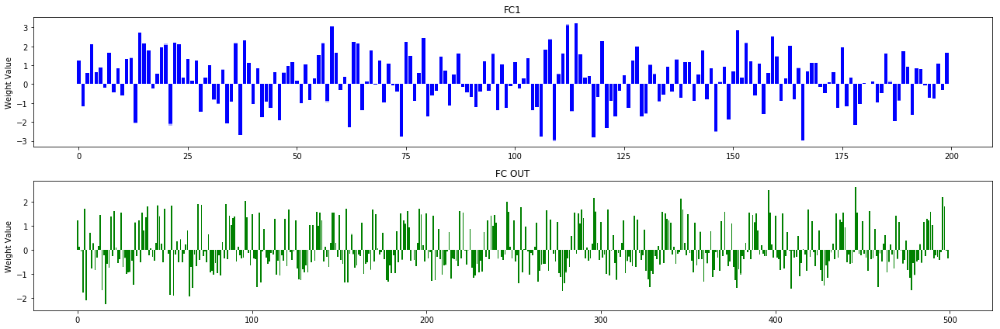

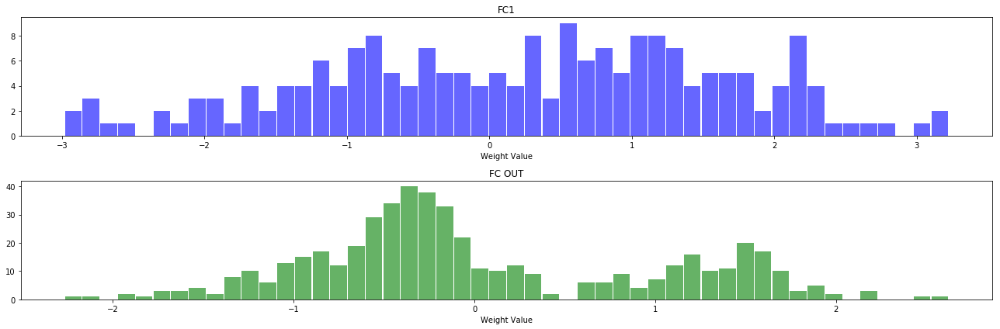


Iteration 51:  TOKYO, 2003 
EPSILON = 7.749e-01
LR = 8.560e-05
Average Terminal Reward  = -0.555
Day Violations           =     59
Battery Limit Violations =    318
Action MEAN              =  3.366
Action STD DEV           =  3.208


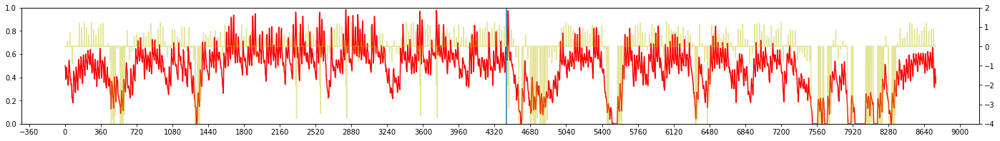

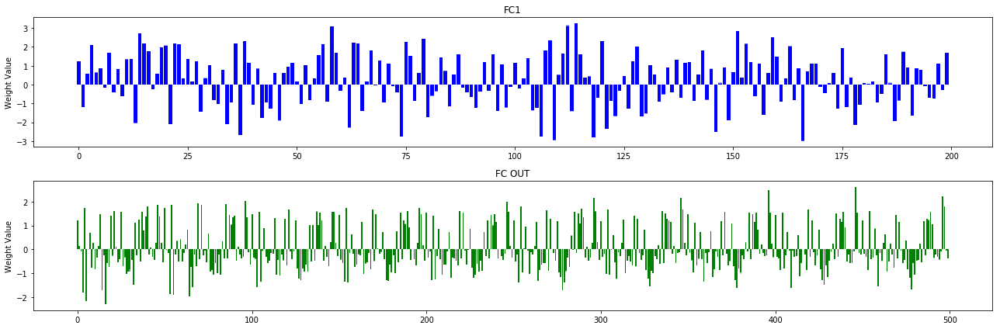

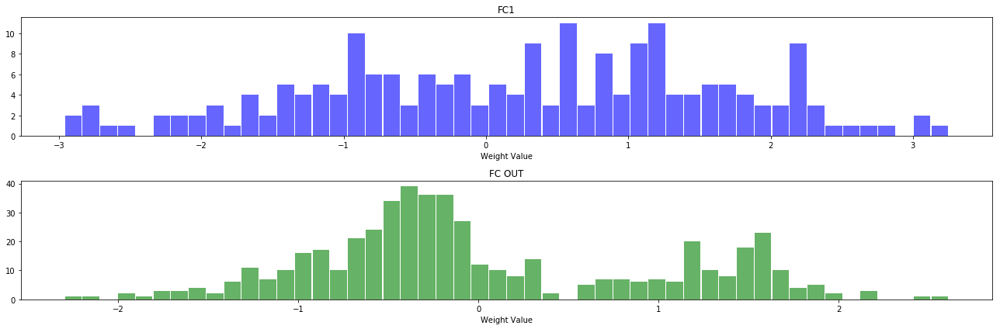


Iteration 52:  TOKYO, 2001 
EPSILON = 7.993e-01
LR = 7.329e-05
Average Terminal Reward  =  0.280
Day Violations           =     16
Battery Limit Violations =     30
Action MEAN              =  3.422
Action STD DEV           =  3.377


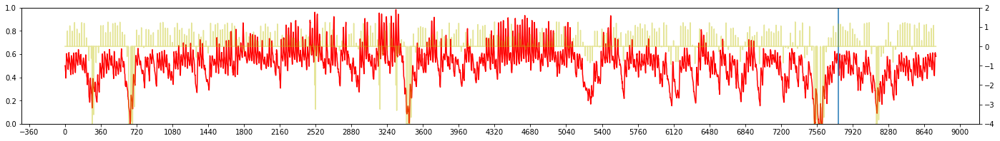

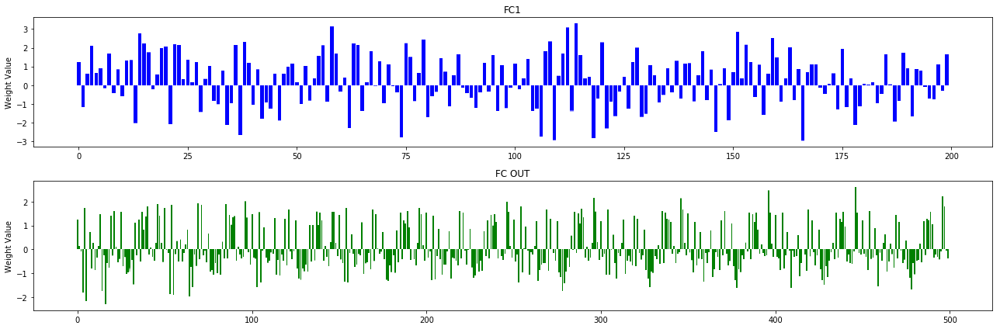

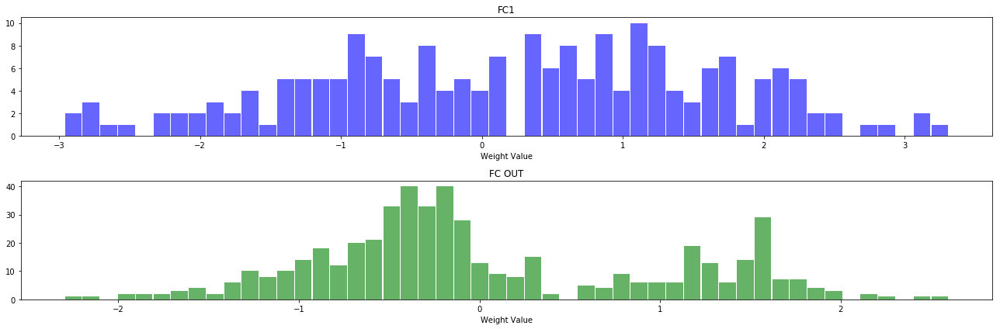


Iteration 53:  TOKYO, 2001 
EPSILON = 8.228e-01
LR = 6.276e-05
Average Terminal Reward  =  0.321
Day Violations           =     17
Battery Limit Violations =      0
Action MEAN              =  3.397
Action STD DEV           =  3.446


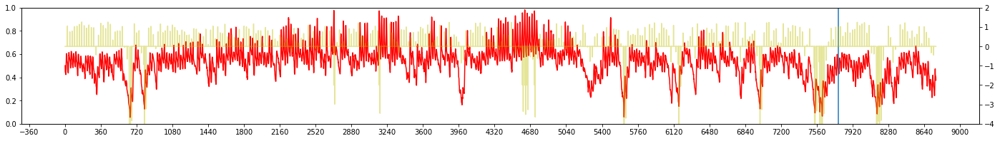

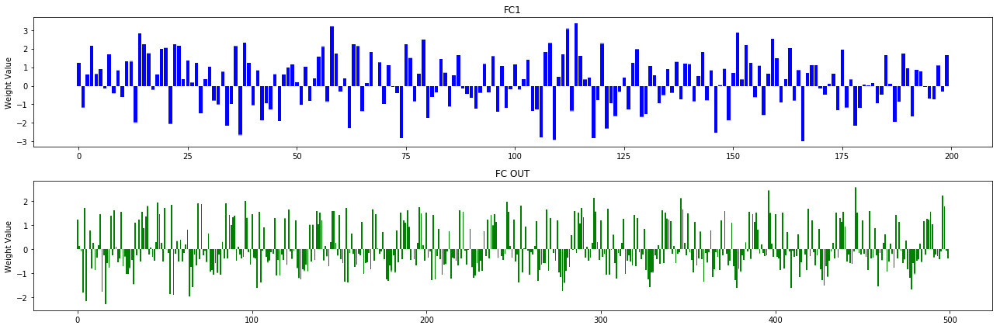

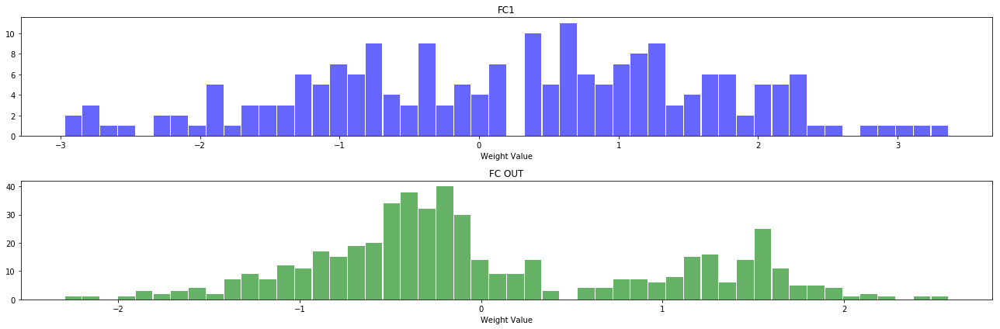


Iteration 54:  TOKYO, 2008 
EPSILON = 8.450e-01
LR = 5.376e-05
Average Terminal Reward  =  0.163
Day Violations           =     19
Battery Limit Violations =     75
Action MEAN              =  3.388
Action STD DEV           =  3.403


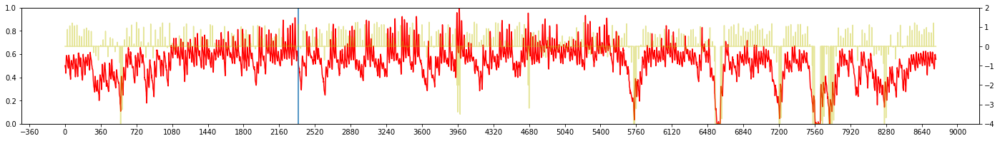

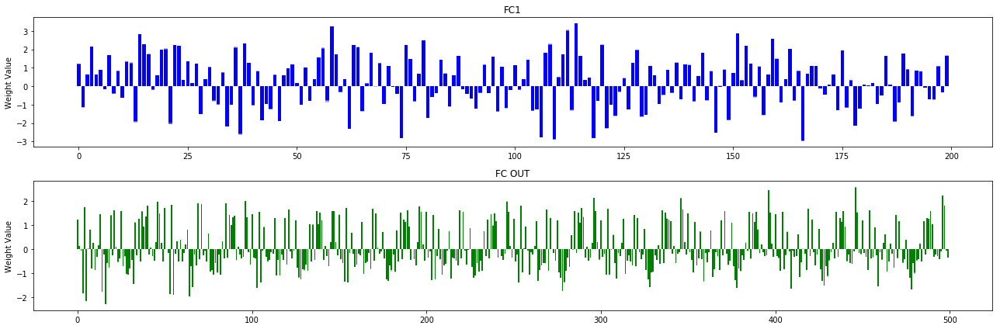

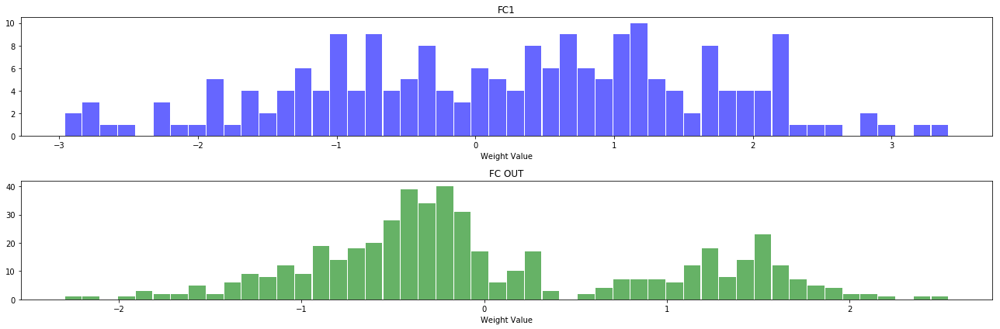


Iteration 55:  TOKYO, 2002 
EPSILON = 8.655e-01
LR = 4.607e-05
Average Terminal Reward  =  0.086
Day Violations           =     23
Battery Limit Violations =     42
Action MEAN              =  3.433
Action STD DEV           =  3.432


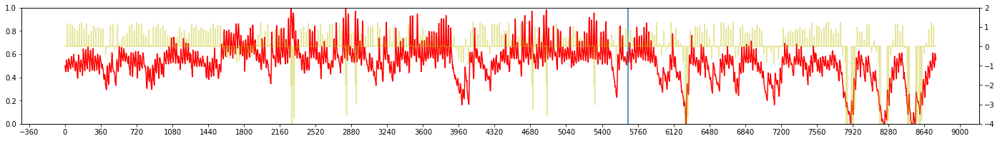

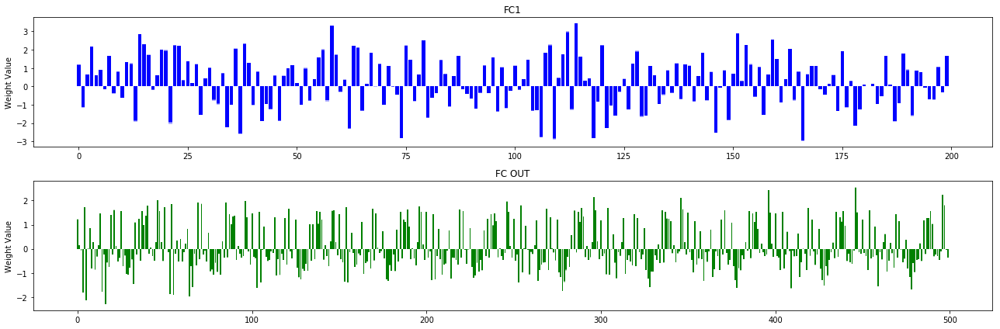

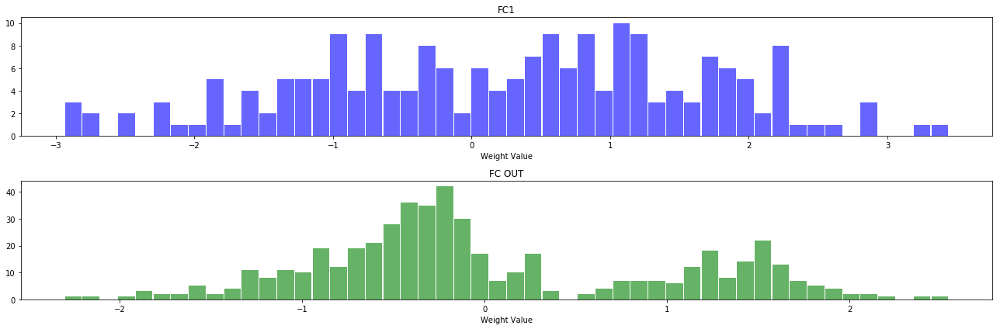


Iteration 56:  TOKYO, 2008 
EPSILON = 8.843e-01
LR = 3.949e-05
Average Terminal Reward  =  0.429
Day Violations           =      7
Battery Limit Violations =      9
Action MEAN              =  3.366
Action STD DEV           =  3.480


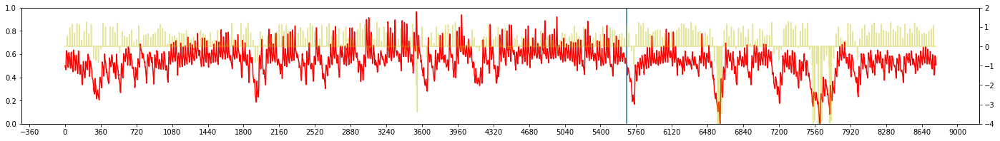

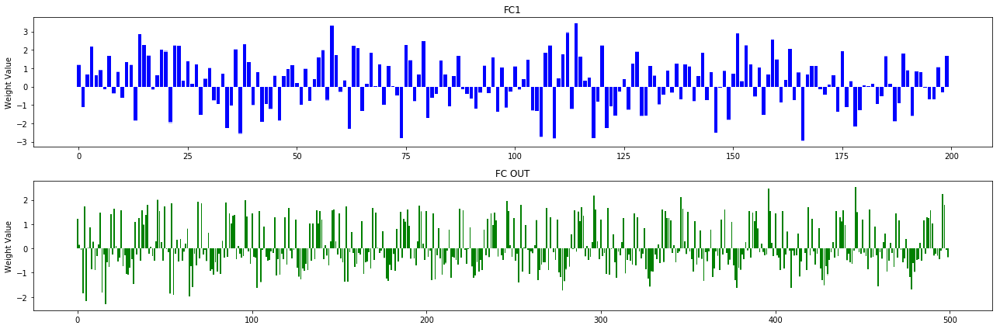

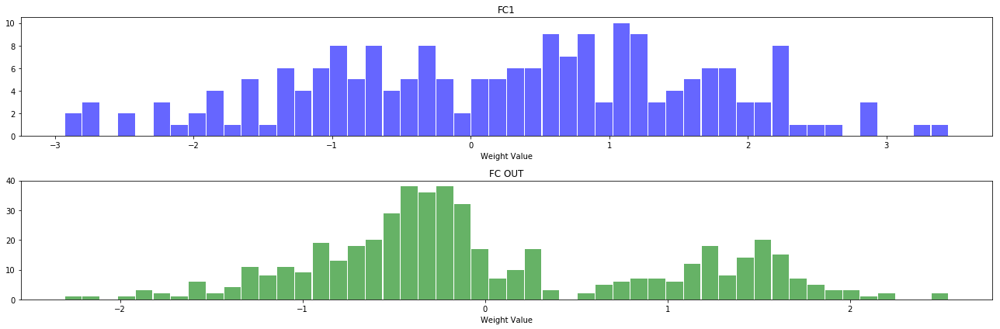


Iteration 57:  TOKYO, 2000 
EPSILON = 9.011e-01
LR = 3.386e-05
Average Terminal Reward  =  0.320
Day Violations           =     15
Battery Limit Violations =    116
Action MEAN              =  3.495
Action STD DEV           =  3.572


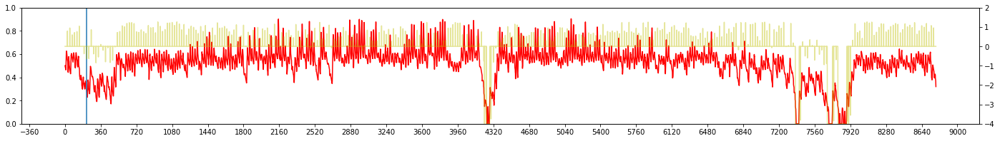

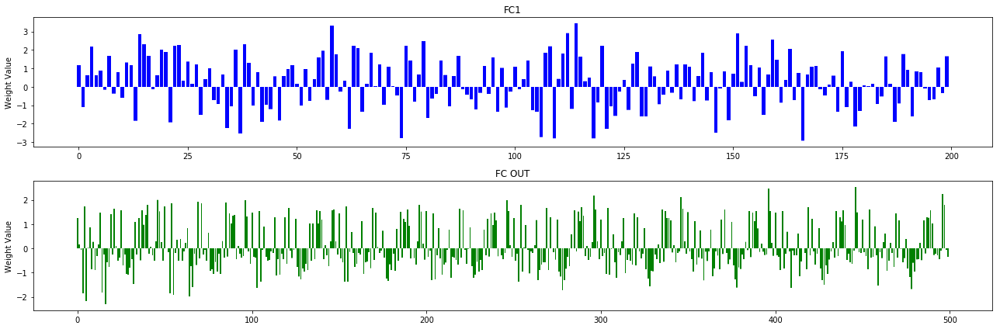

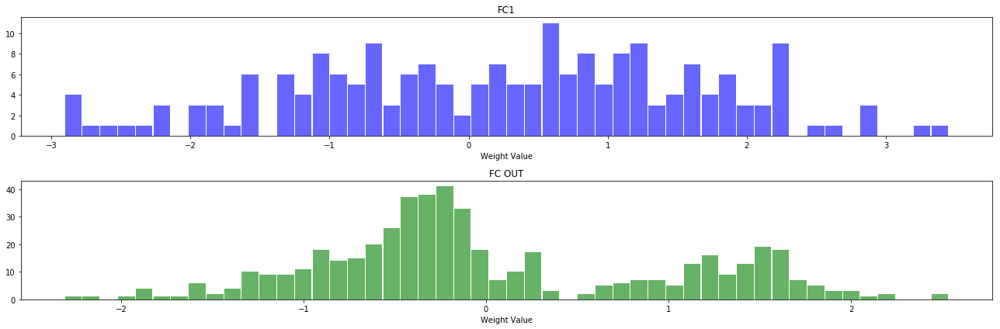


Iteration 58:  TOKYO, 2002 
EPSILON = 9.160e-01
LR = 2.905e-05
Average Terminal Reward  =  0.534
Day Violations           =      5
Battery Limit Violations =     16
Action MEAN              =  3.411
Action STD DEV           =  3.485


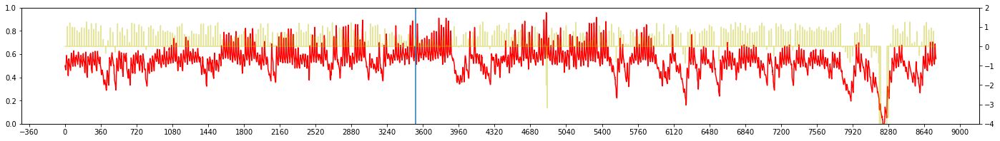

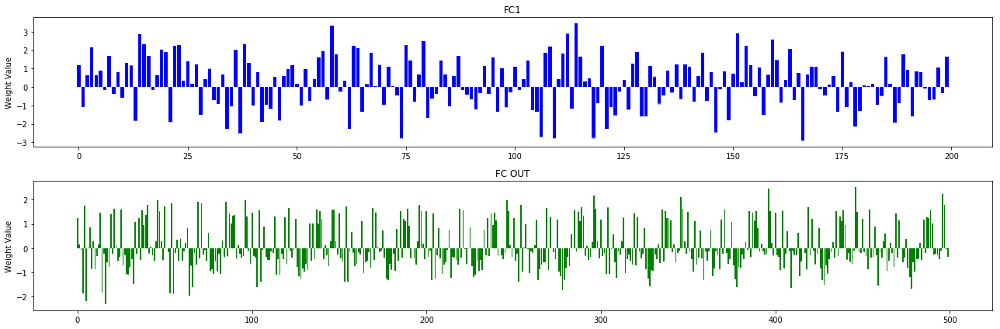

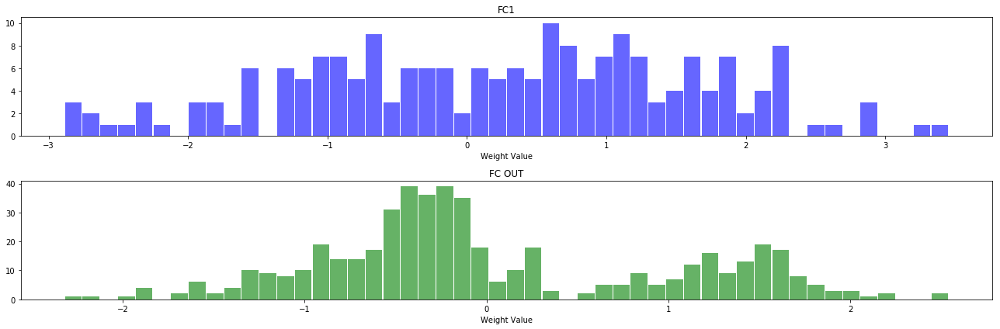


Iteration 59:  TOKYO, 2001 
EPSILON = 9.291e-01
LR = 2.494e-05
Average Terminal Reward  =  0.688
Day Violations           =      1
Battery Limit Violations =      0
Action MEAN              =  3.394
Action STD DEV           =  3.365


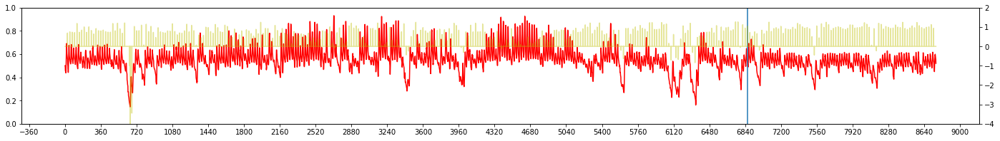

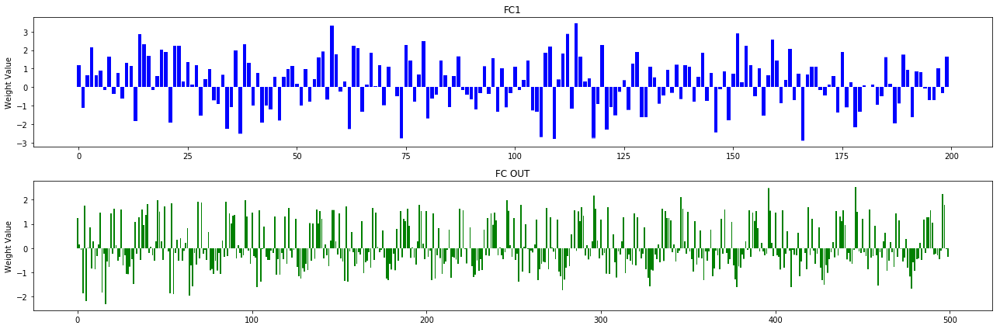

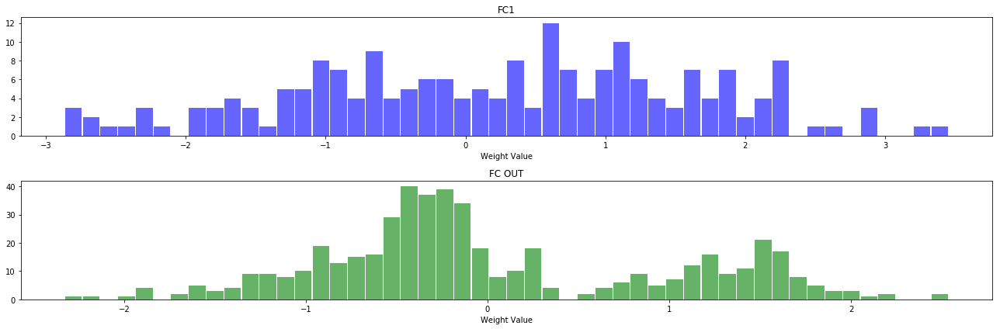


Iteration 60:  TOKYO, 2003 
EPSILON = 9.404e-01
LR = 2.142e-05
Average Terminal Reward  =  0.661
Day Violations           =      2
Battery Limit Violations =     13
Action MEAN              =  3.170
Action STD DEV           =  3.303


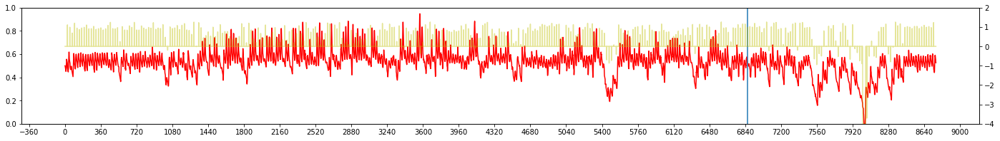

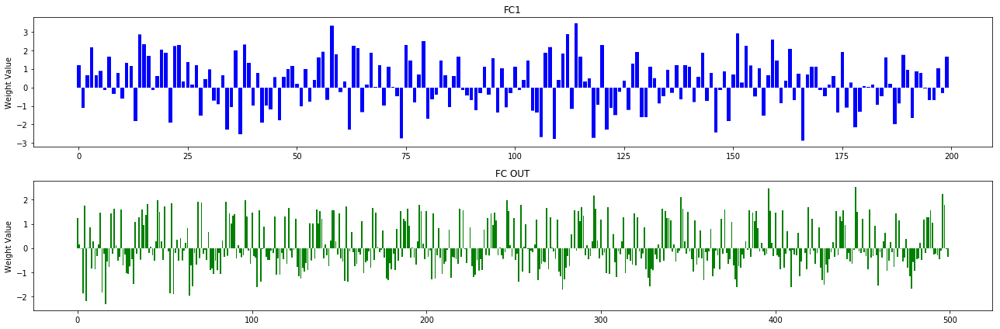

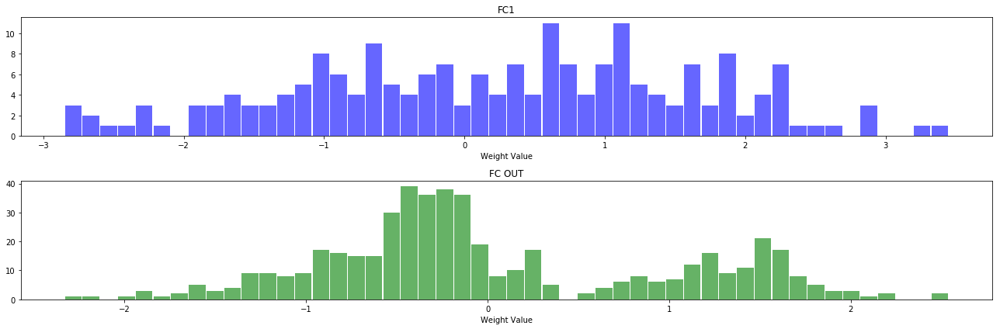


Iteration 61:  TOKYO, 2004 
EPSILON = 9.501e-01
LR = 1.842e-05
Average Terminal Reward  =  0.672
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.593
Action STD DEV           =  3.511


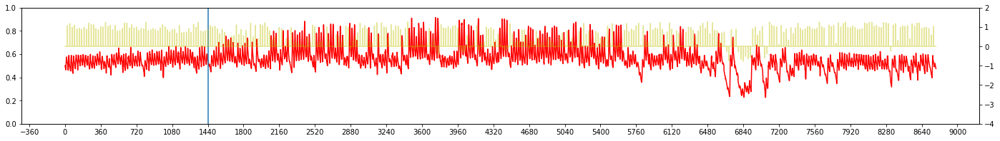

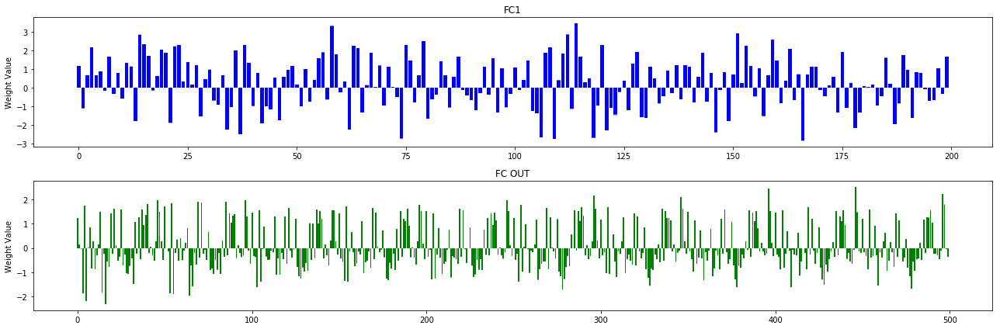

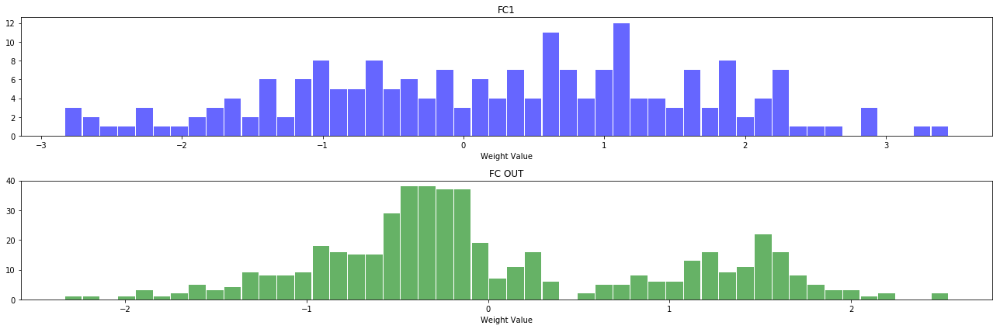


Iteration 62:  TOKYO, 2007 
EPSILON = 9.584e-01
LR = 1.585e-05
Average Terminal Reward  =  0.651
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.479
Action STD DEV           =  3.360


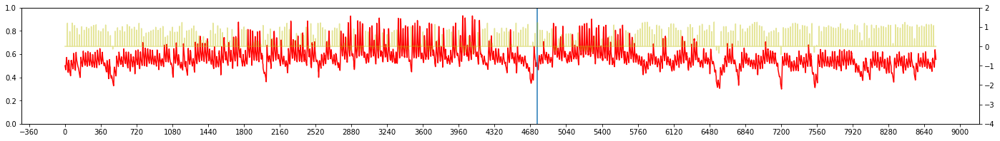

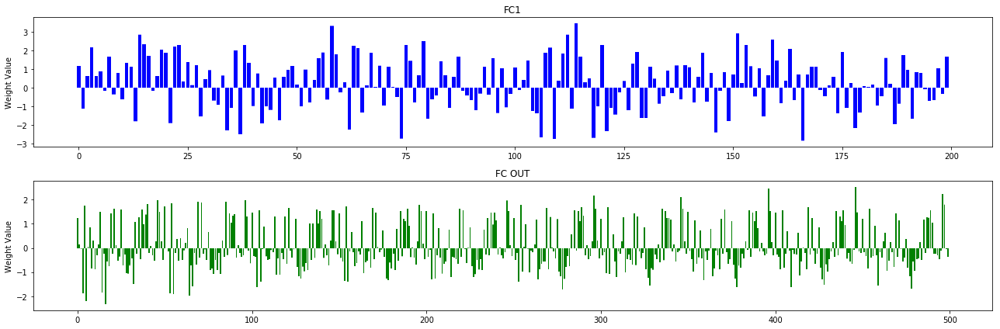

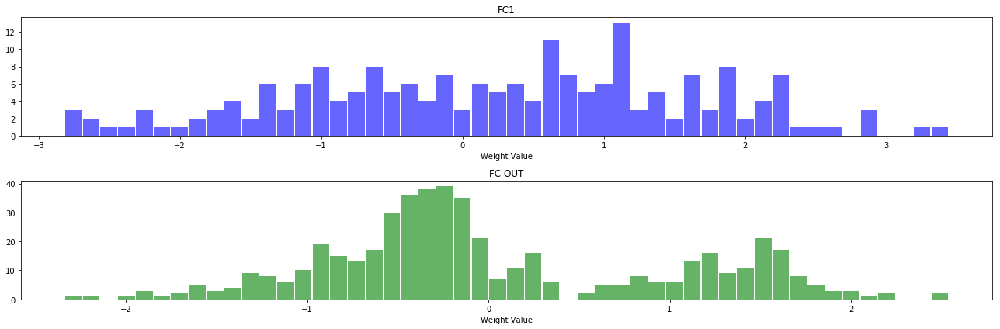


Iteration 63:  TOKYO, 2000 
EPSILON = 9.654e-01
LR = 1.365e-05
Average Terminal Reward  =  0.670
Day Violations           =      1
Battery Limit Violations =      0
Action MEAN              =  3.375
Action STD DEV           =  3.257


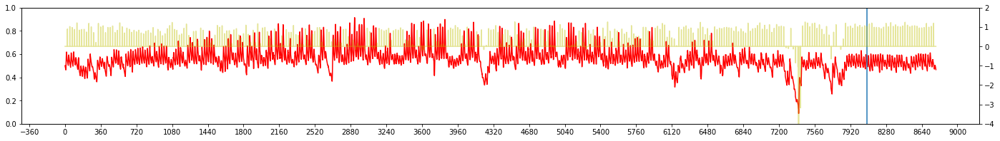

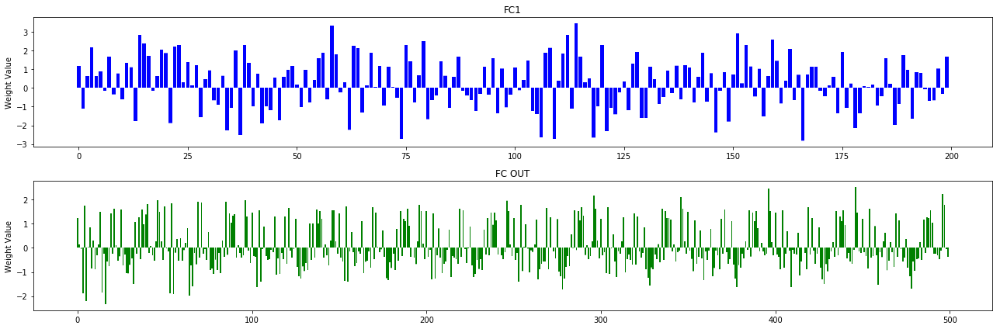

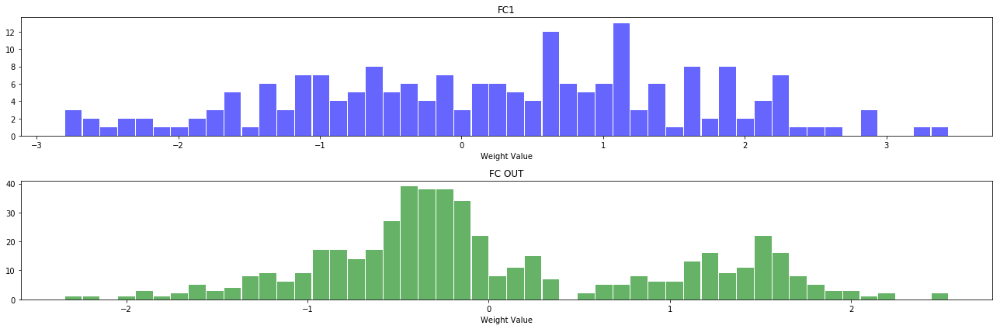


Iteration 64:  TOKYO, 2002 
EPSILON = 9.713e-01
LR = 1.177e-05
Average Terminal Reward  =  0.813
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.397
Action STD DEV           =  3.328


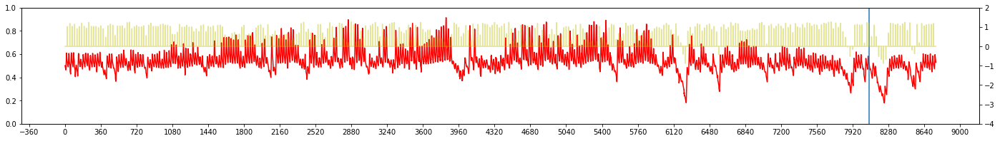

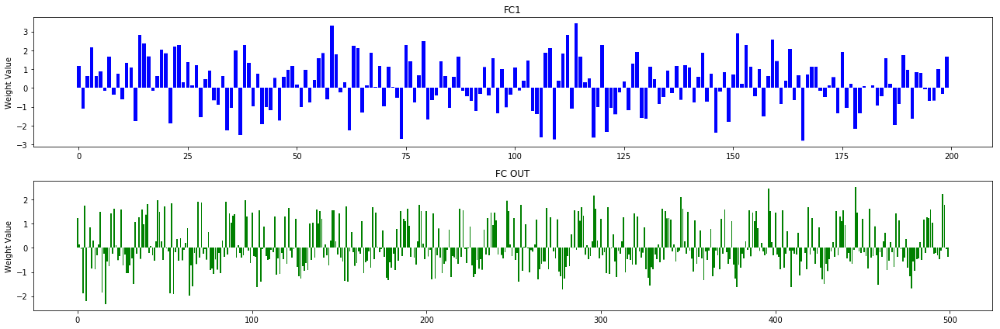

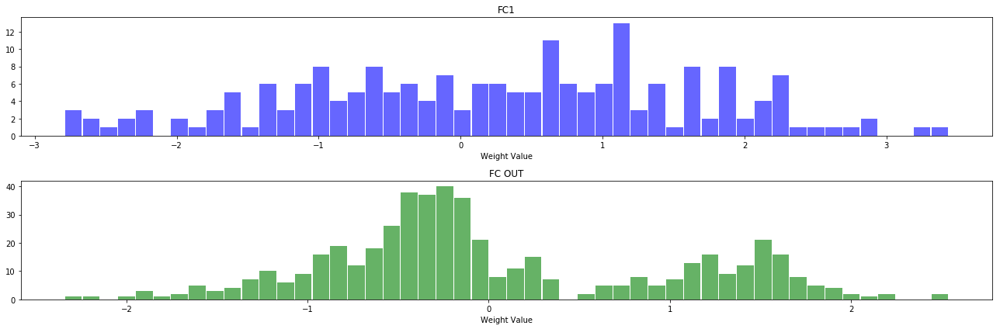


Iteration 65:  TOKYO, 2006 
EPSILON = 9.763e-01
LR = 1.016e-05
Average Terminal Reward  =  0.893
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.044
Action STD DEV           =  3.159


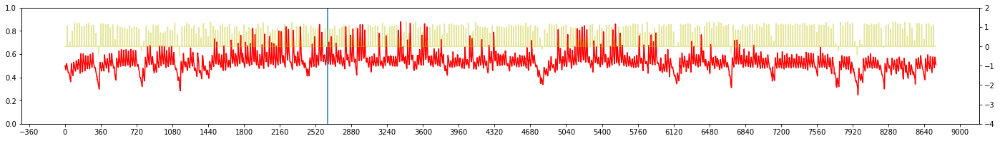

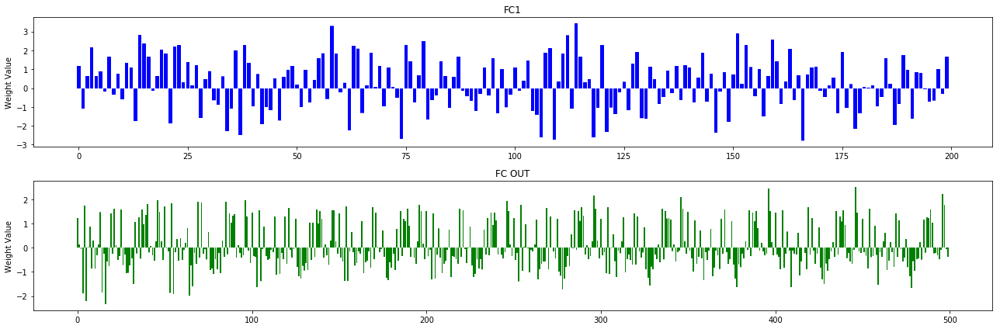

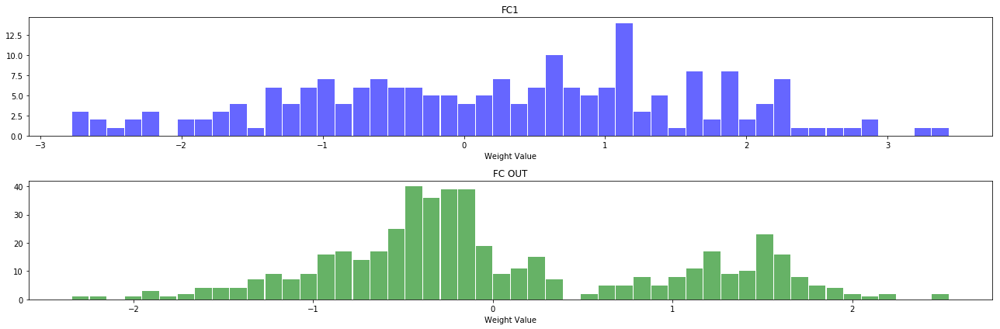


Iteration 66:  TOKYO, 2009 
EPSILON = 9.804e-01
LR = 8.789e-06
Average Terminal Reward  =  0.934
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.318
Action STD DEV           =  3.426


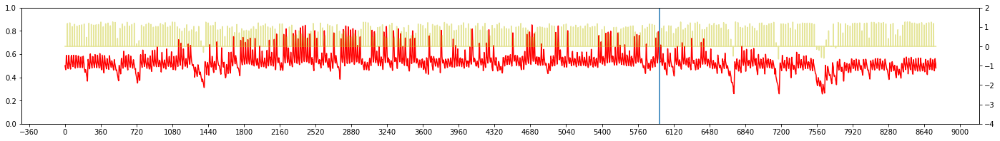

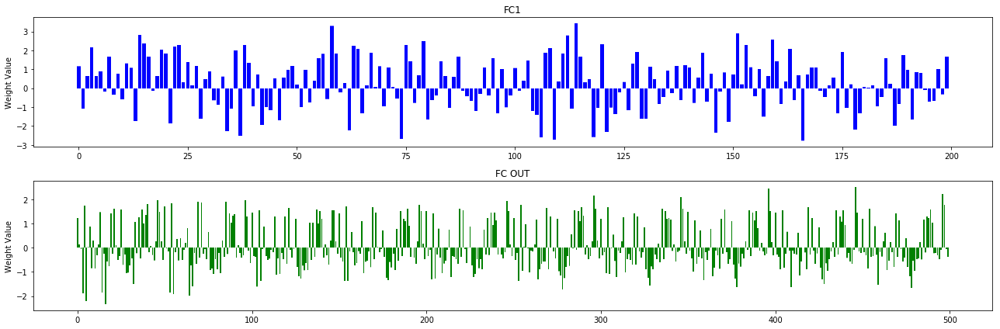

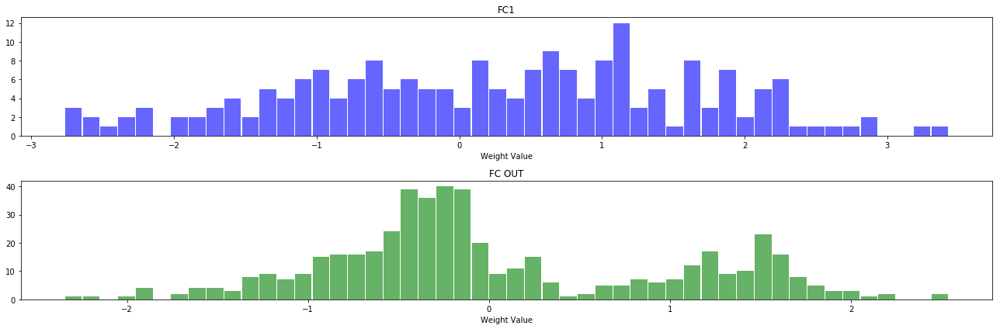


Iteration 67:  TOKYO, 2008 
EPSILON = 9.839e-01
LR = 7.615e-06
Average Terminal Reward  =  1.001
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.359
Action STD DEV           =  3.479


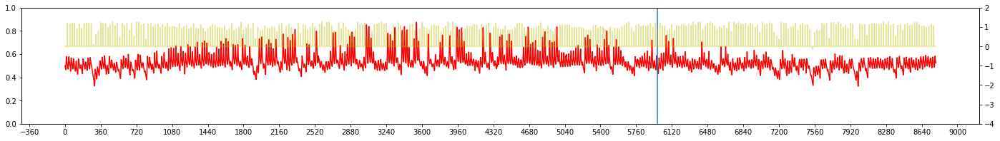

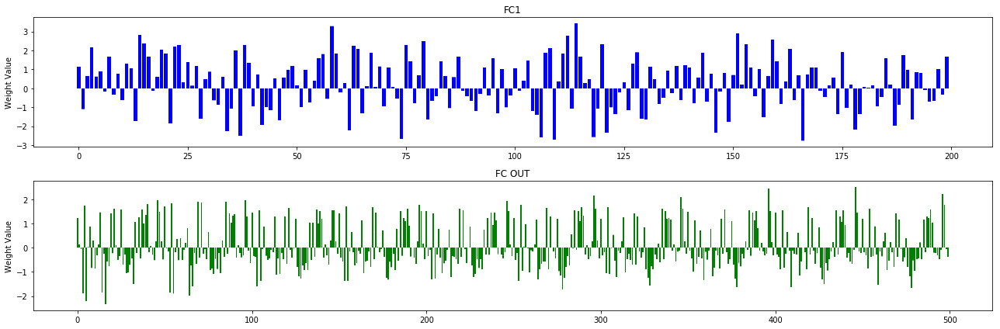

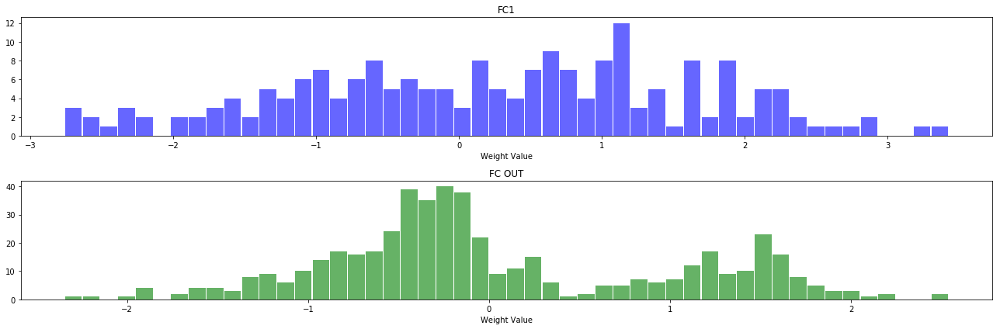


Iteration 68:  TOKYO, 2008 
EPSILON = 9.867e-01
LR = 6.611e-06
Average Terminal Reward  =  1.015
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.359
Action STD DEV           =  3.525


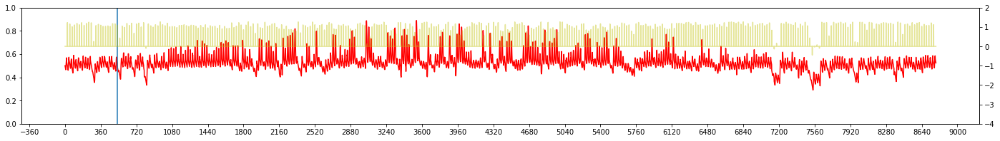

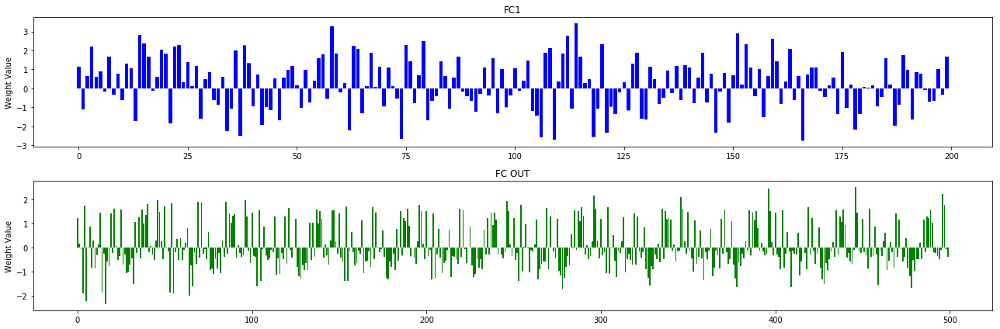

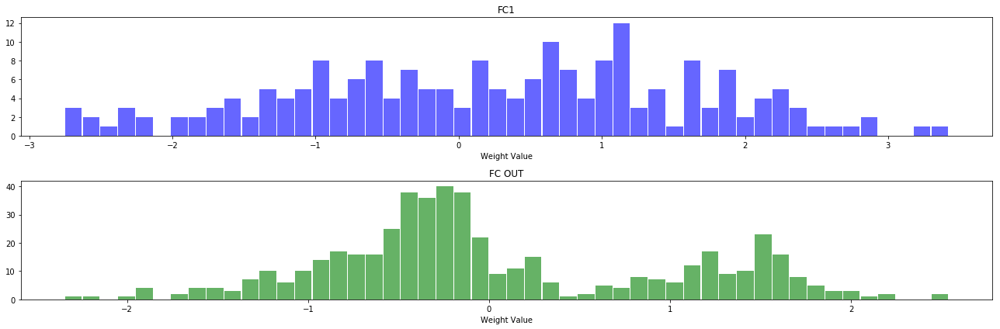


Iteration 69:  TOKYO, 2000 
EPSILON = 9.891e-01
LR = 5.752e-06
Average Terminal Reward  =  0.962
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.375
Action STD DEV           =  3.458


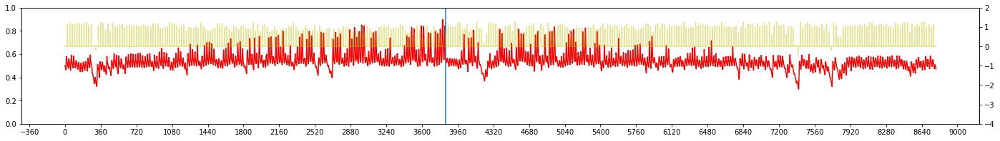

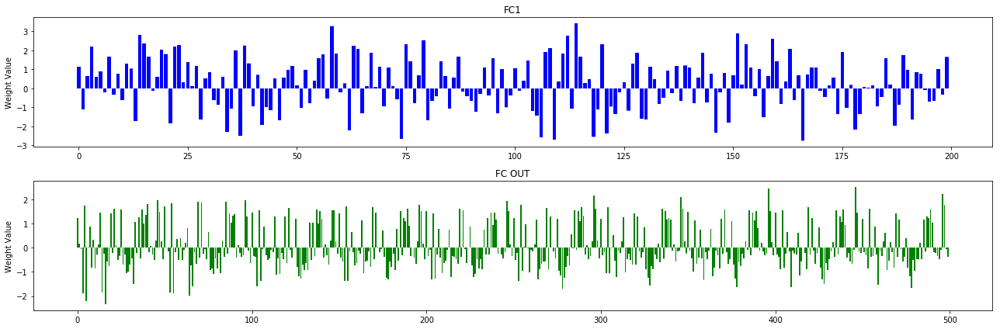

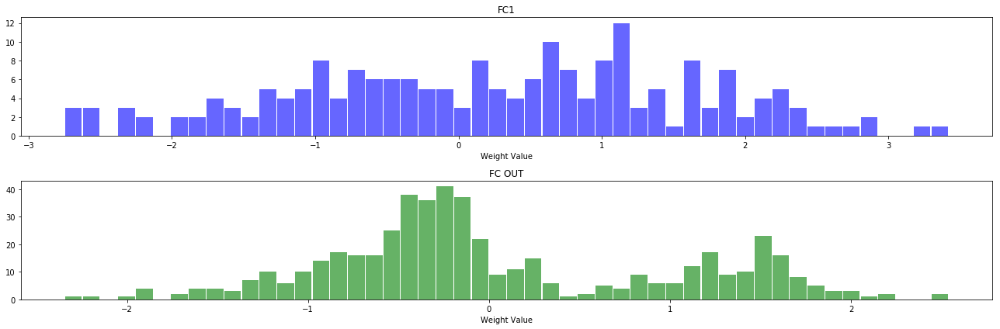


Iteration 70:  TOKYO, 2005 
EPSILON = 9.910e-01
LR = 5.018e-06
Average Terminal Reward  =  0.947
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.414
Action STD DEV           =  3.486


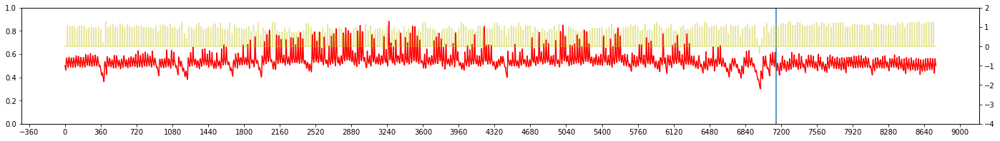

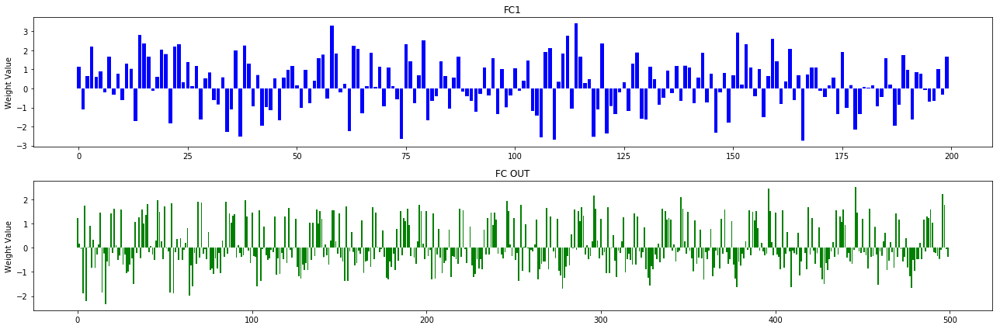

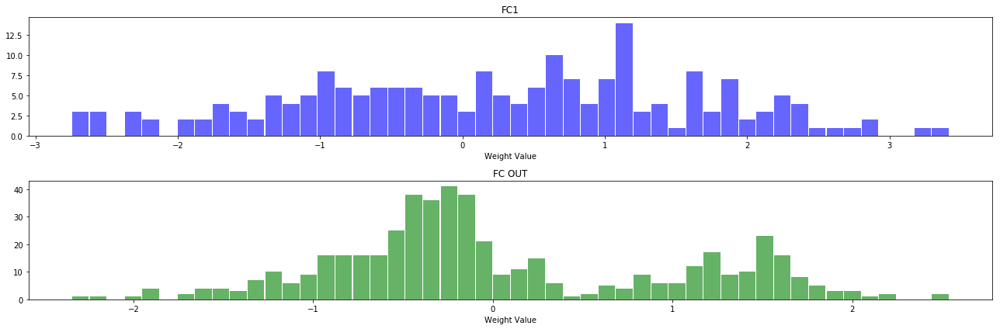


Iteration 71:  TOKYO, 2008 
EPSILON = 9.926e-01
LR = 4.390e-06
Average Terminal Reward  =  0.969
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.359
Action STD DEV           =  3.496


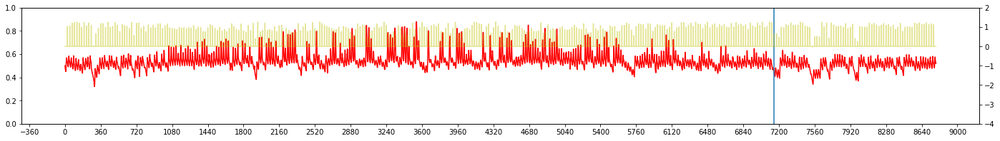

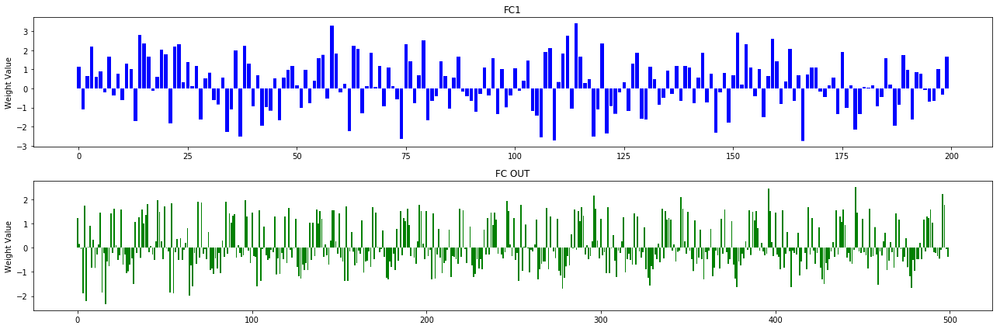

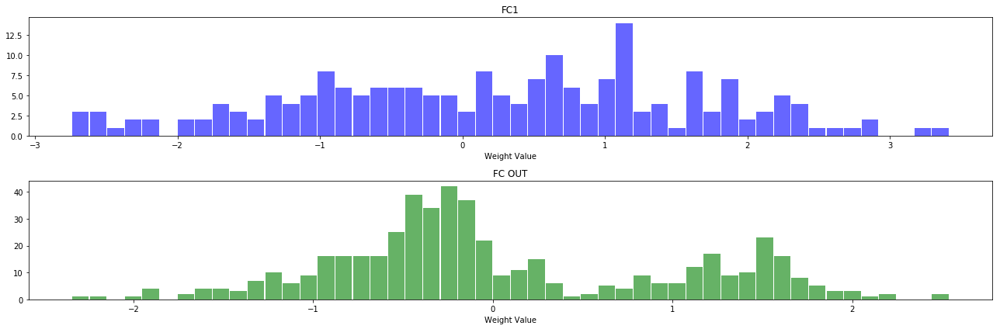


Iteration 72:  TOKYO, 2004 
EPSILON = 9.939e-01
LR = 3.854e-06
Average Terminal Reward  =  0.863
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.593
Action STD DEV           =  3.538


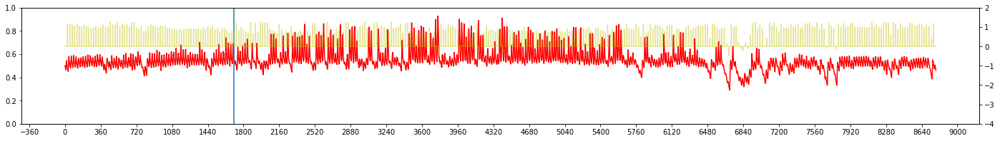

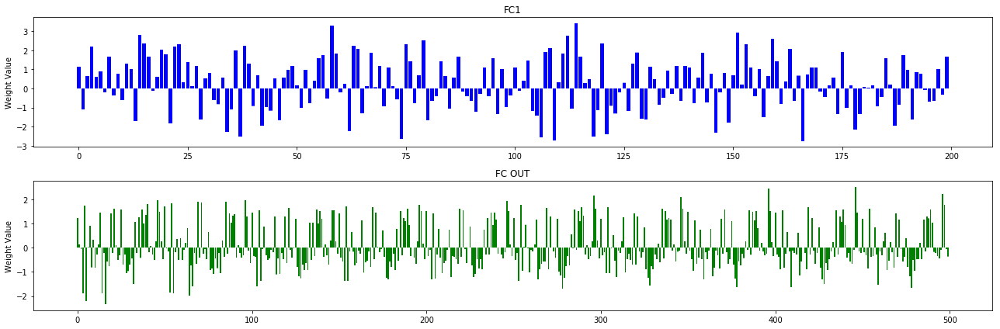

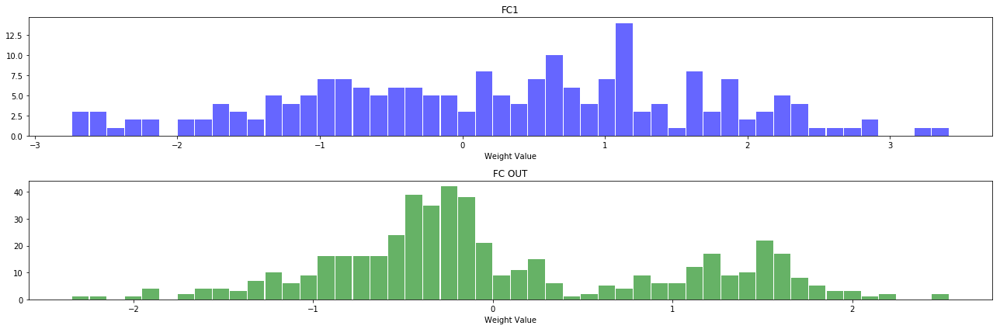


Iteration 73:  TOKYO, 2004 
EPSILON = 9.950e-01
LR = 3.395e-06
Average Terminal Reward  =  0.866
Day Violations           =      1
Battery Limit Violations =      0
Action MEAN              =  3.593
Action STD DEV           =  3.499


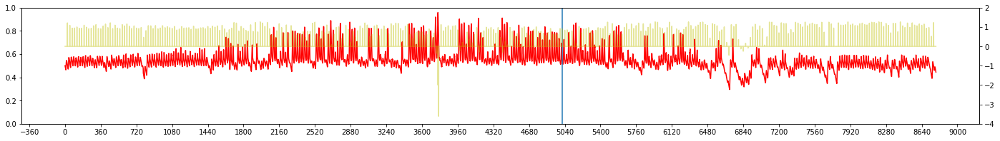

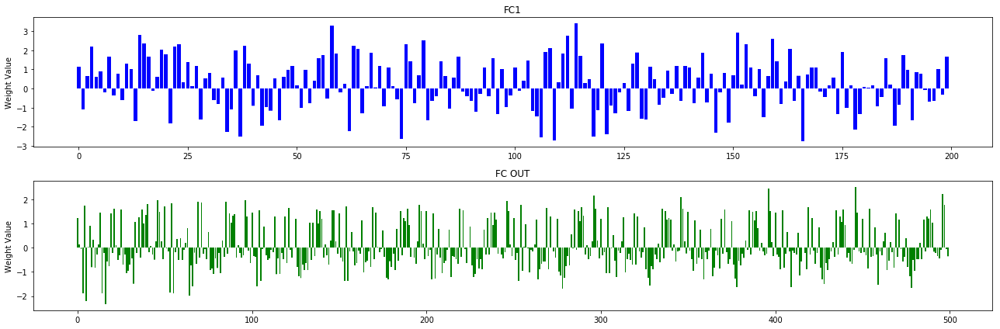

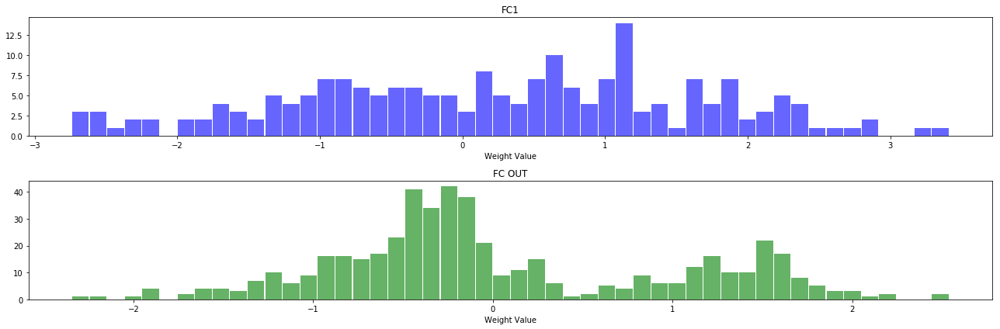


Iteration 74:  TOKYO, 2008 
EPSILON = 9.959e-01
LR = 3.003e-06
Average Terminal Reward  =  0.919
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.359
Action STD DEV           =  3.364


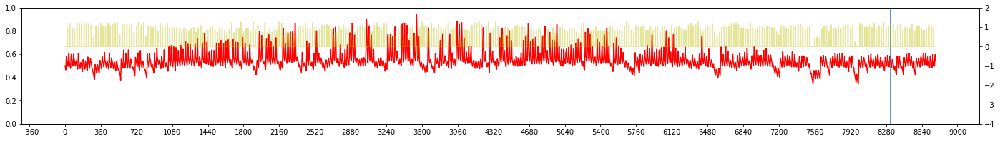

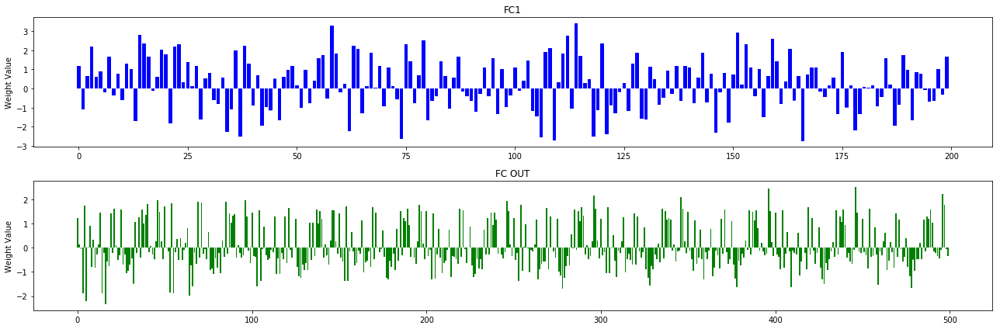

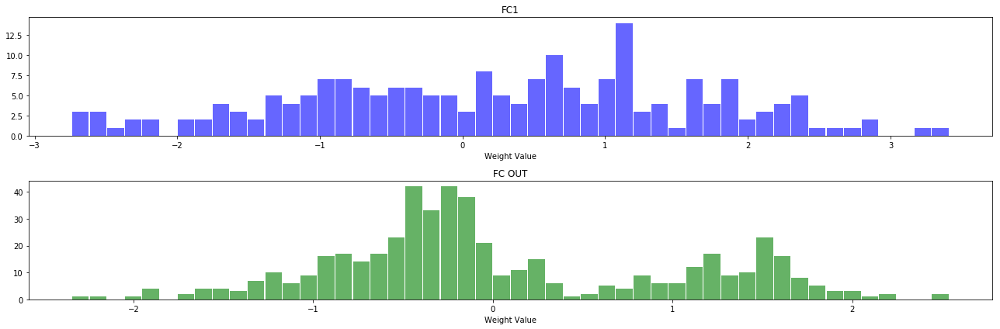


Iteration 75:  TOKYO, 2002 
EPSILON = 9.967e-01
LR = 2.667e-06
Average Terminal Reward  =  0.879
Day Violations           =      1
Battery Limit Violations =      0
Action MEAN              =  3.398
Action STD DEV           =  3.458


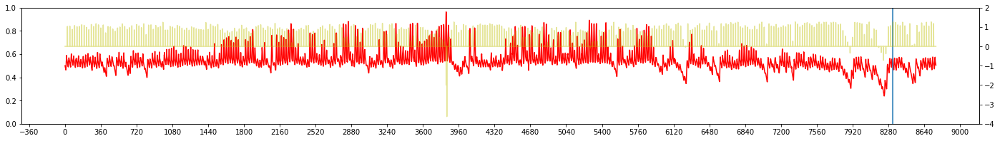

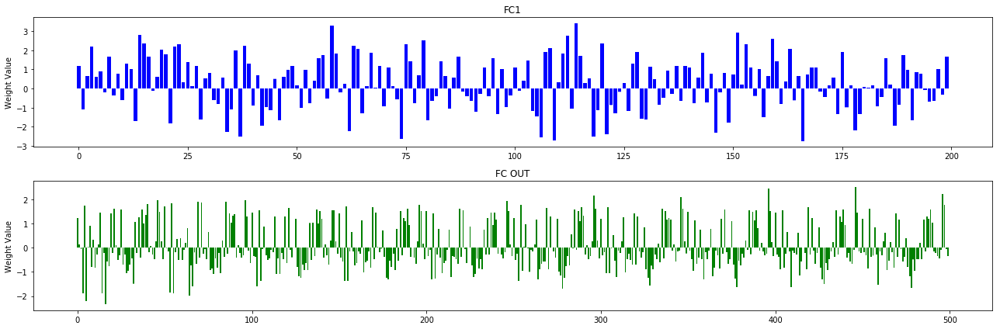

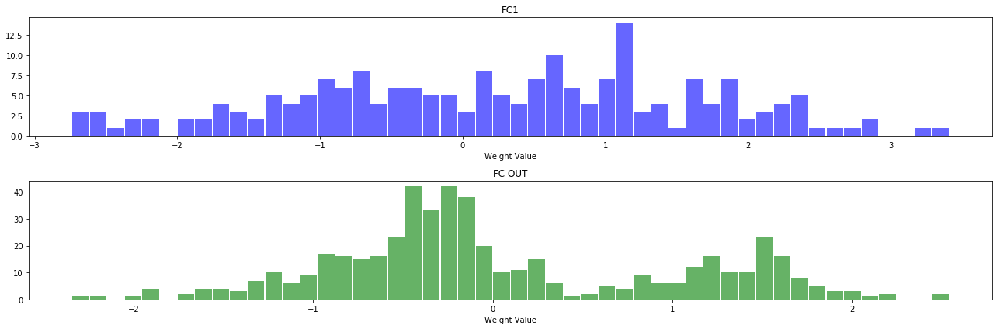


Iteration 76:  TOKYO, 2005 
EPSILON = 9.973e-01
LR = 2.381e-06
Average Terminal Reward  =  0.943
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.414
Action STD DEV           =  3.360


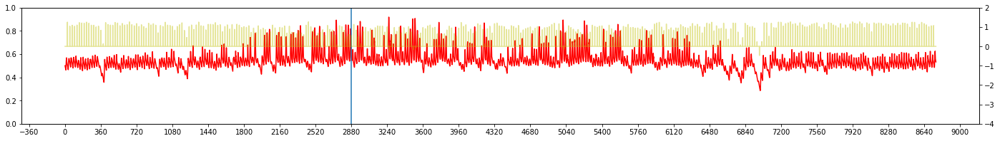

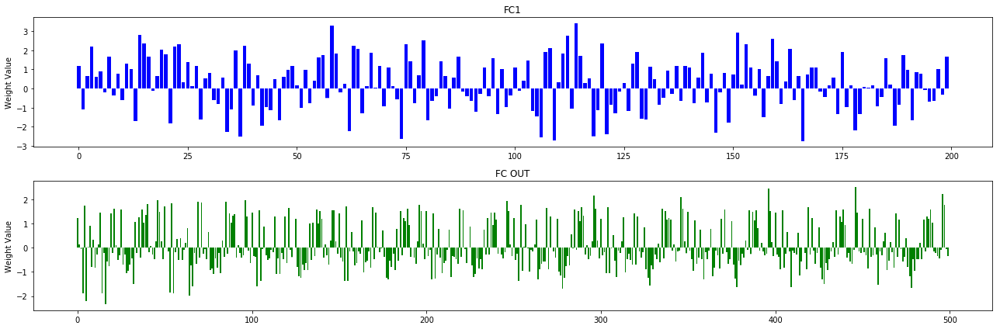

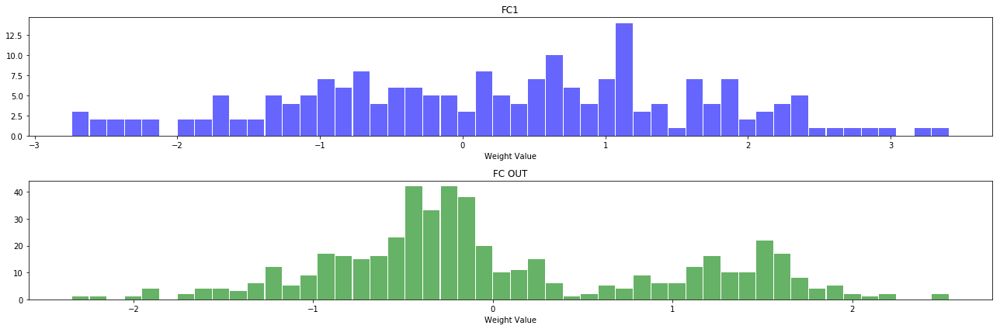


Iteration 77:  TOKYO, 2009 
EPSILON = 9.978e-01
LR = 2.135e-06
Average Terminal Reward  =  0.909
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.317
Action STD DEV           =  3.275


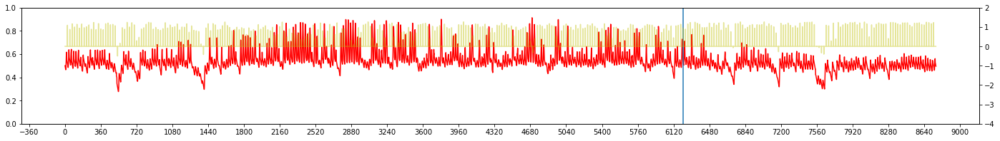

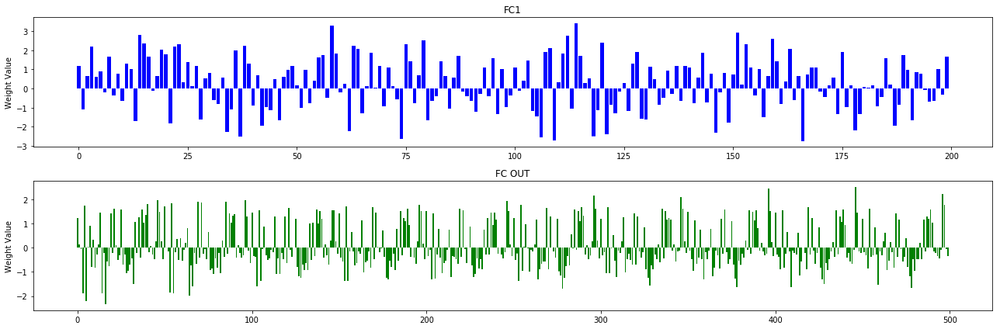

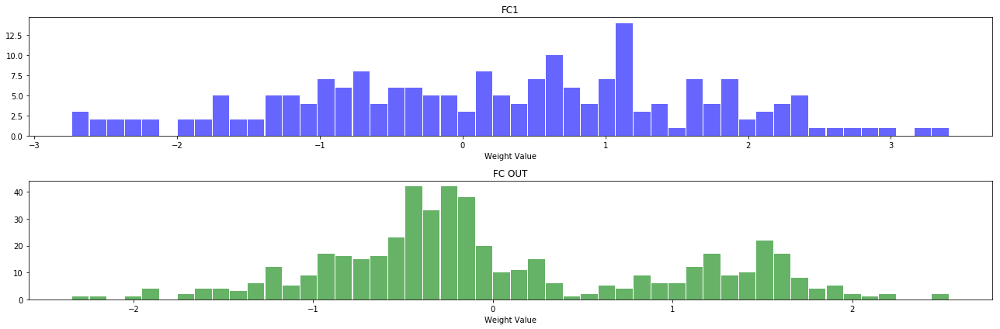


Iteration 78:  TOKYO, 2009 
EPSILON = 9.982e-01
LR = 1.926e-06
Average Terminal Reward  =  0.942
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.317
Action STD DEV           =  3.354


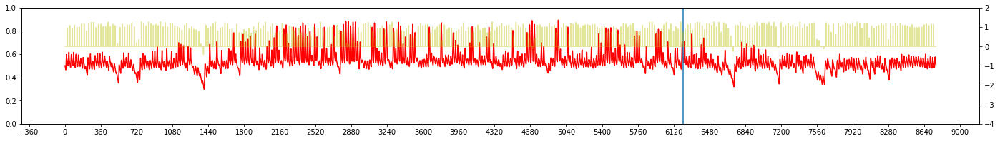

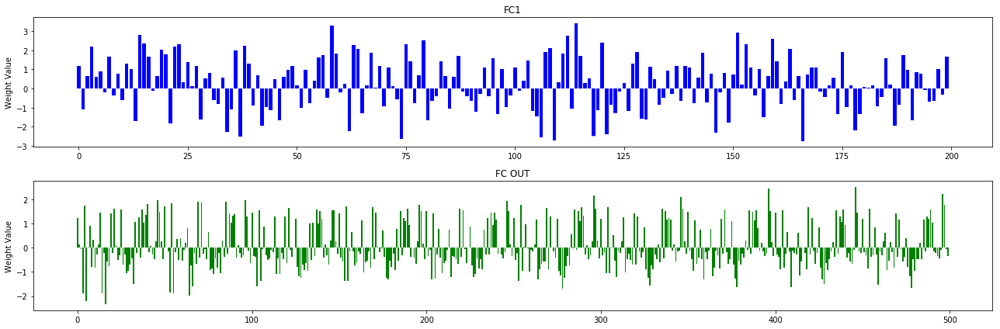

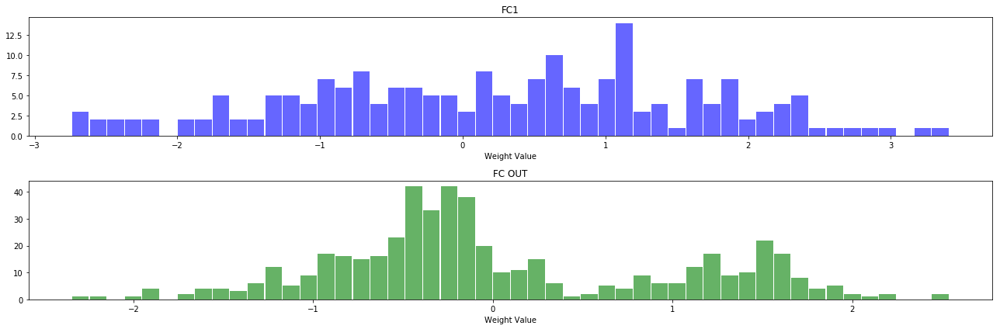


Iteration 79:  TOKYO, 2005 
EPSILON = 9.985e-01
LR = 1.747e-06
Average Terminal Reward  =  0.927
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.414
Action STD DEV           =  3.447


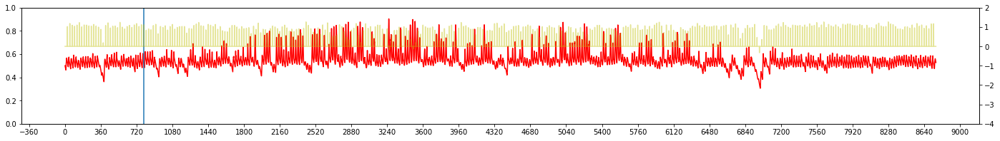

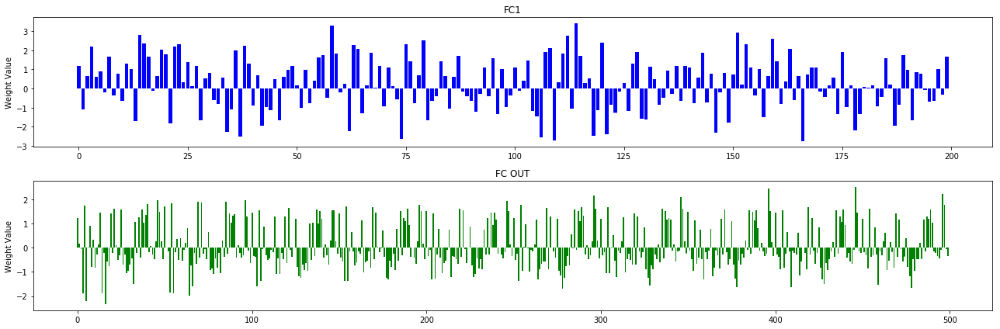

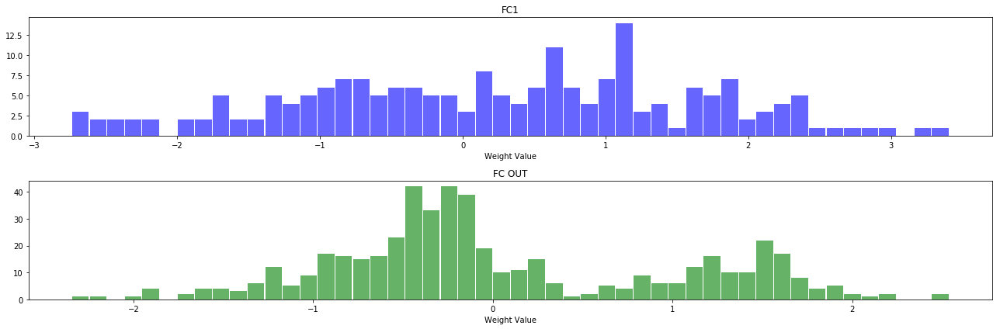


Iteration 80:  TOKYO, 2009 
EPSILON = 9.988e-01
LR = 1.593e-06
Average Terminal Reward  =  0.920
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.317
Action STD DEV           =  3.425


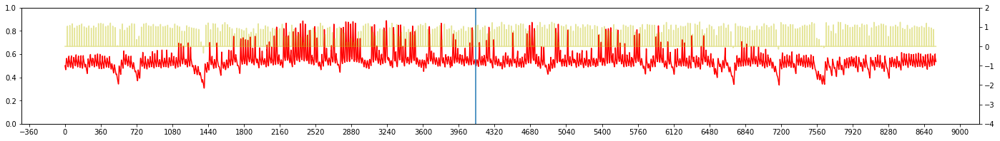

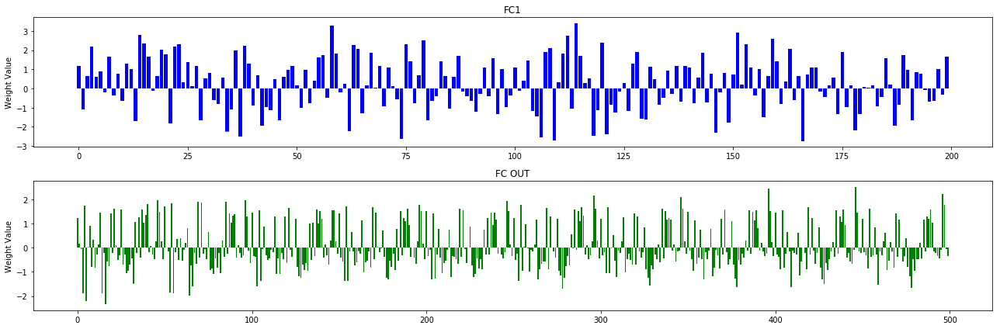

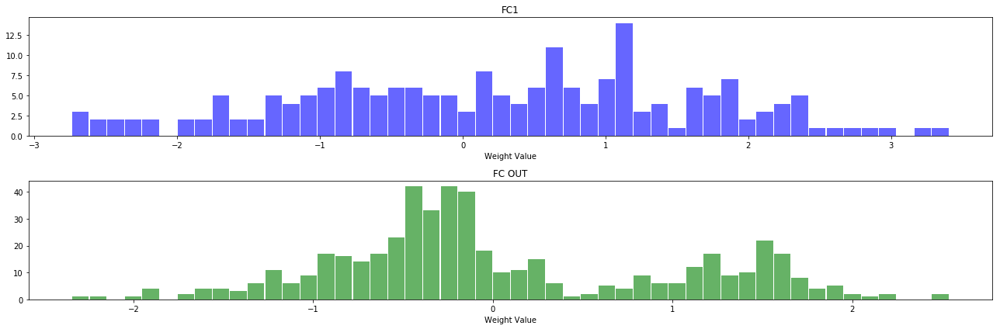


Iteration 81:  TOKYO, 2008 
EPSILON = 9.990e-01
LR = 1.462e-06
Average Terminal Reward  =  0.892
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.359
Action STD DEV           =  3.399


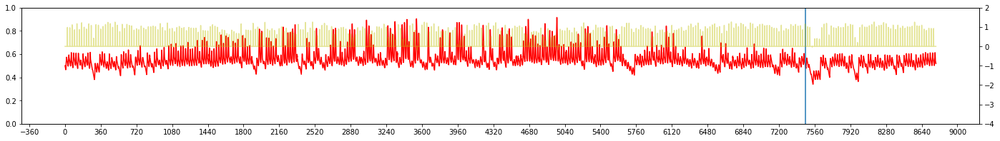

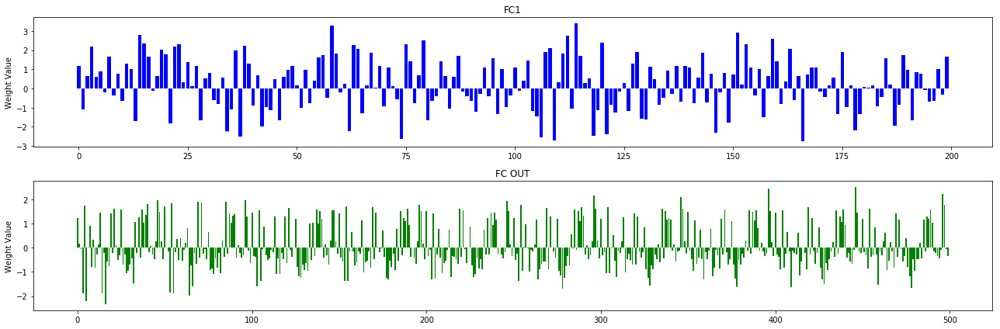

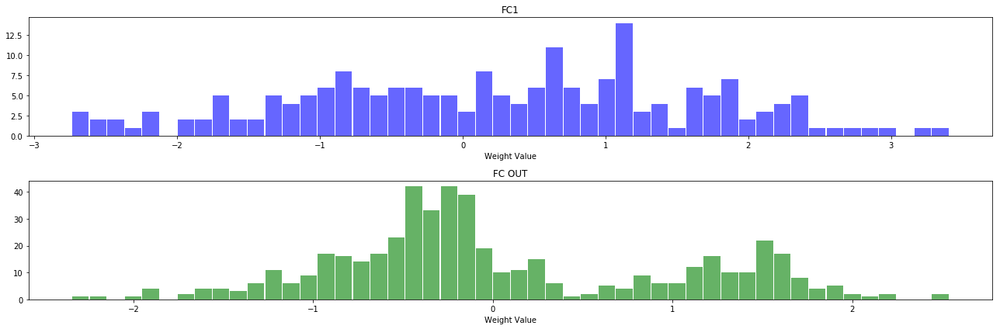


Iteration 82:  TOKYO, 2005 
EPSILON = 9.992e-01
LR = 1.350e-06
Average Terminal Reward  =  0.853
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.414
Action STD DEV           =  3.286


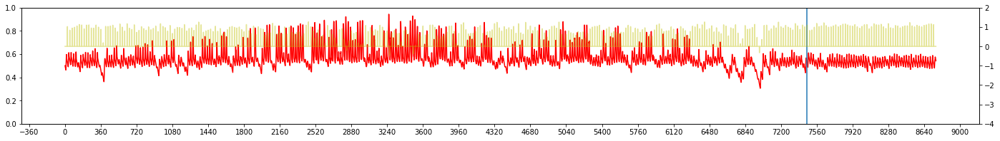

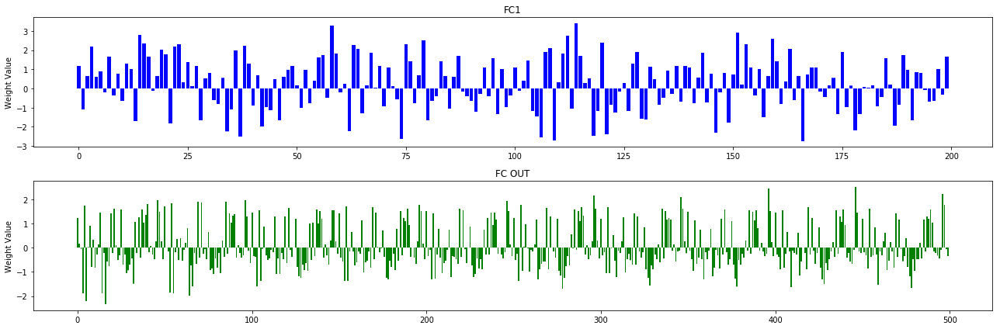

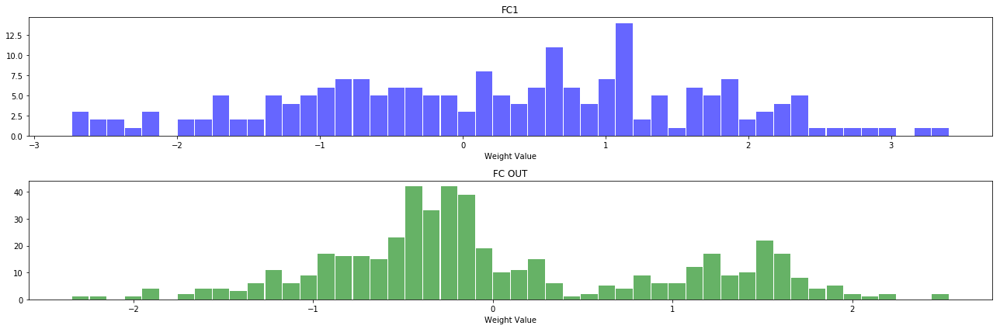


Iteration 83:  TOKYO, 2004 
EPSILON = 9.993e-01
LR = 1.254e-06
Average Terminal Reward  =  0.780
Day Violations           =      2
Battery Limit Violations =      0
Action MEAN              =  3.593
Action STD DEV           =  3.478


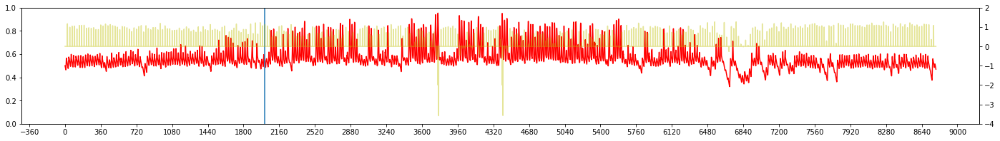

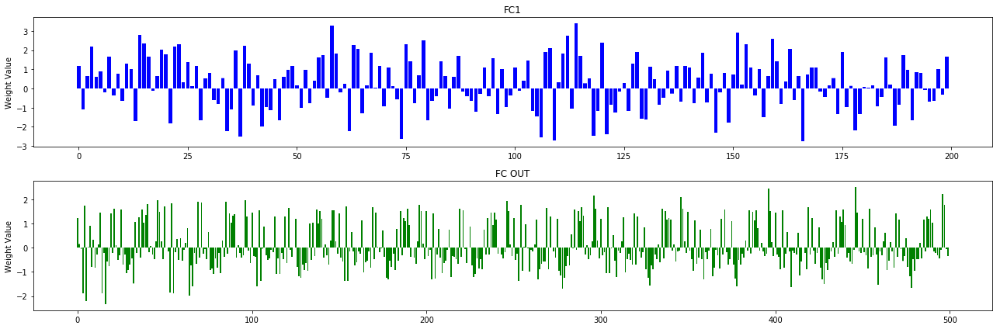

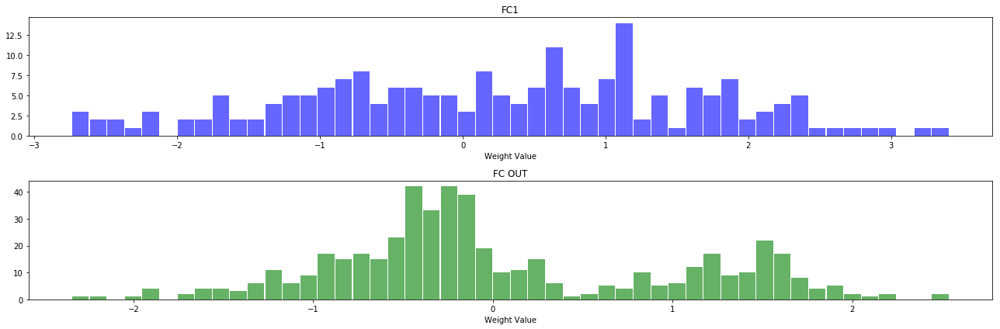


Iteration 84:  TOKYO, 2003 
EPSILON = 9.994e-01
LR = 1.173e-06
Average Terminal Reward  =  0.852
Day Violations           =      0
Battery Limit Violations =      0
Action MEAN              =  3.156
Action STD DEV           =  3.289


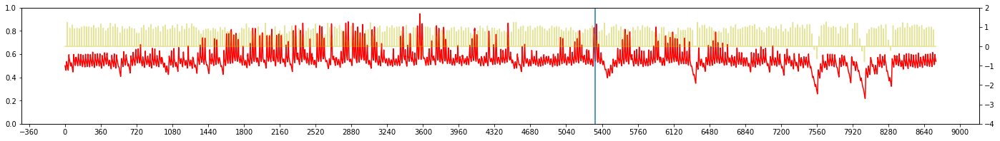

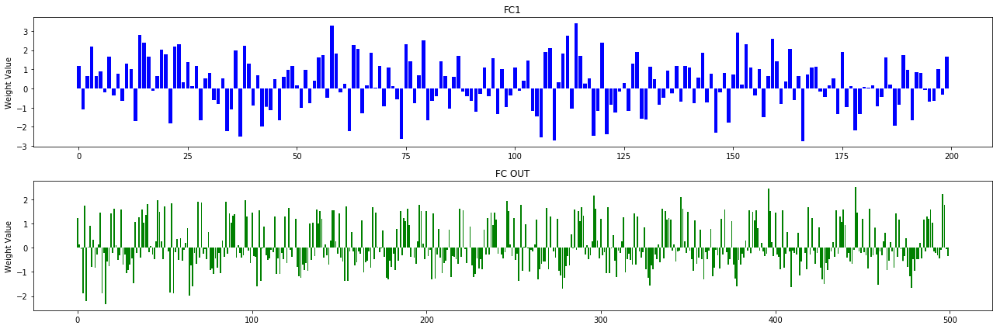

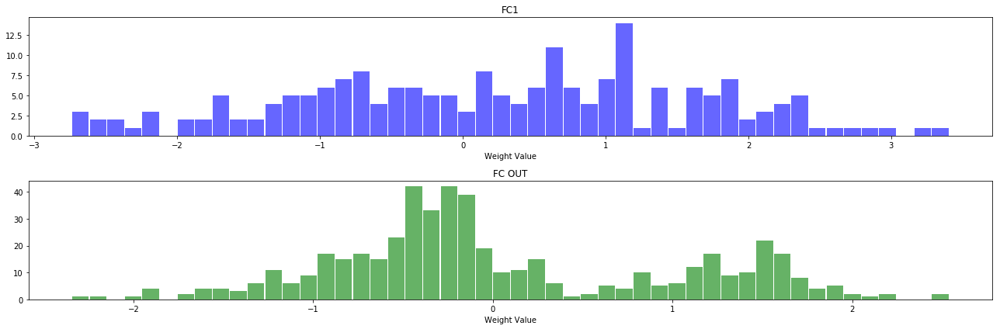


Iteration 85:  TOKYO, 2007 
EPSILON = 9.995e-01
LR = 1.103e-06
Average Terminal Reward  =  0.797
Day Violations           =      2
Battery Limit Violations =      0
Action MEAN              =  3.480
Action STD DEV           =  3.448


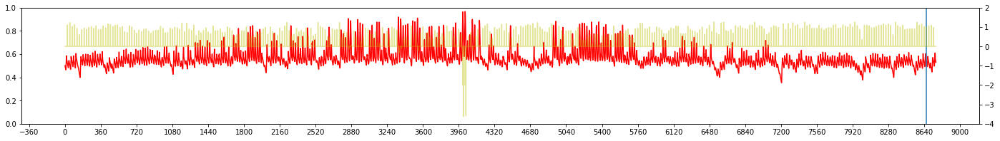

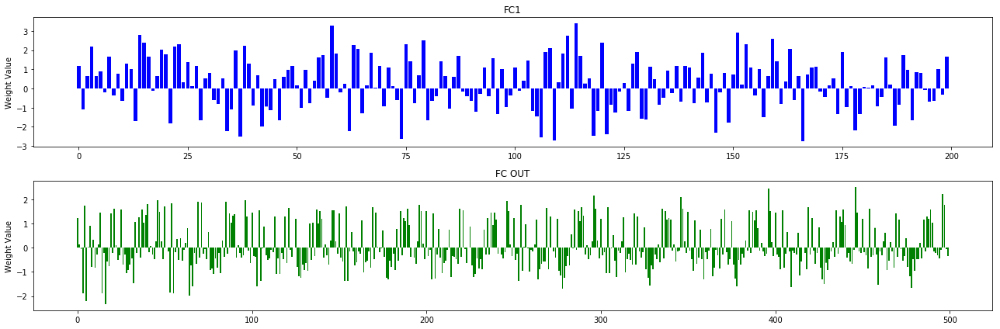

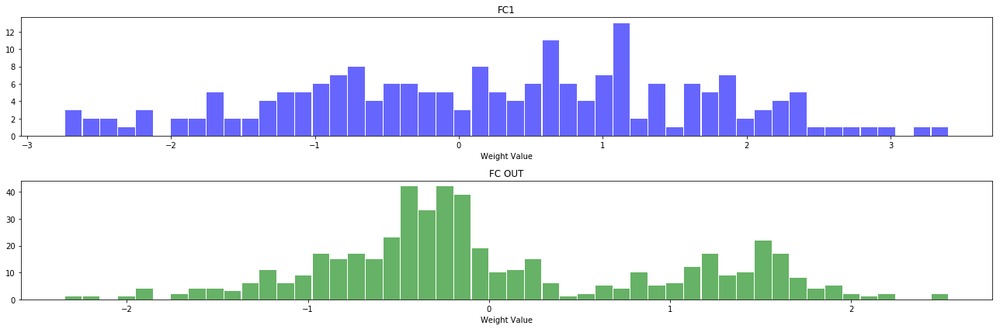


Iteration 86:  TOKYO, 2007 
EPSILON = 9.996e-01
LR = 1.043e-06
Average Terminal Reward  =  0.754
Day Violations           =      2
Battery Limit Violations =      0
Action MEAN              =  3.479
Action STD DEV           =  3.466


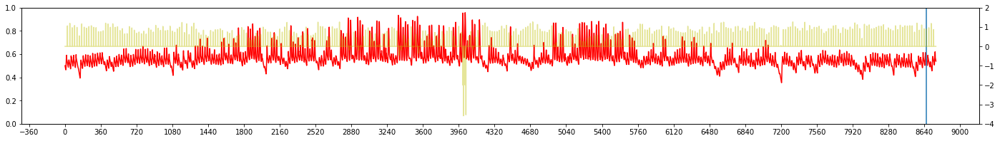

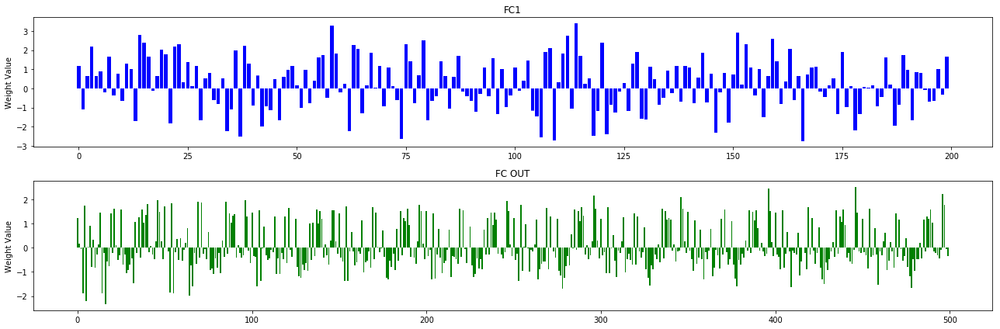

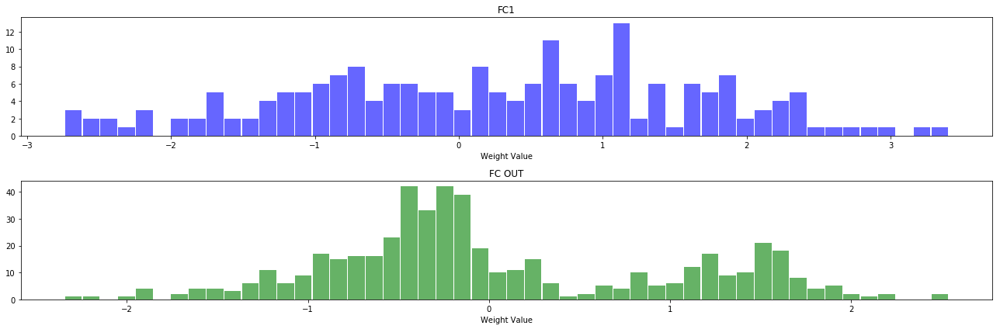


Iteration 87:  TOKYO, 2007 
EPSILON = 9.997e-01
LR = 9.915e-07
Average Terminal Reward  =  0.752
Day Violations           =      2
Battery Limit Violations =      0
Action MEAN              =  3.479
Action STD DEV           =  3.461


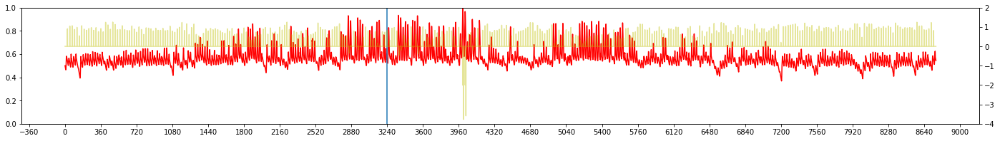

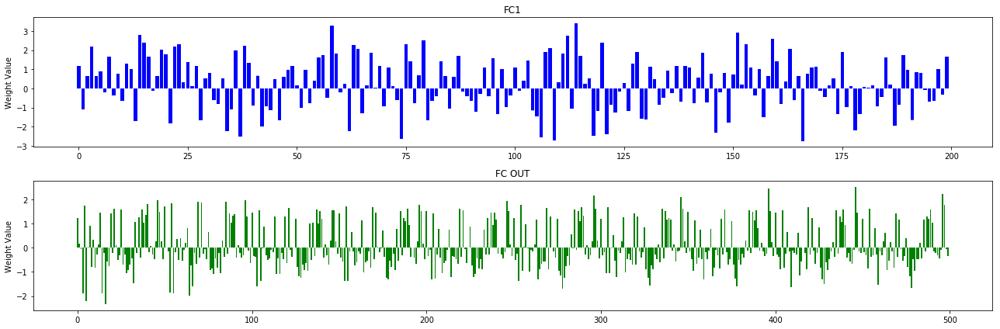

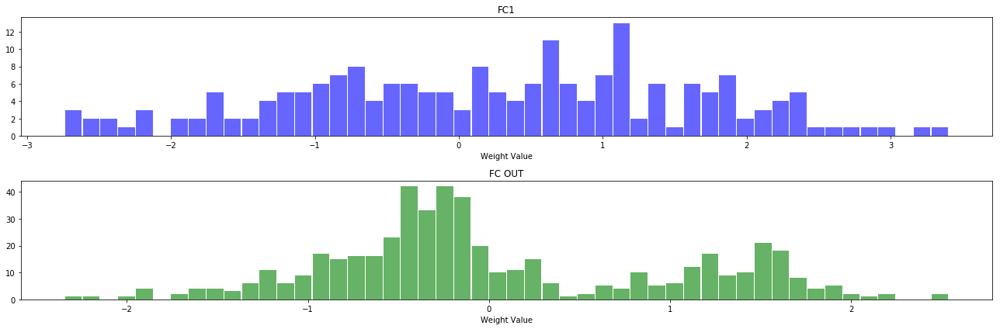


Iteration 88:  TOKYO, 2004 
EPSILON = 9.997e-01
LR = 9.477e-07
Average Terminal Reward  =  0.679
Day Violations           =      2
Battery Limit Violations =      0
Action MEAN              =  3.592
Action STD DEV           =  3.402


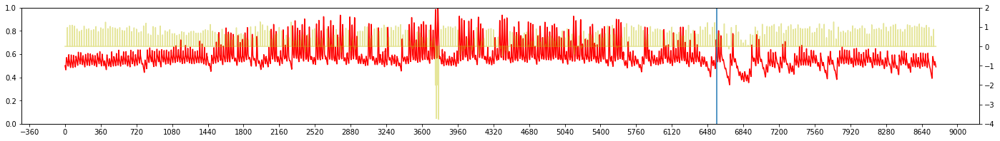

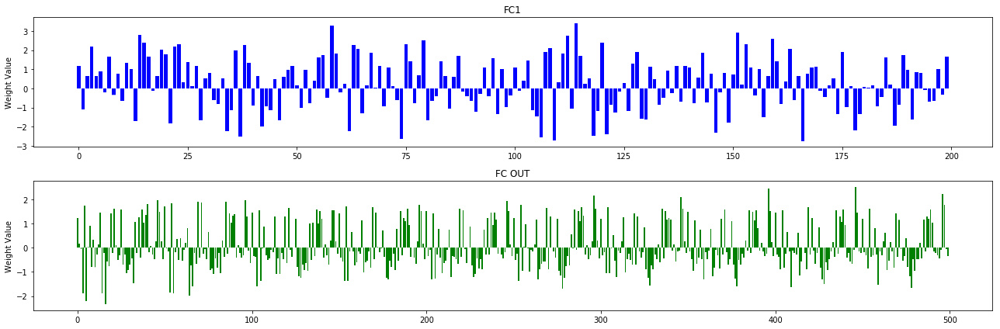

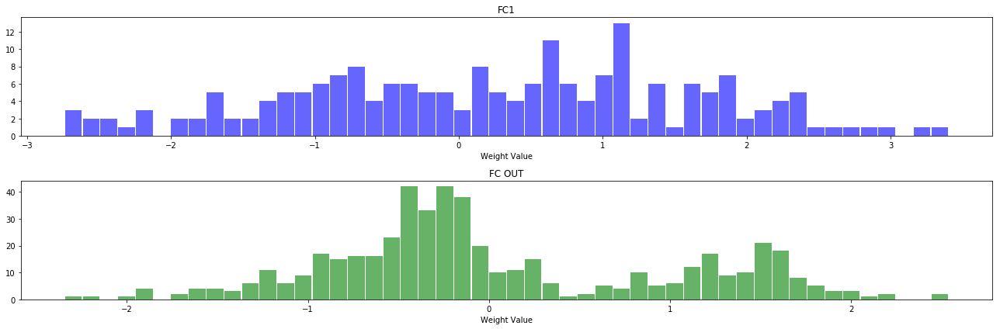


Iteration 89:  TOKYO, 2002 
EPSILON = 9.998e-01
LR = 9.103e-07
Average Terminal Reward  =  0.578
Day Violations           =      7
Battery Limit Violations =      3
Action MEAN              =  3.397
Action STD DEV           =  3.121


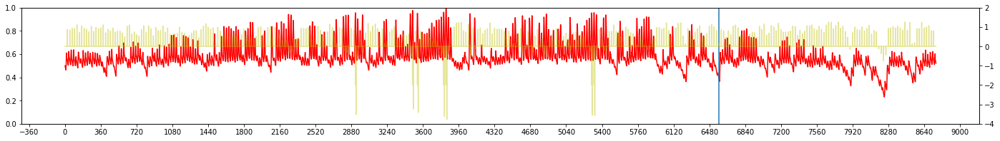

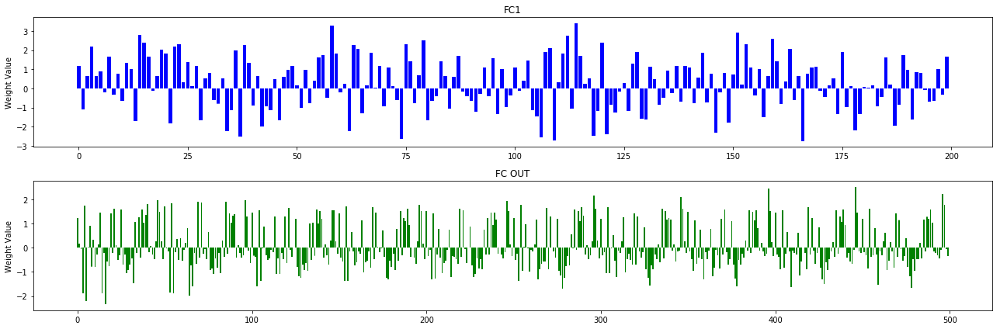

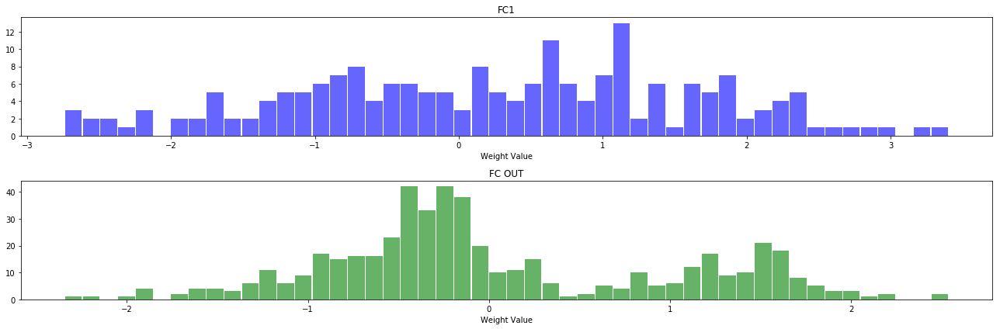


Iteration 90:  TOKYO, 2001 
EPSILON = 9.998e-01
LR = 8.783e-07
Average Terminal Reward  =  0.631
Day Violations           =      6
Battery Limit Violations =      1
Action MEAN              =  3.393
Action STD DEV           =  3.110


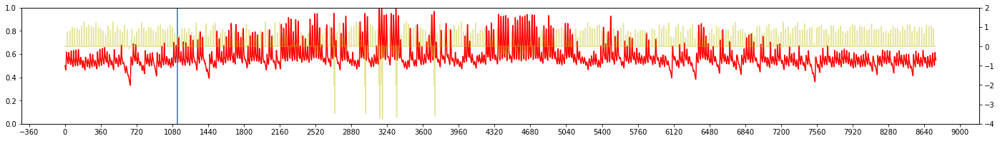

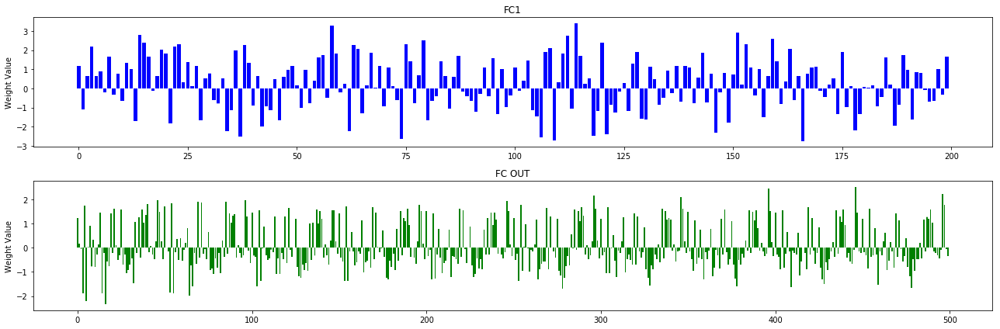

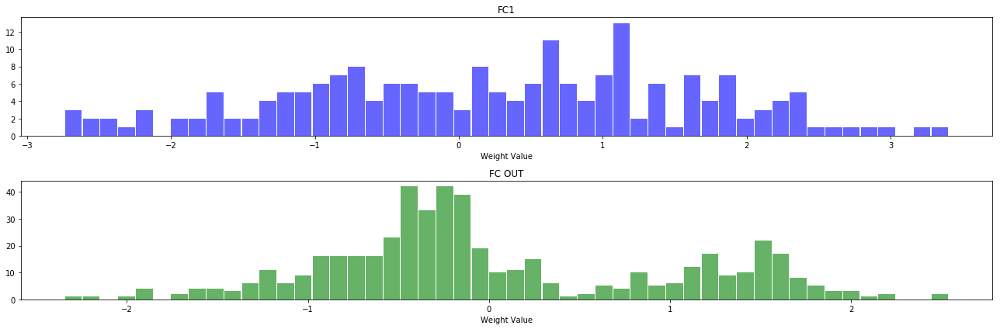


Iteration 91:  TOKYO, 2002 
EPSILON = 9.999e-01
LR = 8.509e-07
Average Terminal Reward  =  0.569
Day Violations           =      9
Battery Limit Violations =      2
Action MEAN              =  3.397
Action STD DEV           =  3.164


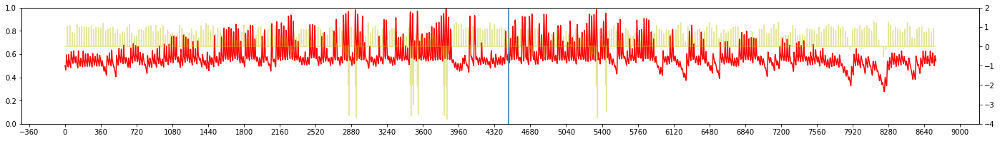

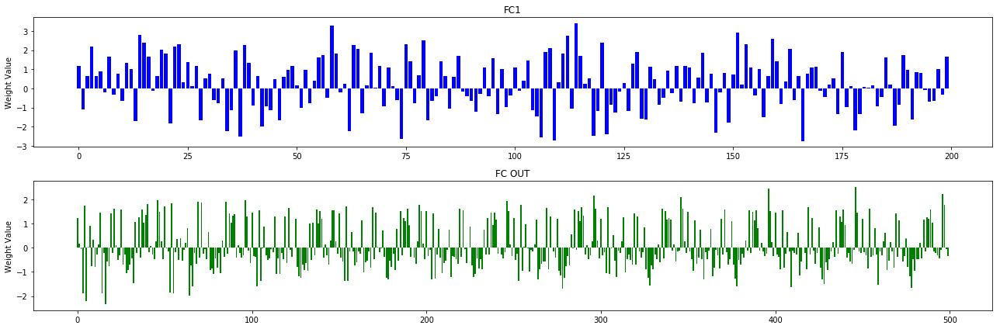

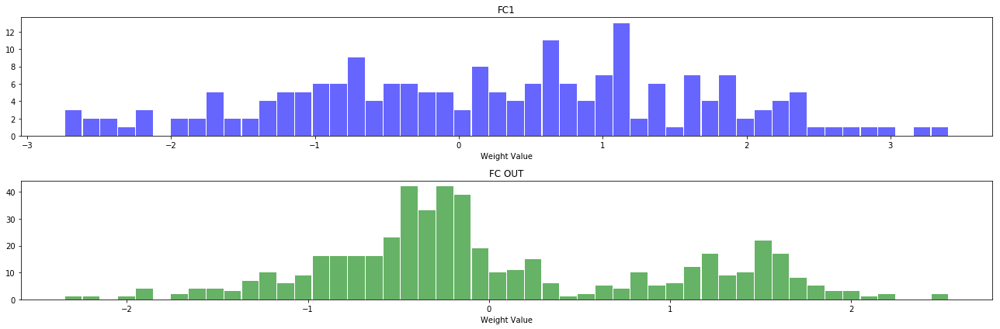


Iteration 92:  TOKYO, 2001 
EPSILON = 9.999e-01
LR = 8.276e-07
Average Terminal Reward  =  0.580
Day Violations           =     10
Battery Limit Violations =      0
Action MEAN              =  3.393
Action STD DEV           =  3.143


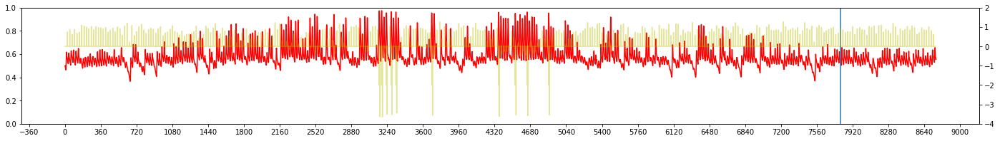

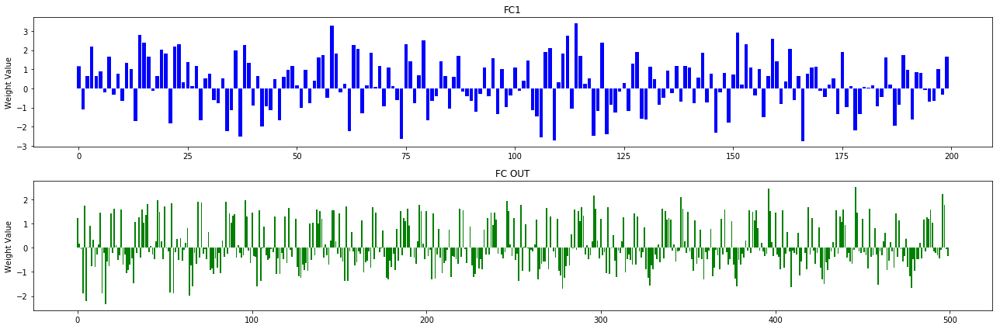

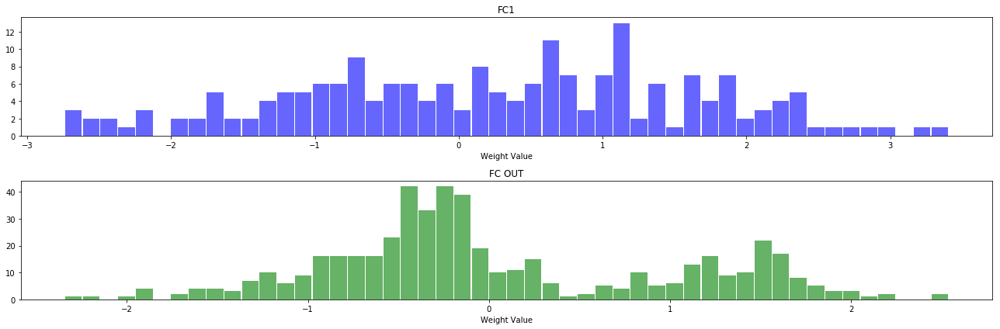


Iteration 93:  TOKYO, 2007 
EPSILON = 9.999e-01
LR = 8.076e-07
Average Terminal Reward  =  0.407
Day Violations           =     17
Battery Limit Violations =      8
Action MEAN              =  3.476
Action STD DEV           =  3.088


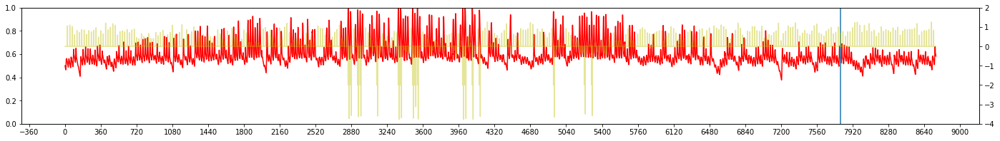

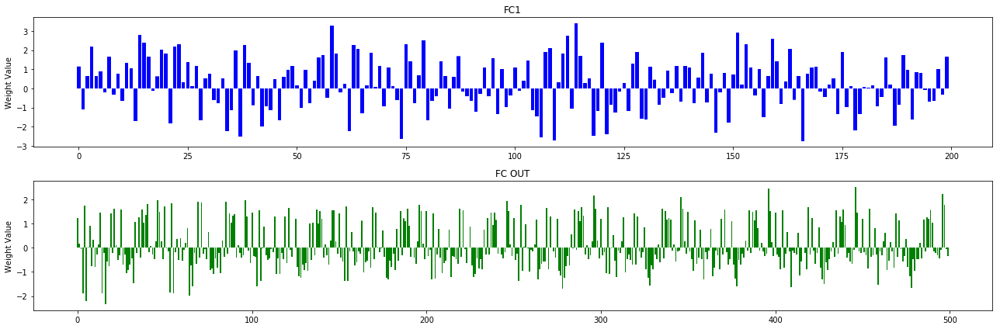

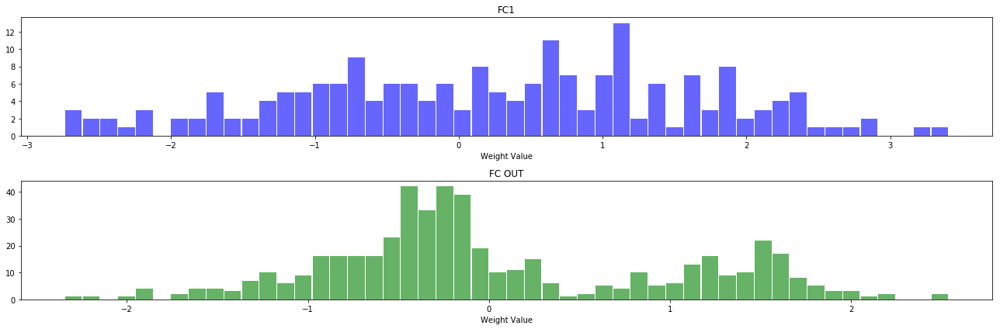


Iteration 94:  TOKYO, 2001 
EPSILON = 9.999e-01
LR = 7.905e-07
Average Terminal Reward  =  0.440
Day Violations           =     15
Battery Limit Violations =      0
Action MEAN              =  3.393
Action STD DEV           =  3.106


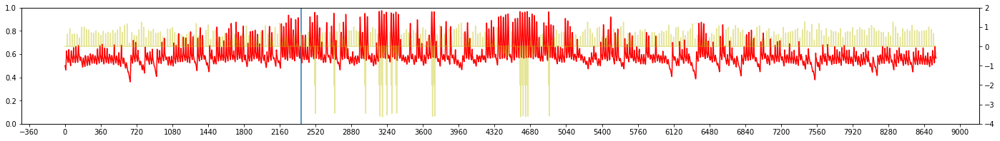

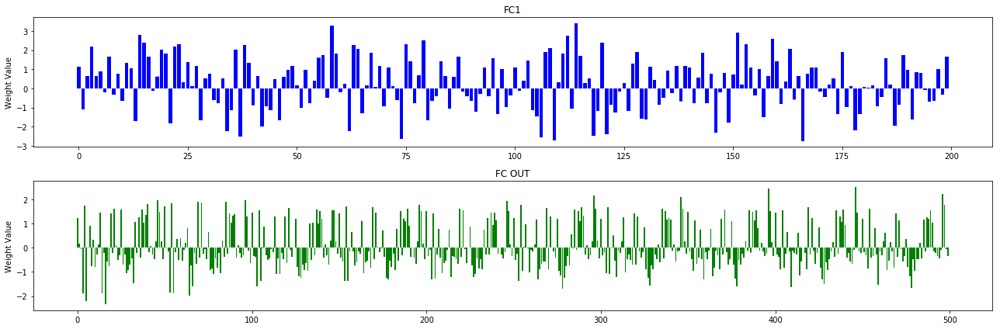

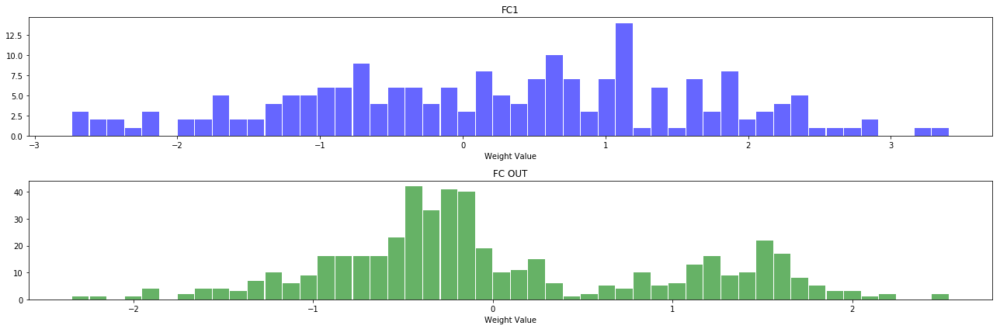


Iteration 95:  TOKYO, 2002 
EPSILON = 9.999e-01
LR = 7.758e-07
Average Terminal Reward  =  0.540
Day Violations           =      5
Battery Limit Violations =      3
Action MEAN              =  3.396
Action STD DEV           =  3.128


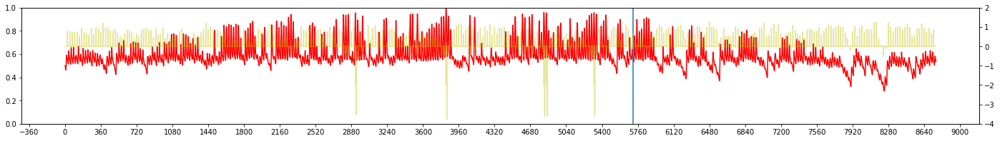

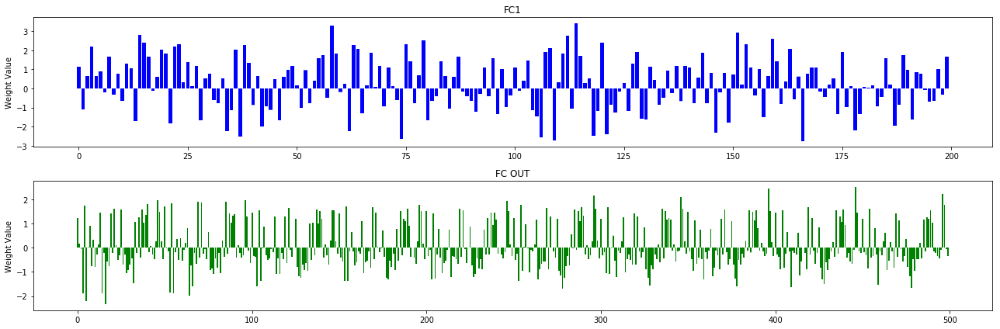

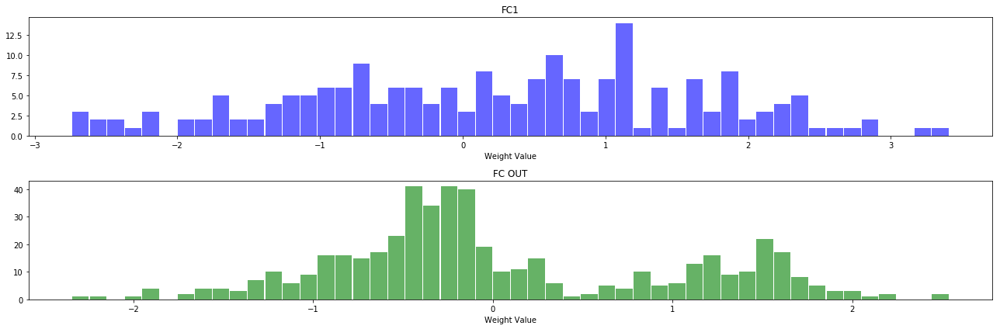


Iteration 96:  TOKYO, 2003 
EPSILON = 9.999e-01
LR = 7.633e-07
Average Terminal Reward  =  0.650
Day Violations           =      2
Battery Limit Violations =      1
Action MEAN              =  3.156
Action STD DEV           =  3.073


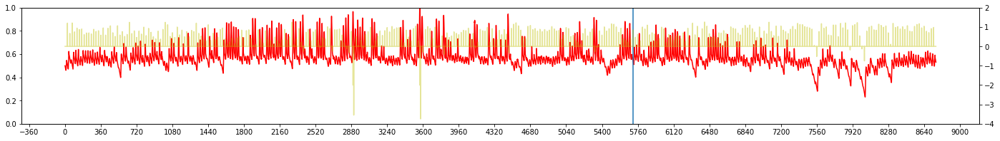

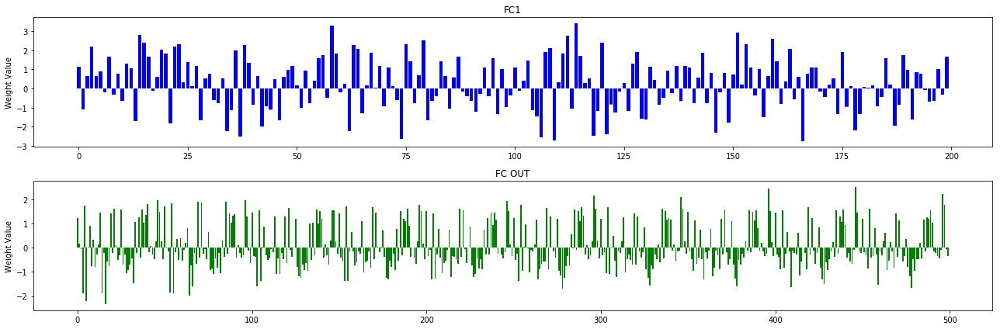

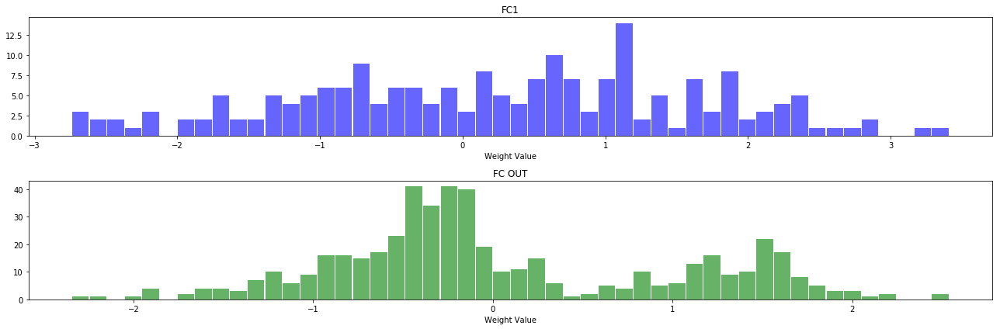


Iteration 97:  TOKYO, 2008 
EPSILON = 1.000e+00
LR = 7.527e-07
Average Terminal Reward  =  0.721
Day Violations           =      4
Battery Limit Violations =      0
Action MEAN              =  3.359
Action STD DEV           =  3.205


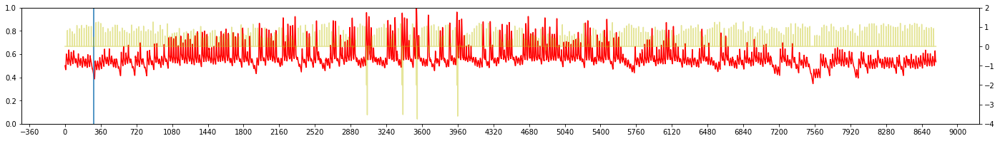

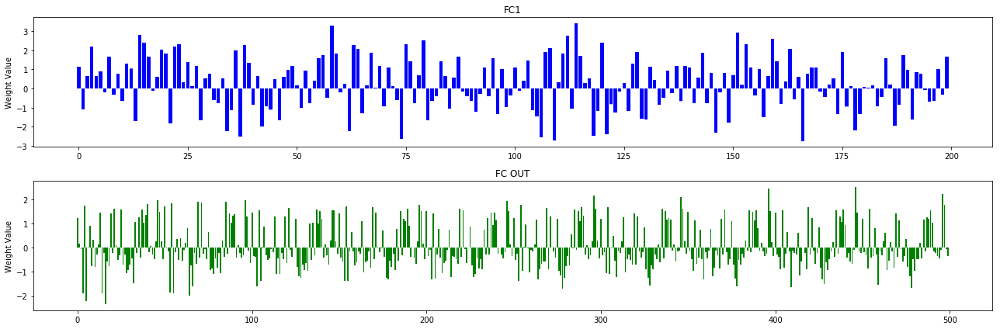

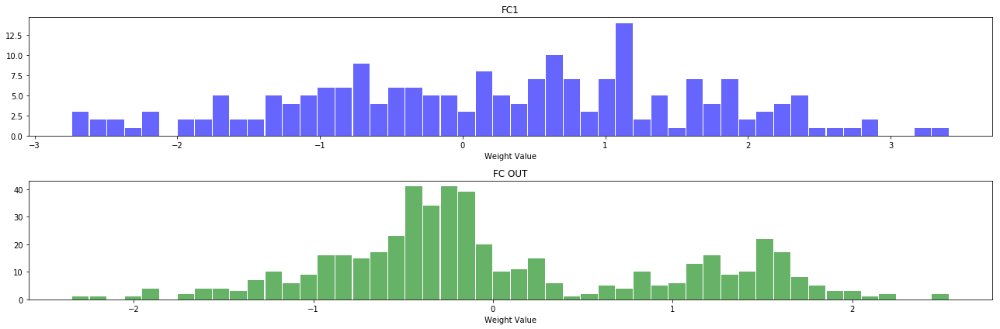


Iteration 98:  TOKYO, 2001 
EPSILON = 1.000e+00
LR = 7.435e-07
Average Terminal Reward  =  0.760
Day Violations           =      2
Battery Limit Violations =      0
Action MEAN              =  3.394
Action STD DEV           =  3.240


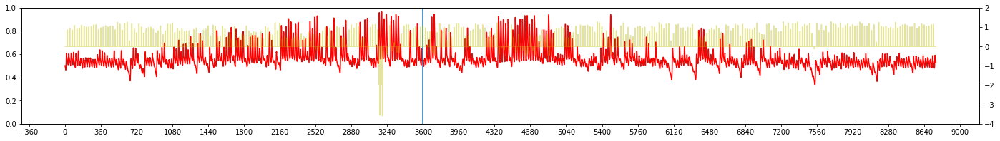

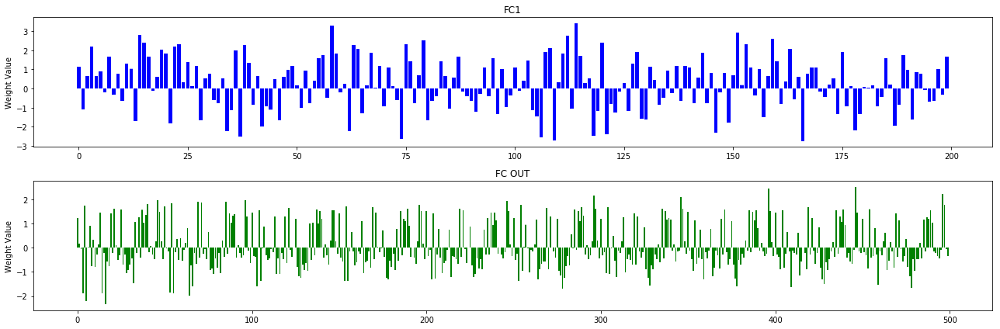

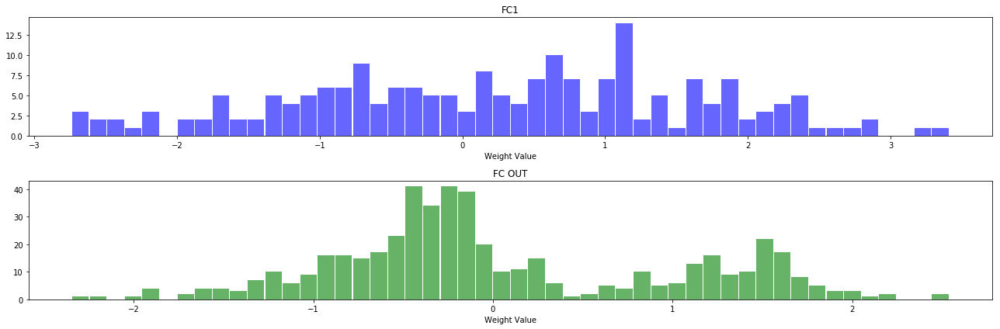


Iteration 99:  TOKYO, 2001 
EPSILON = 1.000e+00
LR = 7.357e-07
Average Terminal Reward  =  0.751
Day Violations           =      2
Battery Limit Violations =      0
Action MEAN              =  3.394
Action STD DEV           =  3.227


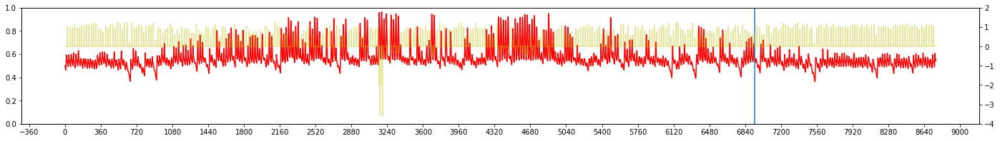

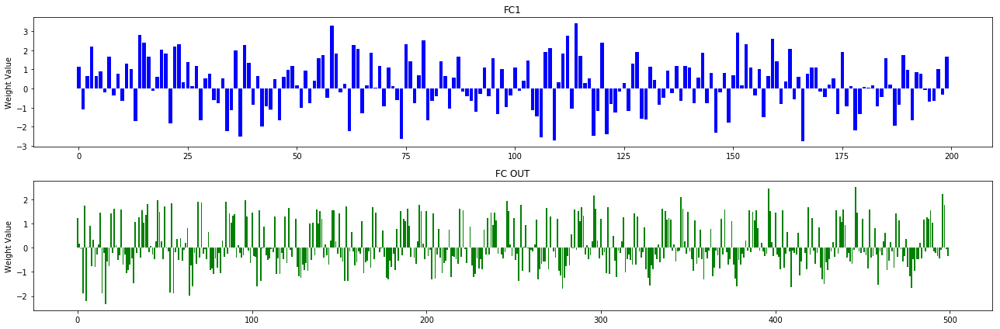

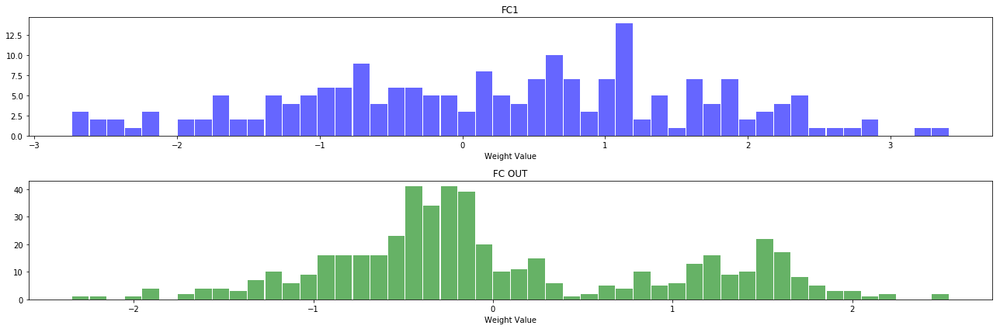

In [18]:
#TRAIN 
dqn = DQN()
# for recording weights
oldfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
old2fc1 = oldfc1

# oldfc2 = dqn.eval_net.fc2.weight.data.cpu().numpy().flatten()
# old2fc2 = oldfc2

# oldfc3 = dqn.eval_net.fc3.weight.data.cpu().numpy().flatten()
# old2fc3 = oldfc3

oldout = dqn.eval_net.fc_out.weight.data.cpu().numpy().flatten()
old2out = oldout
########################################

change_hr = 0 #when dqn target_net is updated by eval_net
avg_reward_rec = [] #record the yearly average rewards over the entire duration of training
batt_violation_rec = []
day_violation_rec = []

print('Device: ', dqn.device)
#TRAINING STARTS
tic = datetime.now()

e_rec = []
lr_rec = []
for iteration in range(NO_OF_ITERATIONS):
    # EPSILON SCHEDULING
    e_slope = 5
    e_start = 0.5
    e_inflection_point = 50
    EPSILON = e_start + (1-e_start)/(1 + np.exp(-(iteration-e_inflection_point)/e_slope))
    e_rec= np.append(e_rec,EPSILON)
    
    # LR SCEHDULING
    lr_slope = 3
    lr_start = 0
    lr_inflection_point = 2
    if iteration <=50:
        lrate =  (lr_start + (1-lr_start)/(1 + np.exp(-(iteration-lr_inflection_point)/lr_slope)))*1e-4
    else:
        lrate = 0.95*(lrate-lrate*0.1)+0.01*1e-5
    dqn.optimizer = torch.optim.Adam(dqn.eval_net.parameters(), lr=lrate)
    lr_rec= np.append(lr_rec,lrate)
#     dqn.optimizer = torch.optim.Adam(dqn.eval_net.parameters(), lr=lrate, weight_decay=WT_DECAY)

    LOCATION    = 'tokyo'#random.choice(['tokyo','wakkanai','minamidaito'])
    YEAR        = random.choice(np.arange(2000,2010))
    
    capm        = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
    capm.eno    = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
    capm.HMAX   = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object


    s, r, day_end, year_end = capm.reset()
    yr_record      = np.empty(4)
    transition_rec = np.zeros((capm.eno.TIME_STEPS, N_STATES * 2 + 2)) #record all the transition in one day

    while True:
        a = dqn.choose_action(stdize(s))
        yr_record = np.vstack((yr_record, [s[0],s[2],r, a]))

        # take action
        s_, r, day_end, year_end = capm.step(a)
        
        temp_transitions                = np.hstack((stdize(s), [a, r], stdize(s_)))
        transition_rec[capm.eno.hr-1,:] = temp_transitions

        if (day_end):
            transition_rec[:,5] += r #broadcast reward to all states
            decay_factor         = [i for i in (LAMBDA**n for n in reversed(range(0, capm.eno.TIME_STEPS)))]
            transition_rec[:,5]  = transition_rec[:,5] * decay_factor #decay reward proportionately
            dqn.store_day_transition(transition_rec)

        if dqn.memory_counter > MEMORY_CAPACITY:
            dqn.learn()

        if dqn.nettoggle:
            change_hr = capm.eno.day*24+capm.eno.hr #to mark when the DQN is updated.
            dqn.nettoggle = not dqn.nettoggle

        if (year_end):
            break

        # transition to new state
        s = s_

    yr_record = np.delete(yr_record, 0, 0)     #remove the first row which is garbage
    hourly_yr_reward_rec = yr_record[:,2]      #extract reward information from the record array
    yr_reward_rec = hourly_yr_reward_rec[::24] #only consider terminal rewards

    print('\nIteration {}:  {}, {} '.format(iteration, LOCATION.upper(), YEAR))
    print('EPSILON = {:6.3e}'.format(EPSILON))
    for param_group in dqn.optimizer.param_groups:
        print('LR = {:6.3e}'.format(param_group['lr']))
    print("Average Terminal Reward  = {:6.3f}".format(np.mean(yr_reward_rec)))
    print("Day Violations           = {:6d}".format(capm.violation_counter))
    print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
    print("Action MEAN              = {:6.3f}".format(np.mean(yr_record[:,-1] + 1)))
    print("Action STD DEV           = {:6.3f}".format(np.std(yr_record[:,-1] + 1)))
   
    # Log the average reward in avg_reward_rec to plot later in the learning curve graph figure
    avg_reward_rec      = np.append(avg_reward_rec, np.mean(yr_reward_rec))
    day_violation_rec   = np.append(day_violation_rec, capm.violation_counter)
    batt_violation_rec  = np.append(batt_violation_rec, capm.batt_violations)

###########################################################################################
###########################################################################################
#   PLOT battery levels, hourly rewards and the weights
    
    #PLOT BATTERY AND REWARD
    fig = plt.figure(figsize=(24,3))
    TIME_STEPS = capm.eno.TIME_STEPS
    NO_OF_DAYS = capm.eno.NO_OF_DAYS
    DAY_SPACING = 15
    TICK_SPACING = TIME_STEPS*DAY_SPACING
    
    #plot battery
    ax = fig.add_subplot(111)
    ax.plot(np.arange(0,TIME_STEPS*NO_OF_DAYS),yr_record[:,0],'r')
    ax.set_ylim([0,1])
    ax.axvline(x=change_hr)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(TICK_SPACING))

    #plot hourly reward
    ax0 = ax.twinx()
    ax0.plot(hourly_yr_reward_rec, color='y',alpha=0.4)
    ax0.set_ylim(-4,2)
    
    plt.show()
# #################################################################
    # PLOT WEIGHTS
    fig = plt.figure(figsize=(18,6))

    ax1 = fig.add_subplot(211)
    newfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
    xaxis = np.arange(0,newfc1.shape[0])
    ax1.bar(xaxis, old2fc1, color='b', alpha = 0.3)
    ax1.bar(xaxis, oldfc1,  color='b', alpha = 0.5)
    ax1.bar(xaxis, newfc1,  color='b', alpha = 1.0)
    ax1.set_title("FC1")
#     ax1.set_ylim([-4,4])
    ax1.set_ylabel("Weight Value")

    axO = fig.add_subplot(212)
    newout = dqn.eval_net.fc_out.weight.data.cpu().numpy().flatten()
    xaxis = np.arange(0,newout.shape[0])
    axO.bar(xaxis, old2out, color='g', alpha = 0.3)
    axO.bar(xaxis, oldout,  color='g', alpha = 0.5)
    axO.bar(xaxis, newout,  color='g', alpha = 1.0)
    axO.set_title("FC OUT")
#     axO.set_ylim([-4,4])
    axO.set_ylabel("Weight Value")

    fig.tight_layout()
    plt.show()
# #################################################################

    # PLOT HISTOGRAM OF WEIGHTS
    fig = plt.figure(figsize=(18,6))

    ax1 = fig.add_subplot(211)
    newfc1 = dqn.eval_net.fc1.weight.data.cpu().numpy().flatten()
    xaxis = np.arange(0,newfc1.shape[0])
#     ax1.hist(old2fc1, density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='b' , alpha = 0.1 )
#     ax1.hist(oldfc1,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='b' , alpha = 0.3 )
    ax1.hist(newfc1,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='b' , alpha = 0.6 )
    ax1.set_title("FC1")
    ax1.set_xlabel("Weight Value")


    axO = fig.add_subplot(212)
    newout = dqn.eval_net.fc_out.weight.data.cpu().numpy().flatten()
    xaxis = np.arange(0,newout.shape[0])
#     axO.hist(old2out, density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='g' , alpha = 0.1)
#     axO.hist(oldout,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='g' , alpha = 0.3)
    axO.hist(newout,  density = False, bins=HIDDEN_LAYER, rwidth=0.95, color='g' , alpha = 0.6)
    axO.set_title("FC OUT")
    axO.set_xlabel("Weight Value")


    fig.tight_layout()
    plt.show()
# #################################################################    
    
    old2fc1 = oldfc1
    oldfc1 = newfc1
    
    old2out = oldout
    oldout = newout

    # End of training

In [19]:
print('Train time: {}\n'.format(datetime.now() - tic))
torch.save(dqn.eval_net.state_dict(), './models/'+ 'demo_' + MODELNAME)

Train time: 0:54:04.522148



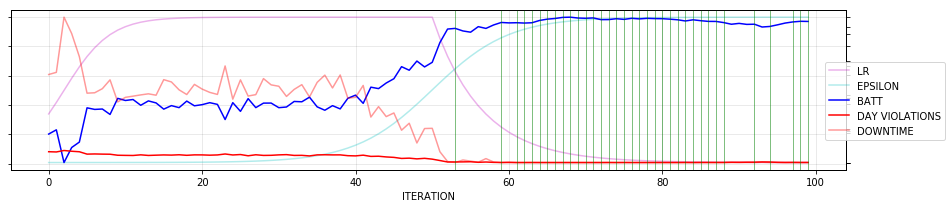

In [78]:
###########################################################################################
###########################################################################################

#PLOT LR AND EPSILON SCHEDULING
fig = plt.figure(figsize=(12,3))
ax = fig.add_subplot(111)
# ax.set_title("LR and EPSILON SCHEDULING V3")
ax.set_xlabel("ITERATION")
# ax.set_ylabel("LR",      color = 'm')
ax.plot(lr_rec,          color = 'm', alpha = 0.3,label="LR")
# ax.tick_params(axis='y', color = 'm')
# ax.ticklabel_format(style='sci', axis='y', scilimits=(-6,-7))
# ax.minorticks_on()

# ax.set_axisbelow(True)
ax.yaxis.set_ticklabels([])

ax.grid(b=True, which='minor', linestyle=':',  color='k', alpha = 0.1)
ax.grid(b=True, which='major', linestyle='-',  color='k', alpha = 0.1)

ax_ = ax.twinx()
# ax_.set_ylabel("EPSILON", color = 'c')
# ax_.tick_params(axis='y', color = 'c')
# ax_.set_axisbelow(True)
# ax_.minorticks_on()
ax_.plot(e_rec,           color = 'c', alpha = 0.3, label="EPSILON")
ax_.yaxis.set_ticklabels([])

# Plot the average reward log
ax1 = ax.twinx()
# ax1.set_ylabel("Terminal Reward", color = 'b')
# ax1.set_ylim([-10,2]);
ax1.plot(avg_reward_rec,'b',label="BATT")
# ax1.tick_params(axis='y', colors='b')
ax1.yaxis.set_ticklabels([])

# Plot the violation record log
ax2 = ax.twinx()
# ax2.set_ylabel("Violations",color = 'r')
ax2.plot(day_violation_rec,'r', label="DAY VIOLATIONS")
ax2.plot(batt_violation_rec,'r',alpha=0.4, label="DOWNTIME")
for xpt in np.argwhere(batt_violation_rec<1):
    ax2.axvline(x=xpt,color='g',linewidth='0.5')
# ax2.set_ylim([0,50]);
# ax2.tick_params(axis='y', colors='r')
ax2.yaxis.set_ticklabels([])

fig.legend(bbox_to_anchor=(1.1, 0.7))


fig.tight_layout()

###########################################################################################
###########################################################################################

ITERATION #0 :  LR = 3.39e-05 @ EPSILON = 0.50
ITERATION #10:  LR = 9.35e-05 @ EPSILON = 0.50
ITERATION #20:  LR = 9.98e-05 @ EPSILON = 0.50
ITERATION #50:  LR = 1.00e-04 @ EPSILON = 0.75
ITERATION #80:  LR = 1.59e-06 @ EPSILON = 1.00
ITERATION #99:  LR = 7.36e-07 @ EPSILON = 1.00


In [30]:
S_FILENAME = './models/'+ 'demo_'+ MODELNAME
# S_FILENAME = './models/'+ MODELNAME
print("Loading MODEL from FILE: ", S_FILENAME)
dqn = DQN()
dqn.eval_net.load_state_dict(torch.load(S_FILENAME))
dqn.eval_net.eval()
print("DEVICE: ", dqn.device)

Loading MODEL from FILE:  ./models/demo_I1_230.pt
DEVICE:  cpu


***MEASURING PERFORMANCE OF THE MODEL***


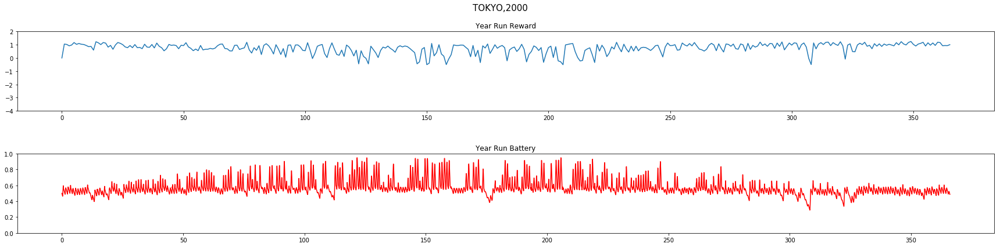

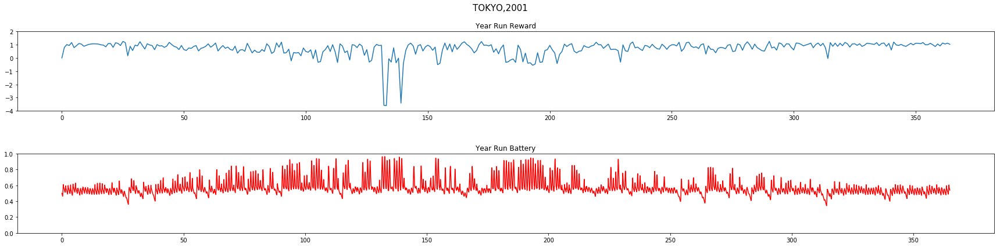

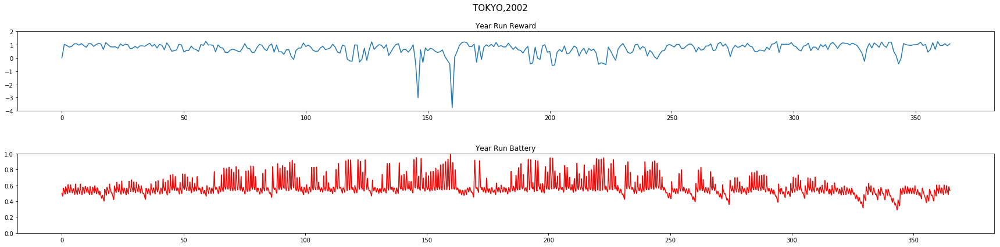

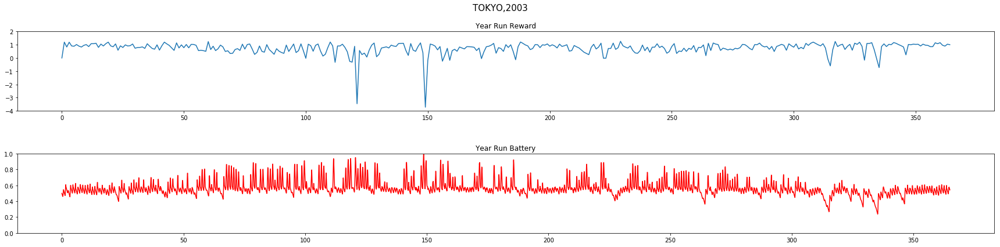

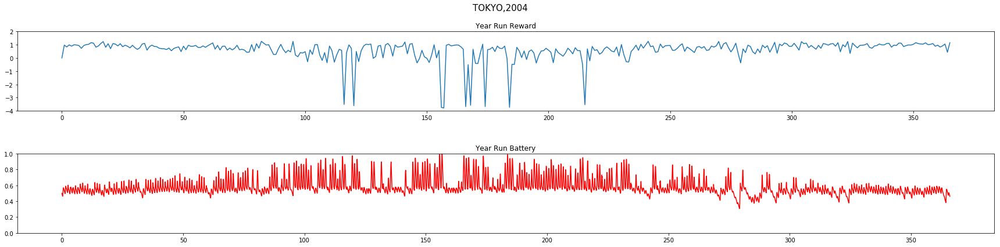

...

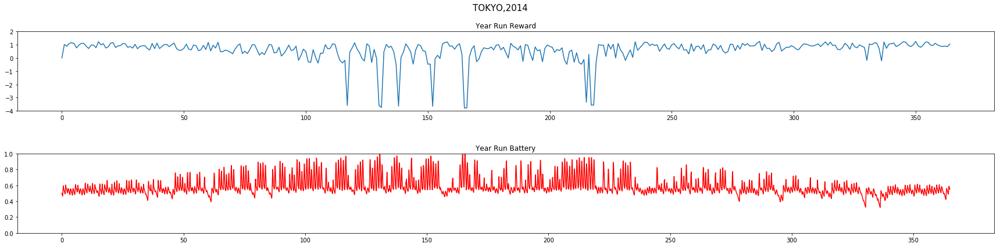

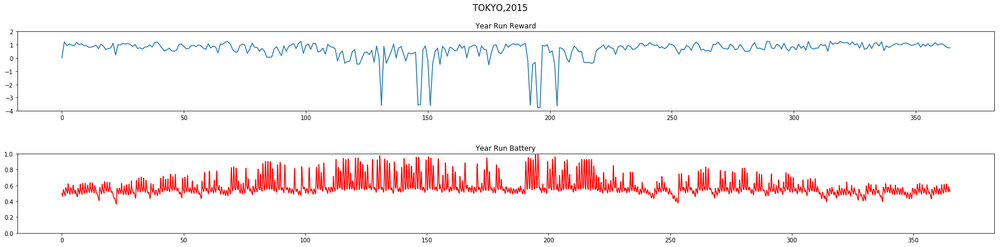

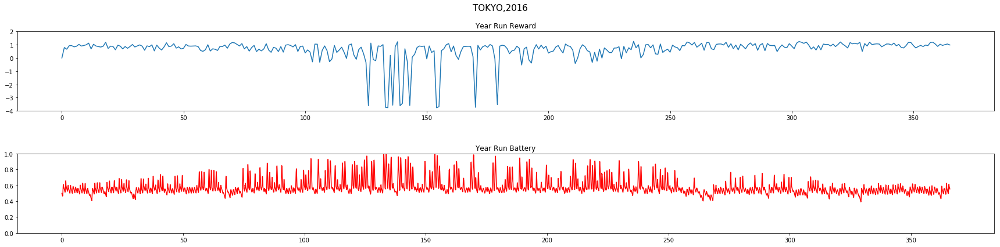

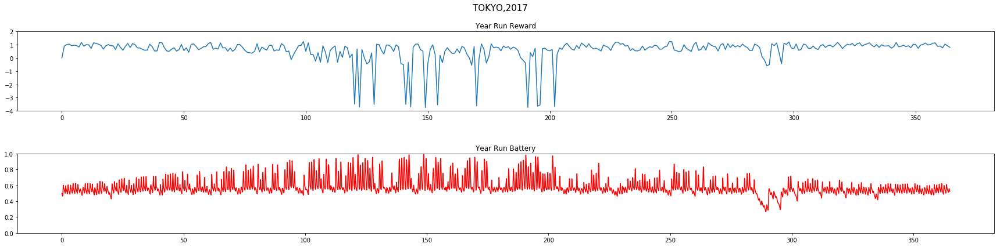

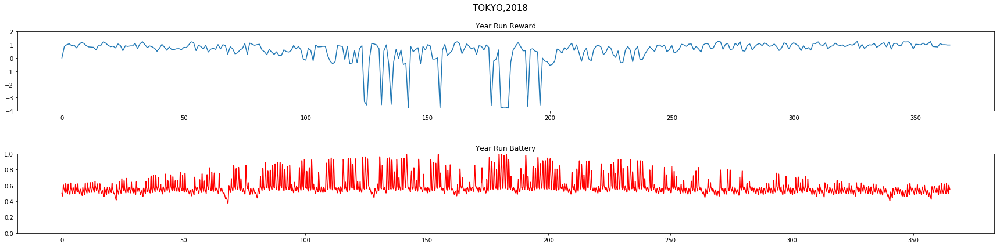

In [31]:
#VALIDATION PHASE
print("***MEASURING PERFORMANCE OF THE MODEL***")
results = np.empty(4)
LOCATION = 'tokyo'
for YEAR in np.arange(2000,2019):
    capm      = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
    capm.eno  = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
    capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

    s, r, day_end, year_end = capm.reset()
    yr_test_record = np.empty(4)

    while True:
        a = dqn.choose_greedy_action(stdize(s))
        yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action
        s_, r, day_end, year_end = capm.step(a)
        if year_end:
            break
        s = s_

    yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
    yr_test_reward_rec = yr_test_record[:,2]
    yr_test_reward_rec = yr_test_reward_rec[::24] #annual average reward
    results = np.vstack((results, [int(YEAR), np.mean(yr_test_reward_rec), int(capm.violation_counter), int(capm.batt_violations)]))
    
###########################################################################################
###########################################################################################
    #     Plot the reward and battery for the entire year run
    title = LOCATION.upper() + ',' + str(YEAR)
    NO_OF_DAYS = capm.eno.NO_OF_DAYS

    fig = plt.figure(figsize=(24,6))
    fig.suptitle(title, fontsize=15)
    
    ax1 = fig.add_subplot(211)
    ax1.plot(yr_test_reward_rec)
    ax1.set_title("\n\nYear Run Reward")
    ax1.set_ylim([-4,2])
    
    ax2 = fig.add_subplot(212)
    ax2.plot(yr_test_record[:,0],'r')
    ax2.set_title("\n\nYear Run Battery")
    ax2.set_ylim([0,1])
    plt.sca(ax2)
    plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
    fig.tight_layout()
    plt.show()
###########################################################################################
###########################################################################################


In [32]:
results = np.delete(results,0,0)
print('YEAR\tAVG_RWD\t\tVIOLATIONS')
print('\t\t\t\tDAY\tBATT')

for x in np.arange(0,results.shape[0]):
    print('{}\t {}\t\t{}\t {}'.format(int(results[x,0]), np.around(results[x,1],2), int(results[x,2]), int(results[x,-1])))

print("\nTOTAL Day Violations:  ",np.sum(results[:, 2]))
print("TOTAL Batt Violations: ",np.sum(results[:,-1]))
print("************************************")

YEAR	AVG_RWD		VIOLATIONS
				DAY	BATT
2000	 0.74		0	 0
2001	 0.72		3	 0
2002	 0.69		2	 2
2003	 0.74		2	 0
2004	 0.6		9	 2
2005	 0.74		2	 0
2006	 0.78		1	 0
2007	 0.63		10	 2
2008	 0.73		2	 0
2009	 0.69		5	 0
2010	 0.64		8	 1
2011	 0.64		7	 0
2012	 0.61		7	 1
2013	 0.57		12	 7
2014	 0.59		10	 4
2015	 0.63		8	 0
2016	 0.63		11	 3
2017	 0.58		12	 0
2018	 0.55		13	 5

TOTAL Day Violations:   124.0
TOTAL Batt Violations:  27.0
************************************


In [33]:
print('\nRun time: {}'.format(datetime.now() - tic))


Run time: 0:58:47.095750


In [34]:
LOCATION = 'tokyo'
YEAR = 2003

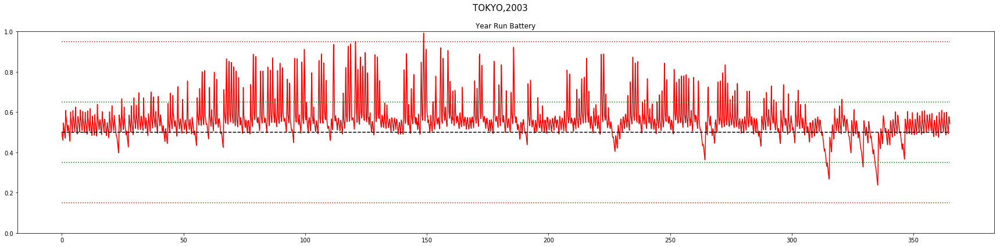

In [35]:
capm = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
capm.eno = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

s, r, day_end, year_end = capm.reset()
yr_test_record = np.empty(4)

while True:
    a = dqn.choose_greedy_action(stdize(s))

    #state = [batt, enp, henergy, fcast]
    yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

    # take action
    s_, r, day_end, year_end = capm.step(a)

    if year_end:
        break

    s = s_

yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
yr_test_reward_rec = yr_test_record[:,2]
yr_test_reward_rec = yr_test_reward_rec[::24]

title = LOCATION.upper() + ',' + str(YEAR)
NO_OF_DAYS = capm.eno.NO_OF_DAYS

fig = plt.figure(figsize=(24,6))
fig.suptitle(title, fontsize=15)

#     ax1 = fig.add_subplot(211)
#     ax1.plot(yr_test_reward_rec)
#     ax1.set_title("\n\nYear Run Reward")
#     ax1.set_ylim([-3,3])

#Plot the reward and battery for the entire year run
ax2 = fig.add_subplot(111)
ax2.plot(yr_test_record[:,0],'r')
ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')
ax2.set_title("\n\nYear Run Battery")
ax2.set_ylim([0,1])
plt.sca(ax2)
plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
fig.tight_layout()
plt.show()

In [36]:
DAY_START = 320
DAY_END   = 325

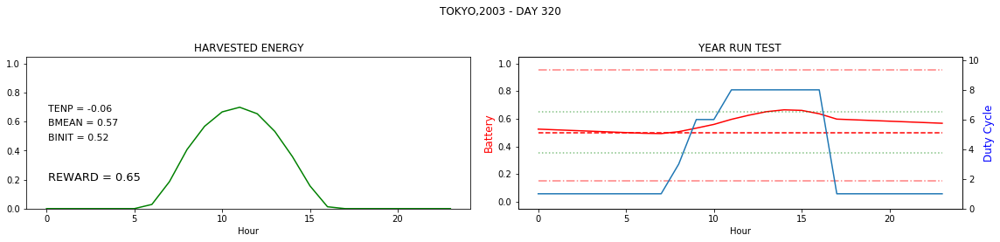

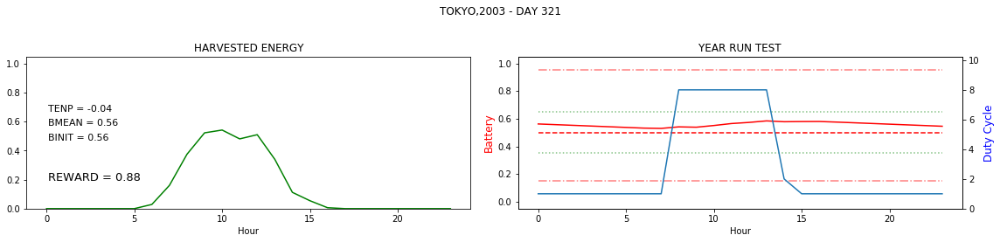

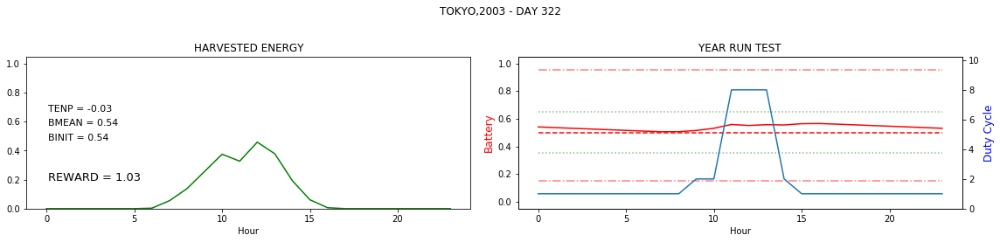

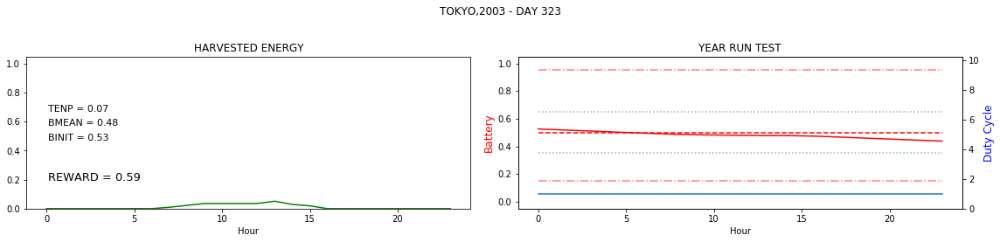

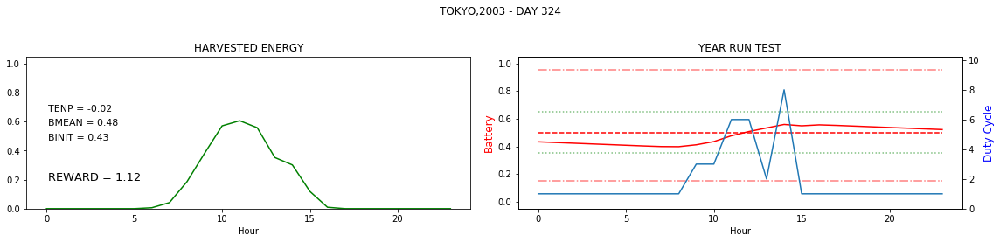

In [37]:
#Plot the reward and battery for the entire year run on a day by day basis
title = LOCATION.upper() + ',' + str(YEAR)
TIME_AXIS = np.arange(0,capm.eno.TIME_STEPS)
for DAY in range(DAY_START,DAY_END):
    START = DAY*24
    END = START+24

    daytitle = title + ' - DAY ' + str(DAY)
    fig = plt.figure(figsize=(16,4))
    st = fig.suptitle(daytitle)

    ax2 = fig.add_subplot(121)
    ax2.plot(yr_test_record[START:END,1],'g')
    ax2.set_title("HARVESTED ENERGY")
    ax2.set_xlabel("Hour")
    ax2.set_ylim([0,1.05])
    
    ax2.text(0.1, 0.6, "TENP = %.2f\n" %(capm.BOPT/capm.BMAX-yr_test_record[END,0]),fontsize=11, ha='left')
    ax2.text(0.1, 0.5, "BMEAN = %.2f\n" %(np.mean(yr_test_record[START:END,0])),fontsize=11, ha='left')
    ax2.text(0.1, 0.4, "BINIT = %.2f\n" %(yr_test_record[START,0]),fontsize=11, ha='left')
    if END < (capm.eno.NO_OF_DAYS*capm.eno.TIME_STEPS):
        ax2.text(0.1, 0.1, "REWARD = %.2f\n" %(yr_test_record[END,2]),fontsize=13, ha='left')
        
    #plot battery for year run
    ax1 = fig.add_subplot(122)
    ax1.plot(TIME_AXIS,              yr_test_record[START:END,0],'r')
    ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BOPT/capm.BMAX, 'r--')
    ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BLIM_LO/capm.BMAX, 'r-.',alpha=0.5)
    ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BLIM_HI/capm.BMAX, 'r-.',alpha=0.5)
    ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:',alpha=0.5)
    ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:',alpha=0.5)
    
    ax1.set_title("YEAR RUN TEST")
    ax1.set_xlabel("Hour")
    ax1.set_ylabel('Battery', color='r',fontsize=12)
    ax1.set_ylim([-0.05,1.05])

    #plot actions for year run
    ax1a = ax1.twinx()
    ax1a.plot(yr_test_record[START:END,3]+1)
    ax1a.set_ylim([0,N_ACTIONS])
    ax1a.set_ylabel('Duty Cycle', color='b',fontsize=12)
    ax1a.set_ylim([0,10.25])


    fig.tight_layout()
    st.set_y(0.95)
    fig.subplots_adjust(top=0.75)
    plt.show()